<a href="https://colab.research.google.com/github/zfewkes/SI-206-Final-Project/blob/master/Copy_of_Copy_of_Donut_2D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns; sns.set_theme()
sns.set(rc={'figure.figsize':(5,5)})
sns.set_style(style='white')
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import copy
from tqdm import tqdm
%matplotlib inline

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
class Donut():

    def __init__(self, center, r1, r2):
        self.center = torch.tensor(center)
        self.r1 = r1
        self.r2 = r2

    def inside(self, x):
        center = torch.cat((self.center[0]*torch.ones(x.shape[0],1),
                            self.center[1]*torch.ones(x.shape[0],1)), dim=1)
        dist = torch.norm(x-self.center, dim=1).flatten()
        return ((dist>self.r1).int() + (dist<self.r2).int() == 2).int()

In [ ]:
class Transform():

    def __init__(self, name, theta):
        self.name = name
        self.theta = theta

    def __call__(self, x):
        if self.name == 'id':
            return x
        if self.name == 'shift':
            return self.shift(x, self.theta)
        if self.name == 'dilate':
            return self.dilate(x, self.theta)

    def inverse(self, x):
        if self.name == 'id':
            return x
        if self.name == 'shift':
            return self.shift_inv(x, self.theta)
        if self.name == 'dilate':
            return self.dilate(x, [1/self.theta[0], self.theta[1]])

    def shift(self, x, theta):
        return x + torch.cat((theta[0]*torch.ones(x.shape[0],1),
                              theta[1]*torch.ones(x.shape[0],1)), dim=1)
    
    def shift_inv(self, x, theta):
        return self.shift(x, [(-1)*theta[0],(-1)*theta[1]])

    def dilate(self, x, theta):
        x = self.shift_inv(x, theta[1])
        x = torch.matmul(x, theta[0]*torch.eye(2))
        return self.shift(x, theta[1])

In [ ]:
class Plotter():

    def __init__(self, domain, step):
        a,b,c,d = tuple(domain)
        self.pix = torch.cartesian_prod(torch.flip(torch.arange(c,d,step),[0]),
                                        torch.arange(a,b,step))
        self.dim = int((b-a)/step), int((d-c)/step)

    def heat(self, func):
        ax = sns.heatmap(torch.reshape(func(self.pix).detach(), self.dim), vmin = 0, vmax = 1, cmap="YlGnBu")
        plt.show()
        return
    
    def scatter(self, x, y):
        data = list(zip(x[:,0].numpy(), x[:,1].numpy(), y[:].numpy()))
        df = pd.DataFrame(data, columns=['0','1','2'])
        ax = sns.scatterplot(x='0', y='1', hue='2', data=df, s=50, legend=False, marker='.')
        ax.set(xlabel=None, ylabel=None)
        plt.show()

In [ ]:
class Data():

    def __init__(self, domain, size, shape, plotter):
        self.domain = domain
        self.size = size
        self.shape = shape
        self.plotter = plotter
        self.transform = None
        
    def sample(self):
        a,b,c,d = tuple(self.domain)
        return torch.cat((abs(b-a)*torch.rand(self.size,1)+a,
                          abs(d-c)*torch.rand(self.size,1)+c), dim=1)

    def original(self):
        x = self.sample()
        y = self.shape.inside(x)
        print('Data distribution:')
        self.plotter.heat(self.shape.inside)
        print('\nData points:')
        self.plotter.scatter(x, y)
        return x, y

    def helper(self, x):
        return self.shape.inside(self.transform.inverse(x))

    def transformed(self, transform):
        self.transform = transform
        x = self.sample()
        y = self.shape.inside(self.transform.inverse(x))
        self.transform = transform
        print('Data distribution:')
        self.plotter.heat(self.helper)
        print('\nData points:')
        self.plotter.scatter(x, y)
        return x, y

In [ ]:
class Net(nn.Module):
    
    def __init__(self, in_features=2, hidden_features=20, out_features=1, depth=3):
        super().__init__()
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.fc2 = nn.Linear(hidden_features, hidden_features)
        self.fc3 = nn.Linear(hidden_features, out_features)
        self.depth = depth
        return
    
    def forward(self, x):
        x = F.relu(self.fc1(x))
        for _ in range(self.depth-2):
            x = F.relu(self.fc2(x))
        return torch.sigmoid(self.fc3(x))

In [ ]:
def train(model, x_train, y_train, num_epochs, batch_size, plotter):
    optimizer = optim.Adam(params=model.parameters(), lr=0.01)
    criterion = nn.BCELoss()
    inputs = torch.split(x_train, batch_size, dim=0)
    labels = torch.split(y_train, batch_size, dim=0)
    for epoch in range(num_epochs):
        print('\nEpoch {}/{}'.format(epoch+1, num_epochs))
        for batch_inputs, batch_labels in tqdm(zip(inputs, labels), total=len(inputs)):
            optimizer.zero_grad()
            batch_outputs = model(batch_inputs).flatten()
            batch_loss = criterion(batch_outputs.float(), batch_labels.float())
            batch_loss.backward()
            optimizer.step()
        plotter.heat(model)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:1069: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.cartesian_prod(tensors)  # type: ignore[attr-defined]


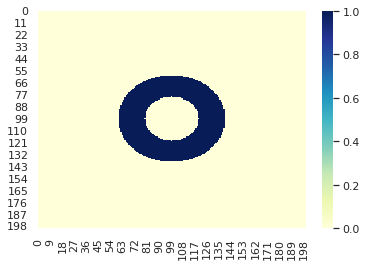

In [ ]:
donut = Donut([0,0], 2, 4)
domain = [-10, 10, -10, 10]
plotter = Plotter(domain, 0.1)
plotter.heat(donut.inside)

Data distribution:


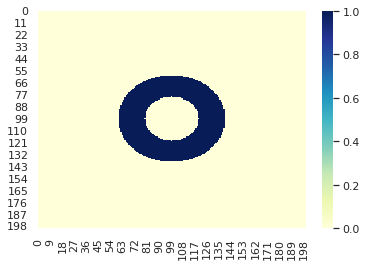


Data points:


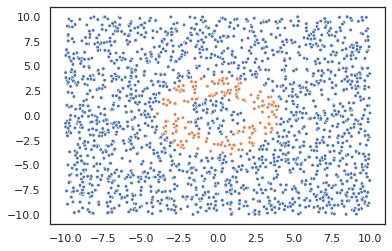

In [ ]:
data = Data(domain, 2000, donut, plotter)
x_original, y_original = data.original()

Data distribution:


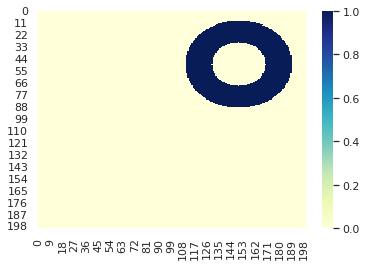


Data points:


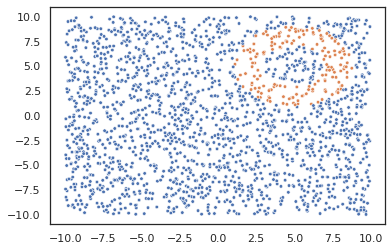

In [ ]:
shift = Transform('shift', [5,5])
x_shift, y_shift = data.transformed(shift)

Data distribution:


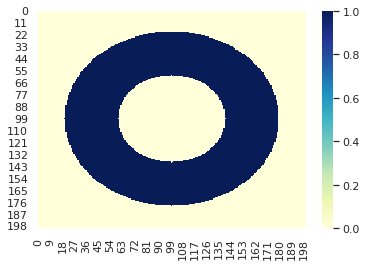


Data points:


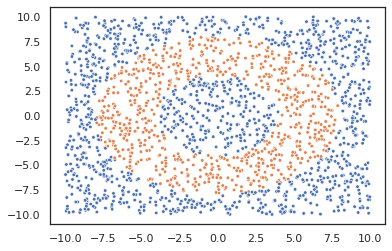

In [ ]:
dilate = Transform('dilate', [2,[0,0]])
x_dilate, y_dilate = data.transformed(dilate)


Epoch 1/100


100%|██████████| 20/20 [00:00<00:00, 251.92it/s]


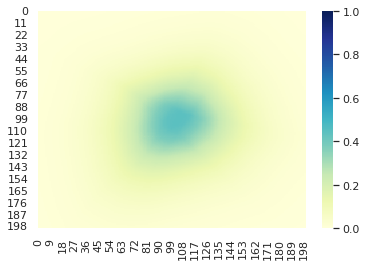


Epoch 2/100


100%|██████████| 20/20 [00:00<00:00, 660.79it/s]


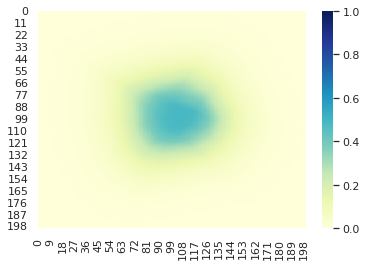


Epoch 3/100


100%|██████████| 20/20 [00:00<00:00, 854.62it/s]


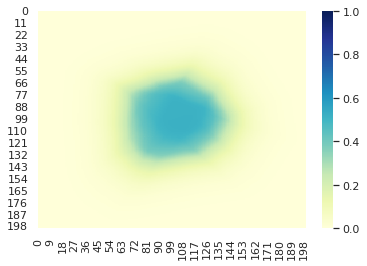


Epoch 4/100


100%|██████████| 20/20 [00:00<00:00, 646.49it/s]


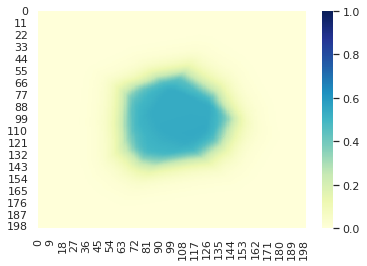


Epoch 5/100


100%|██████████| 20/20 [00:00<00:00, 819.55it/s]


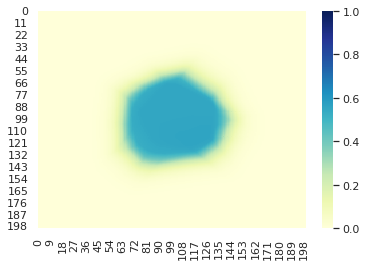


Epoch 6/100


100%|██████████| 20/20 [00:00<00:00, 904.22it/s]


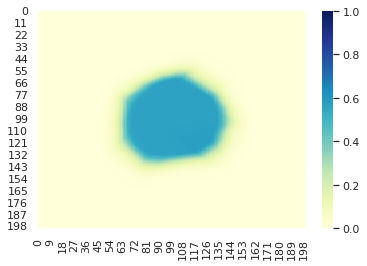


Epoch 7/100


100%|██████████| 20/20 [00:00<00:00, 667.57it/s]


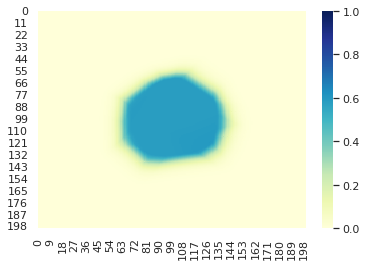


Epoch 8/100


100%|██████████| 20/20 [00:00<00:00, 723.80it/s]


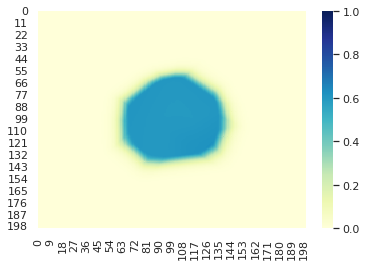


Epoch 9/100


100%|██████████| 20/20 [00:00<00:00, 488.70it/s]


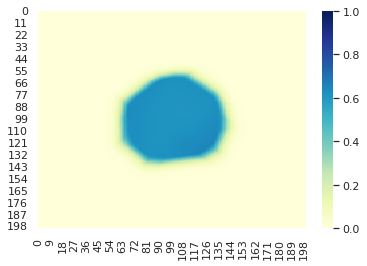


Epoch 10/100


100%|██████████| 20/20 [00:00<00:00, 676.45it/s]


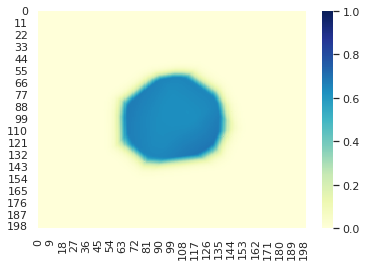


Epoch 11/100


100%|██████████| 20/20 [00:00<00:00, 572.70it/s]


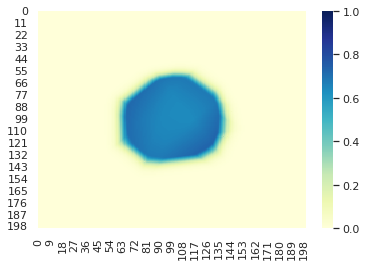


Epoch 12/100


100%|██████████| 20/20 [00:00<00:00, 521.45it/s]


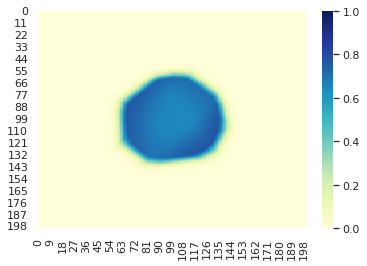


Epoch 13/100


100%|██████████| 20/20 [00:00<00:00, 588.80it/s]


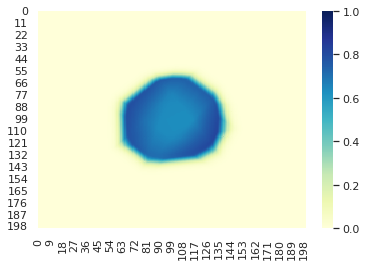


Epoch 14/100


100%|██████████| 20/20 [00:00<00:00, 474.75it/s]


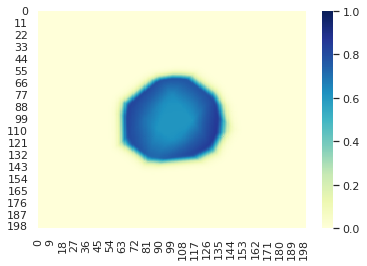


Epoch 15/100


100%|██████████| 20/20 [00:00<00:00, 532.71it/s]


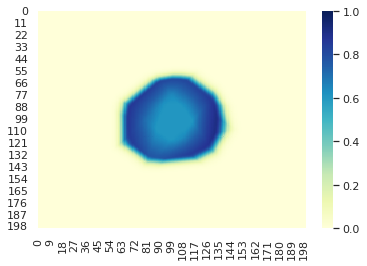


Epoch 16/100


100%|██████████| 20/20 [00:00<00:00, 658.97it/s]


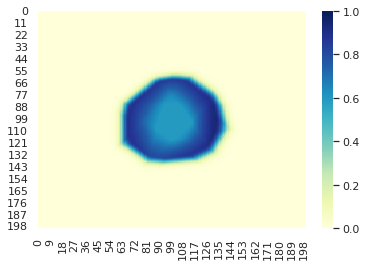


Epoch 17/100


100%|██████████| 20/20 [00:00<00:00, 522.03it/s]


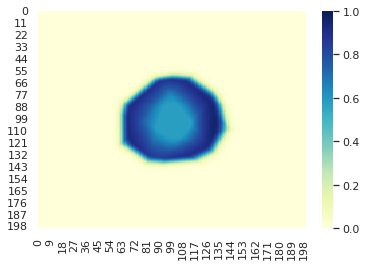


Epoch 18/100


100%|██████████| 20/20 [00:00<00:00, 607.76it/s]


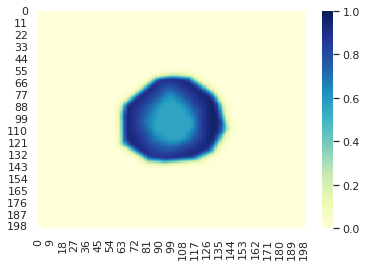


Epoch 19/100


100%|██████████| 20/20 [00:00<00:00, 528.04it/s]


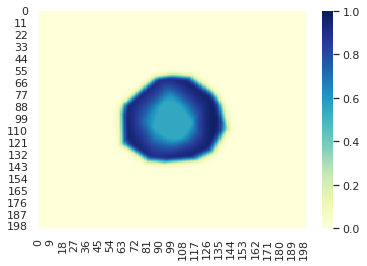


Epoch 20/100


100%|██████████| 20/20 [00:00<00:00, 567.12it/s]


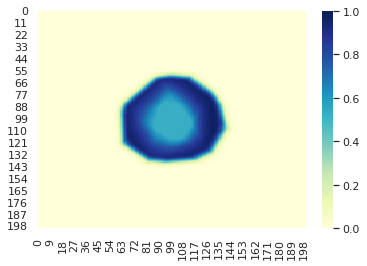


Epoch 21/100


100%|██████████| 20/20 [00:00<00:00, 468.19it/s]


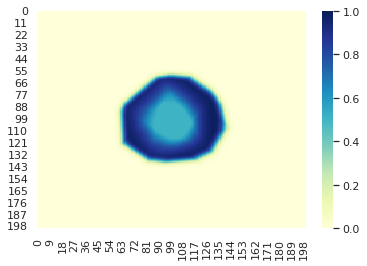


Epoch 22/100


100%|██████████| 20/20 [00:00<00:00, 495.01it/s]


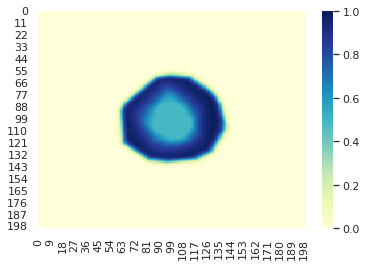


Epoch 23/100


100%|██████████| 20/20 [00:00<00:00, 489.61it/s]


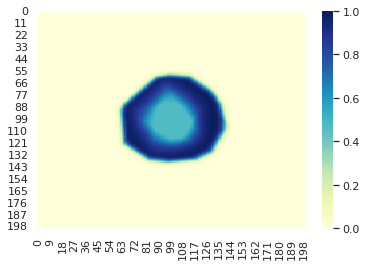


Epoch 24/100


100%|██████████| 20/20 [00:00<00:00, 482.91it/s]


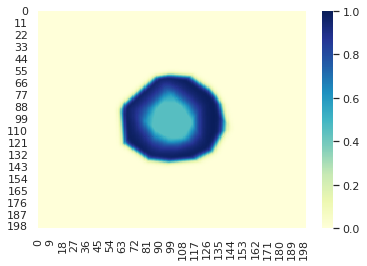


Epoch 25/100


100%|██████████| 20/20 [00:00<00:00, 382.56it/s]


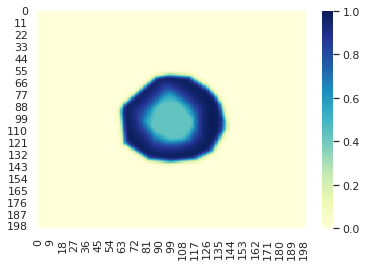


Epoch 26/100


100%|██████████| 20/20 [00:00<00:00, 428.04it/s]


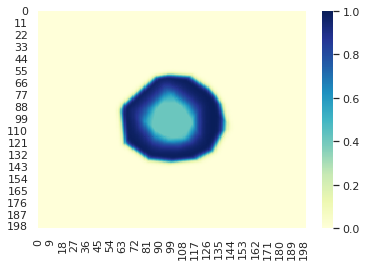


Epoch 27/100


100%|██████████| 20/20 [00:00<00:00, 441.31it/s]


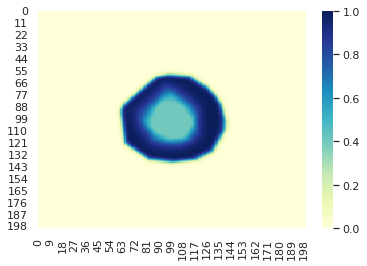


Epoch 28/100


100%|██████████| 20/20 [00:00<00:00, 466.17it/s]


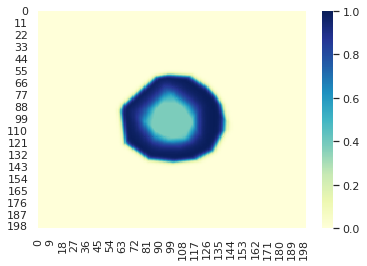


Epoch 29/100


100%|██████████| 20/20 [00:00<00:00, 429.49it/s]


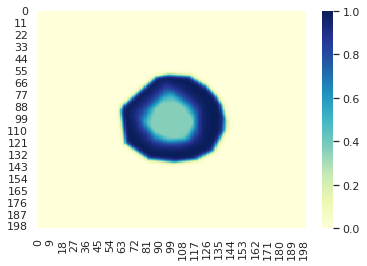


Epoch 30/100


100%|██████████| 20/20 [00:00<00:00, 427.97it/s]


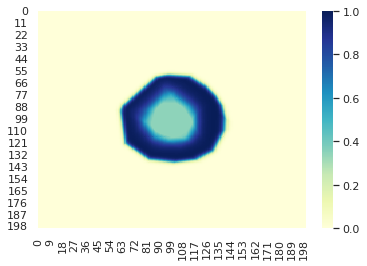


Epoch 31/100


100%|██████████| 20/20 [00:00<00:00, 477.69it/s]


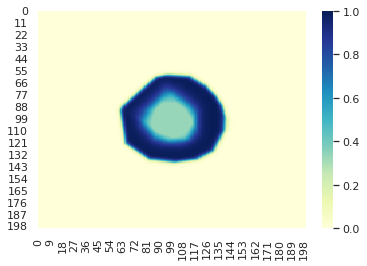


Epoch 32/100


100%|██████████| 20/20 [00:00<00:00, 512.27it/s]


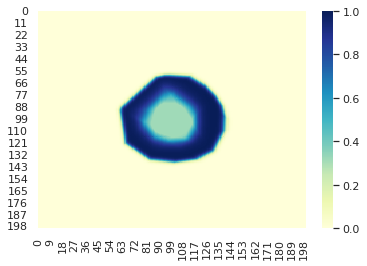


Epoch 33/100


100%|██████████| 20/20 [00:00<00:00, 441.79it/s]


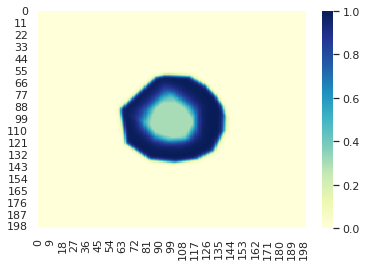


Epoch 34/100


100%|██████████| 20/20 [00:00<00:00, 494.12it/s]


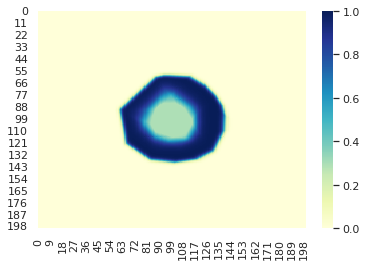


Epoch 35/100


100%|██████████| 20/20 [00:00<00:00, 463.59it/s]


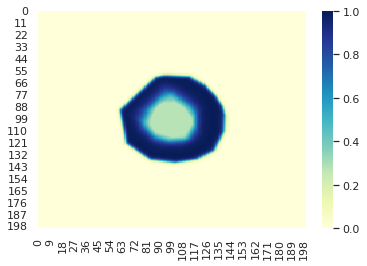


Epoch 36/100


100%|██████████| 20/20 [00:00<00:00, 446.40it/s]


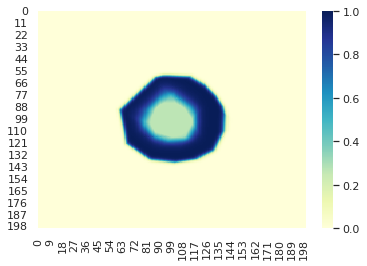


Epoch 37/100


100%|██████████| 20/20 [00:00<00:00, 411.27it/s]


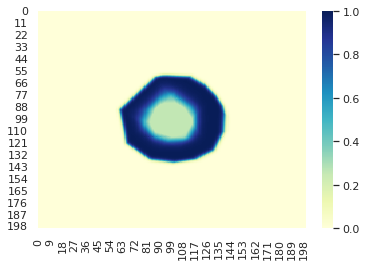


Epoch 38/100


100%|██████████| 20/20 [00:00<00:00, 206.01it/s]


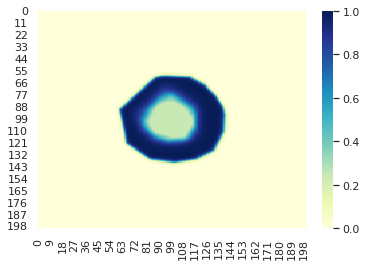


Epoch 39/100


100%|██████████| 20/20 [00:00<00:00, 105.37it/s]


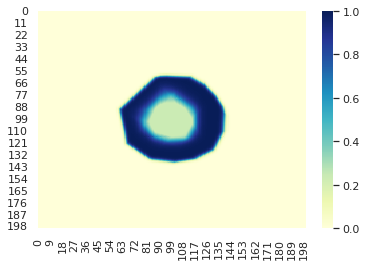


Epoch 40/100


100%|██████████| 20/20 [00:00<00:00, 567.98it/s]


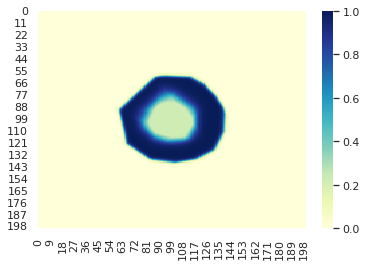


Epoch 41/100


100%|██████████| 20/20 [00:00<00:00, 567.60it/s]


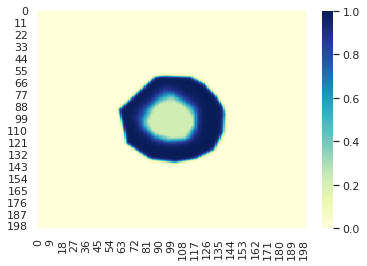


Epoch 42/100


100%|██████████| 20/20 [00:00<00:00, 491.35it/s]


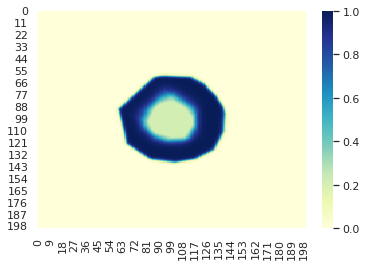


Epoch 43/100


100%|██████████| 20/20 [00:00<00:00, 515.23it/s]


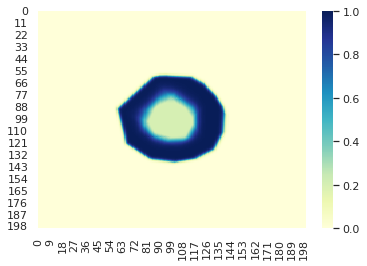


Epoch 44/100


100%|██████████| 20/20 [00:00<00:00, 603.83it/s]


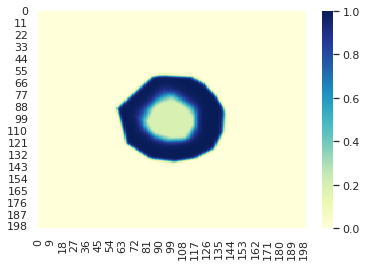


Epoch 45/100


100%|██████████| 20/20 [00:00<00:00, 476.19it/s]


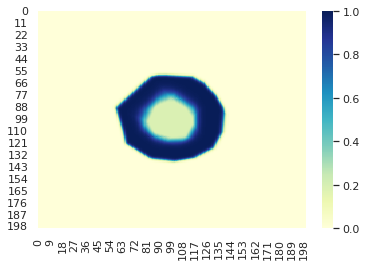


Epoch 46/100


100%|██████████| 20/20 [00:00<00:00, 589.96it/s]


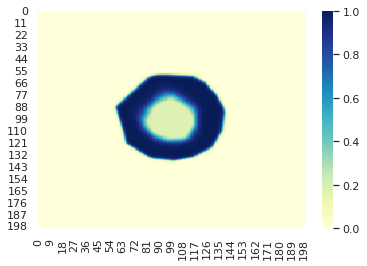


Epoch 47/100


100%|██████████| 20/20 [00:00<00:00, 563.04it/s]


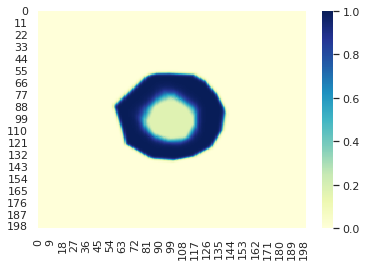


Epoch 48/100


100%|██████████| 20/20 [00:00<00:00, 617.42it/s]


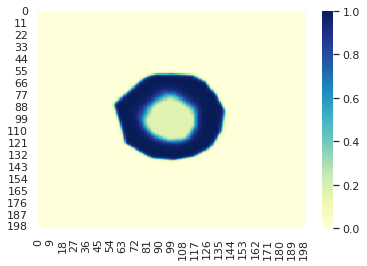


Epoch 49/100


100%|██████████| 20/20 [00:00<00:00, 609.81it/s]


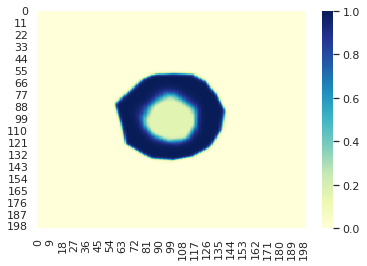


Epoch 50/100


100%|██████████| 20/20 [00:00<00:00, 565.81it/s]


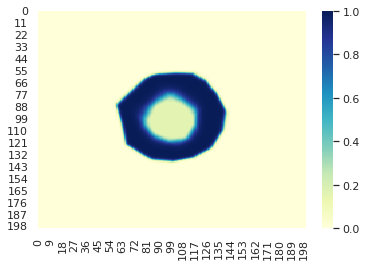


Epoch 51/100


100%|██████████| 20/20 [00:00<00:00, 554.80it/s]


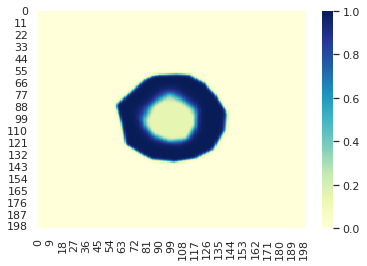


Epoch 52/100


100%|██████████| 20/20 [00:00<00:00, 535.24it/s]


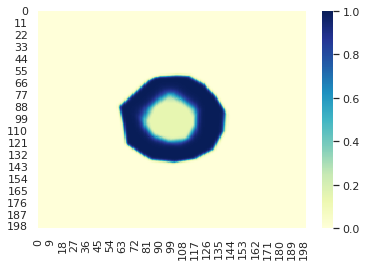


Epoch 53/100


100%|██████████| 20/20 [00:00<00:00, 582.86it/s]


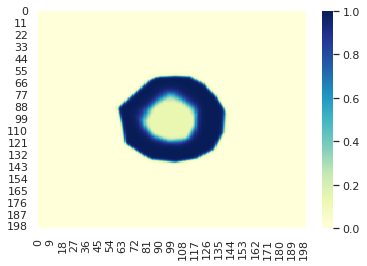


Epoch 54/100


100%|██████████| 20/20 [00:00<00:00, 583.39it/s]


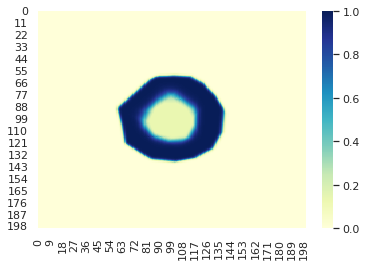


Epoch 55/100


100%|██████████| 20/20 [00:00<00:00, 605.33it/s]


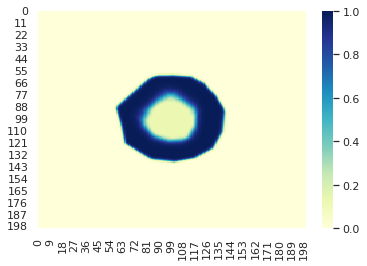


Epoch 56/100


100%|██████████| 20/20 [00:00<00:00, 566.85it/s]


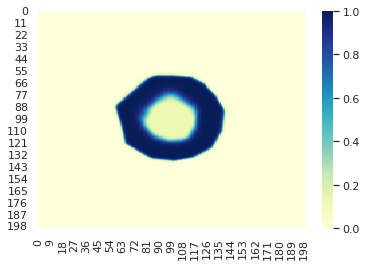


Epoch 57/100


100%|██████████| 20/20 [00:00<00:00, 557.06it/s]


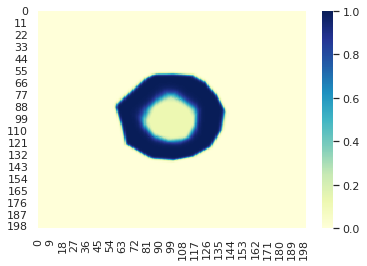


Epoch 58/100


100%|██████████| 20/20 [00:00<00:00, 612.38it/s]


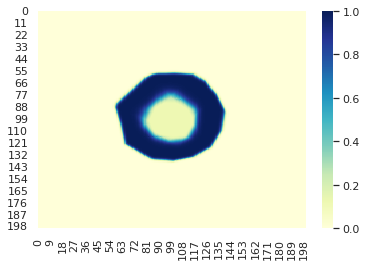


Epoch 59/100


100%|██████████| 20/20 [00:00<00:00, 592.71it/s]


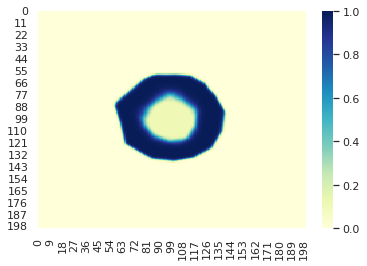


Epoch 60/100


100%|██████████| 20/20 [00:00<00:00, 625.84it/s]


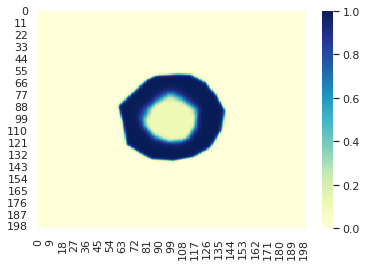


Epoch 61/100


100%|██████████| 20/20 [00:00<00:00, 590.48it/s]


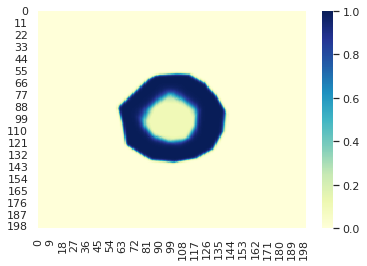


Epoch 62/100


100%|██████████| 20/20 [00:00<00:00, 549.55it/s]


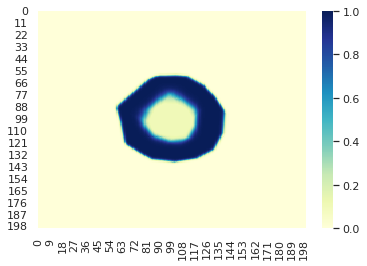


Epoch 63/100


100%|██████████| 20/20 [00:00<00:00, 620.16it/s]


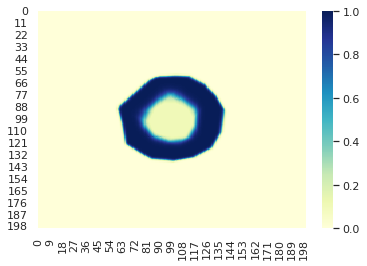


Epoch 64/100


100%|██████████| 20/20 [00:00<00:00, 580.39it/s]


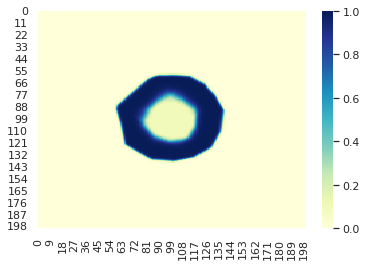


Epoch 65/100


100%|██████████| 20/20 [00:00<00:00, 572.04it/s]


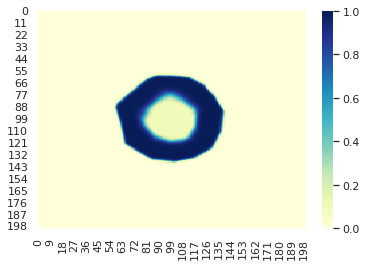


Epoch 66/100


100%|██████████| 20/20 [00:00<00:00, 529.05it/s]


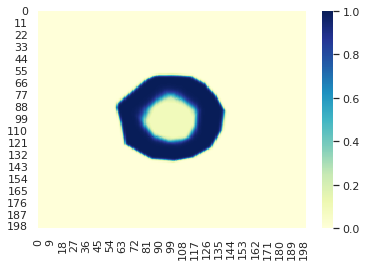


Epoch 67/100


100%|██████████| 20/20 [00:00<00:00, 614.92it/s]


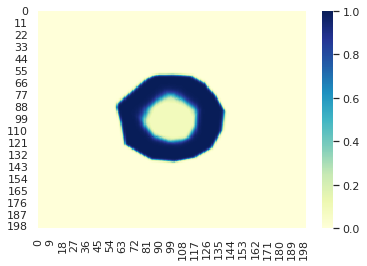


Epoch 68/100


100%|██████████| 20/20 [00:00<00:00, 586.17it/s]


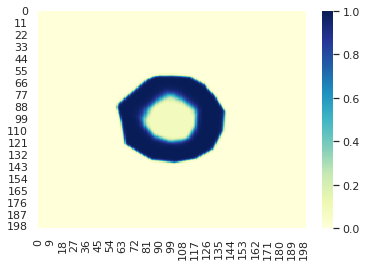


Epoch 69/100


100%|██████████| 20/20 [00:00<00:00, 593.88it/s]


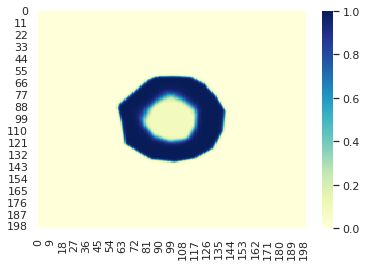


Epoch 70/100


100%|██████████| 20/20 [00:00<00:00, 507.40it/s]


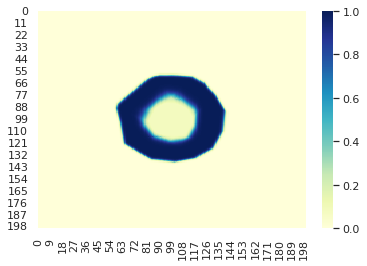


Epoch 71/100


100%|██████████| 20/20 [00:00<00:00, 610.64it/s]


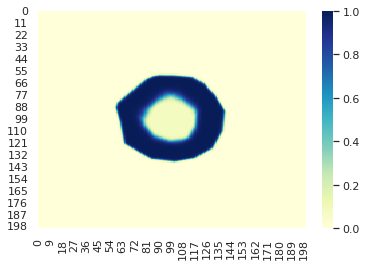


Epoch 72/100


100%|██████████| 20/20 [00:00<00:00, 561.79it/s]


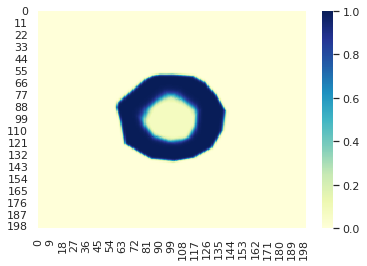


Epoch 73/100


100%|██████████| 20/20 [00:00<00:00, 545.88it/s]


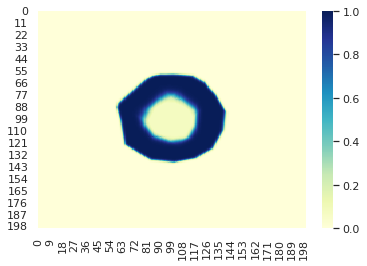


Epoch 74/100


100%|██████████| 20/20 [00:00<00:00, 602.30it/s]


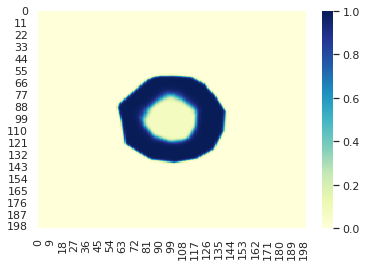


Epoch 75/100


100%|██████████| 20/20 [00:00<00:00, 624.28it/s]


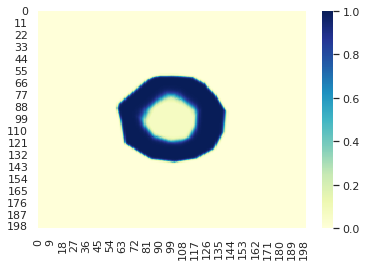


Epoch 76/100


100%|██████████| 20/20 [00:00<00:00, 624.26it/s]


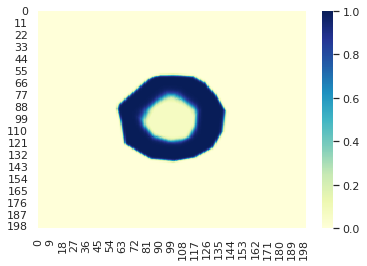


Epoch 77/100


100%|██████████| 20/20 [00:00<00:00, 589.61it/s]


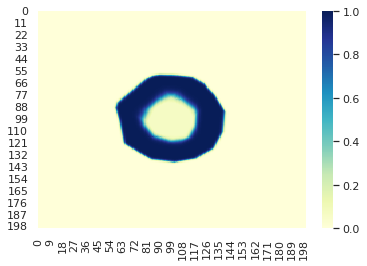


Epoch 78/100


100%|██████████| 20/20 [00:00<00:00, 574.13it/s]


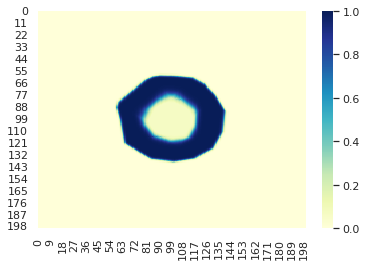


Epoch 79/100


100%|██████████| 20/20 [00:00<00:00, 529.71it/s]


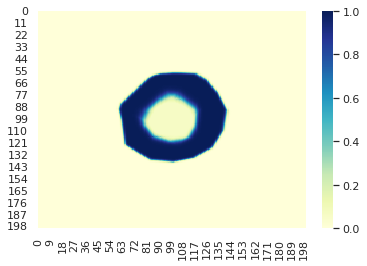


Epoch 80/100


100%|██████████| 20/20 [00:00<00:00, 607.00it/s]


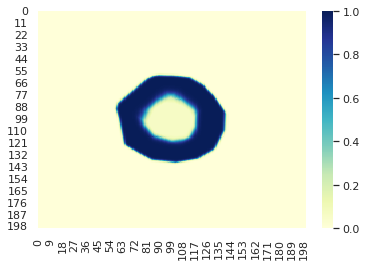


Epoch 81/100


100%|██████████| 20/20 [00:00<00:00, 631.34it/s]


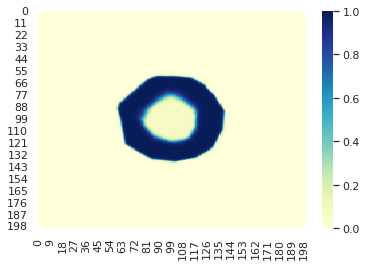


Epoch 82/100


100%|██████████| 20/20 [00:00<00:00, 546.81it/s]


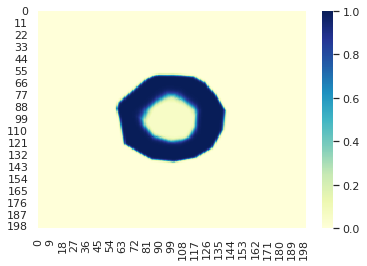


Epoch 83/100


100%|██████████| 20/20 [00:00<00:00, 654.90it/s]


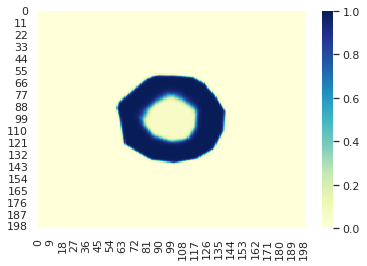


Epoch 84/100


100%|██████████| 20/20 [00:00<00:00, 651.84it/s]


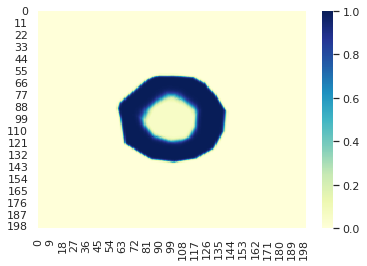


Epoch 85/100


100%|██████████| 20/20 [00:00<00:00, 574.50it/s]


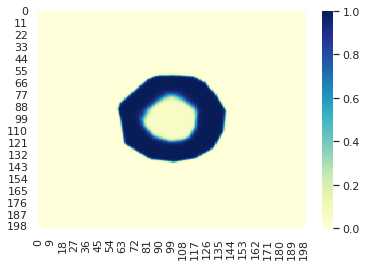


Epoch 86/100


100%|██████████| 20/20 [00:00<00:00, 579.25it/s]


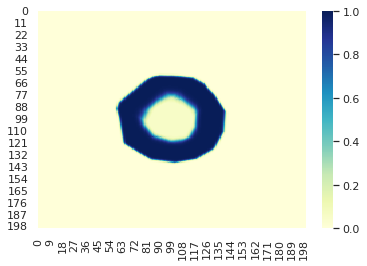


Epoch 87/100


100%|██████████| 20/20 [00:00<00:00, 612.75it/s]


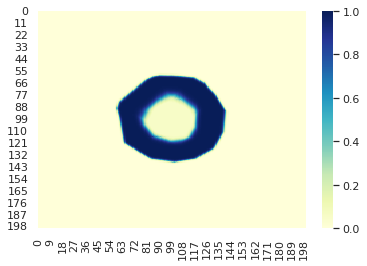


Epoch 88/100


100%|██████████| 20/20 [00:00<00:00, 618.66it/s]


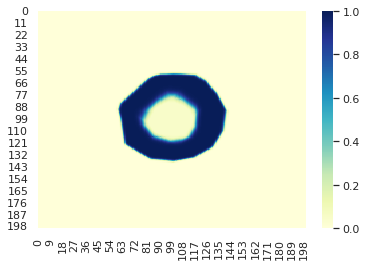


Epoch 89/100


100%|██████████| 20/20 [00:00<00:00, 579.03it/s]


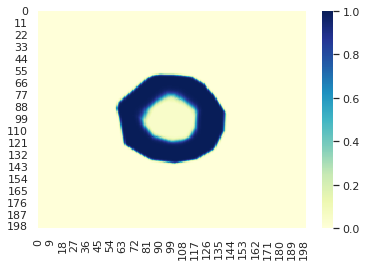


Epoch 90/100


100%|██████████| 20/20 [00:00<00:00, 560.76it/s]


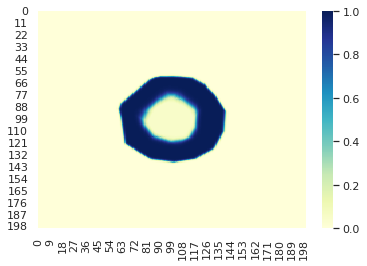


Epoch 91/100


100%|██████████| 20/20 [00:00<00:00, 564.80it/s]


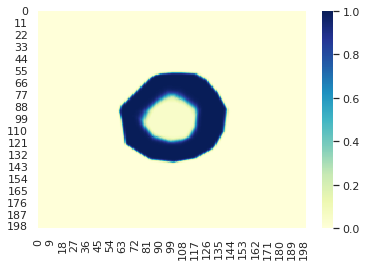


Epoch 92/100


100%|██████████| 20/20 [00:00<00:00, 643.88it/s]


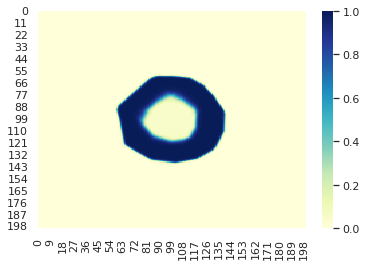


Epoch 93/100


100%|██████████| 20/20 [00:00<00:00, 576.90it/s]


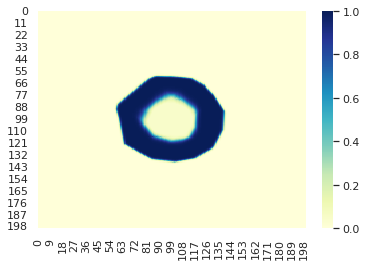


Epoch 94/100


100%|██████████| 20/20 [00:00<00:00, 590.94it/s]


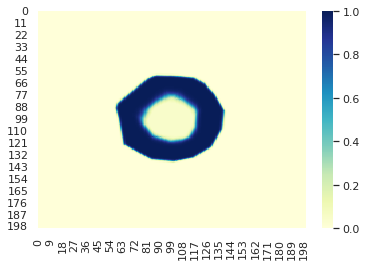


Epoch 95/100


100%|██████████| 20/20 [00:00<00:00, 639.64it/s]


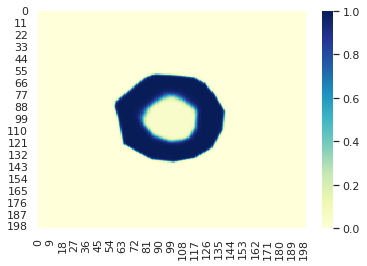


Epoch 96/100


100%|██████████| 20/20 [00:00<00:00, 571.30it/s]


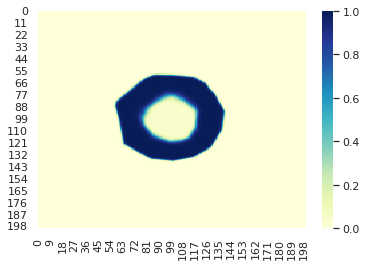


Epoch 97/100


100%|██████████| 20/20 [00:00<00:00, 623.49it/s]


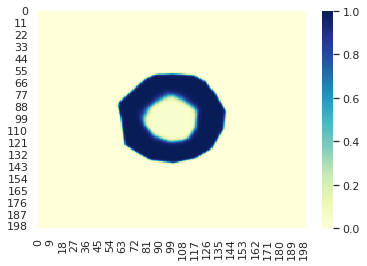


Epoch 98/100


100%|██████████| 20/20 [00:00<00:00, 559.46it/s]


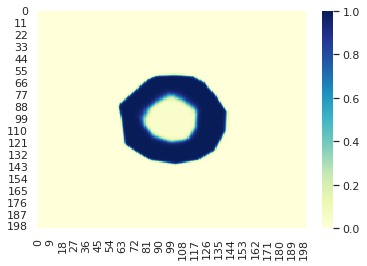


Epoch 99/100


100%|██████████| 20/20 [00:00<00:00, 622.41it/s]


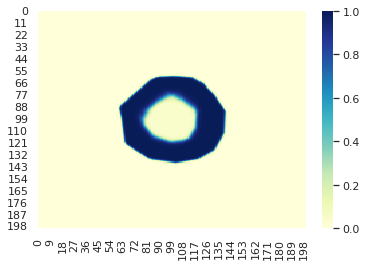


Epoch 100/100


100%|██████████| 20/20 [00:00<00:00, 626.60it/s]


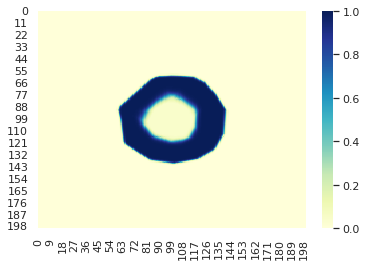

In [ ]:
model_original = Net()
train(model_original, x_original, y_original, 100, 100, plotter)


Epoch 1/150


100%|██████████| 20/20 [00:00<00:00, 584.12it/s]


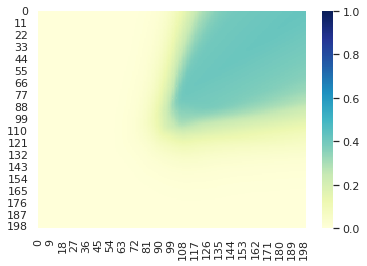


Epoch 2/150


100%|██████████| 20/20 [00:00<00:00, 875.24it/s]


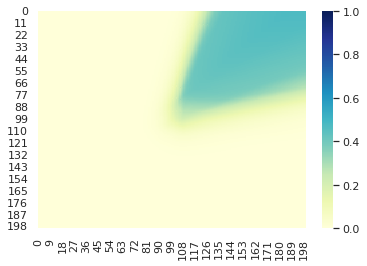


Epoch 3/150


100%|██████████| 20/20 [00:00<00:00, 791.36it/s]


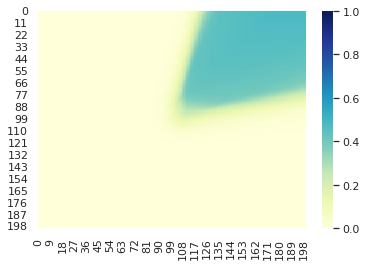


Epoch 4/150


100%|██████████| 20/20 [00:00<00:00, 679.47it/s]


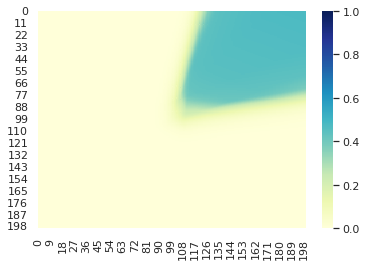


Epoch 5/150


100%|██████████| 20/20 [00:00<00:00, 812.10it/s]


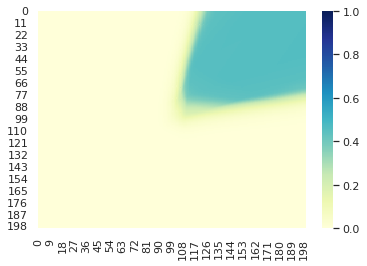


Epoch 6/150


100%|██████████| 20/20 [00:00<00:00, 753.06it/s]


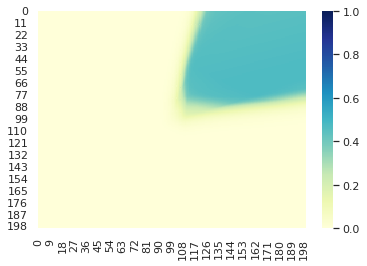


Epoch 7/150


100%|██████████| 20/20 [00:00<00:00, 629.15it/s]


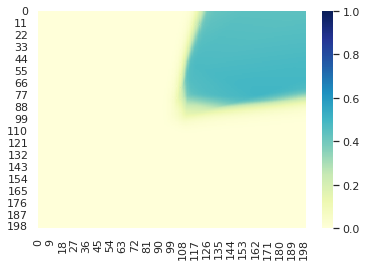


Epoch 8/150


100%|██████████| 20/20 [00:00<00:00, 673.40it/s]


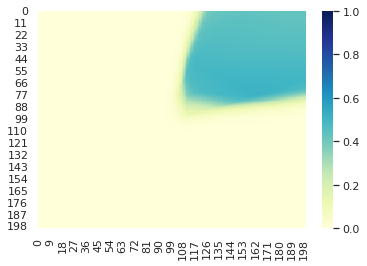


Epoch 9/150


100%|██████████| 20/20 [00:00<00:00, 652.81it/s]


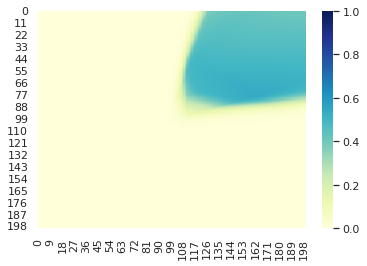


Epoch 10/150


100%|██████████| 20/20 [00:00<00:00, 730.93it/s]


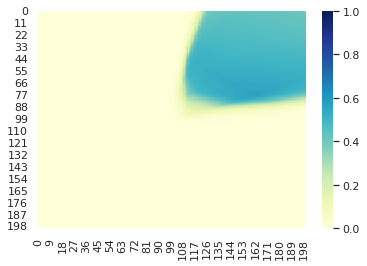


Epoch 11/150


100%|██████████| 20/20 [00:00<00:00, 573.92it/s]


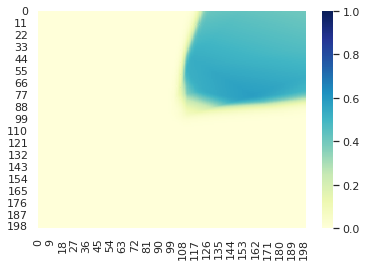


Epoch 12/150


100%|██████████| 20/20 [00:00<00:00, 603.81it/s]


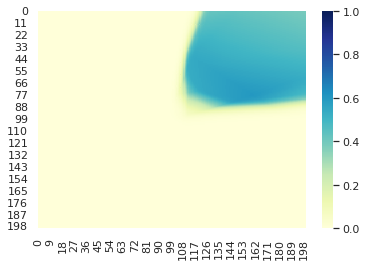


Epoch 13/150


100%|██████████| 20/20 [00:00<00:00, 705.62it/s]


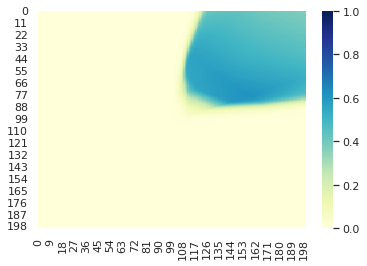


Epoch 14/150


100%|██████████| 20/20 [00:00<00:00, 620.83it/s]


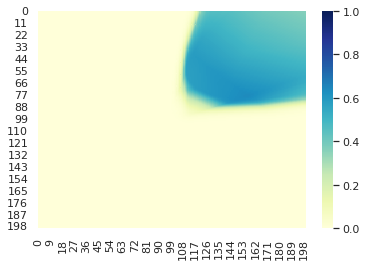


Epoch 15/150


100%|██████████| 20/20 [00:00<00:00, 698.57it/s]


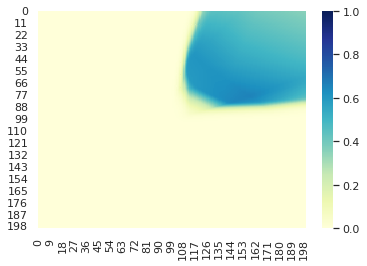


Epoch 16/150


100%|██████████| 20/20 [00:00<00:00, 667.82it/s]


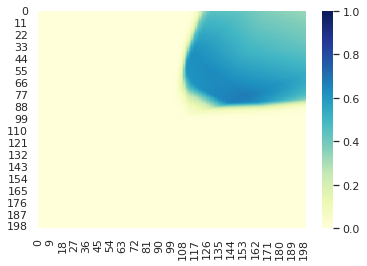


Epoch 17/150


100%|██████████| 20/20 [00:00<00:00, 677.34it/s]


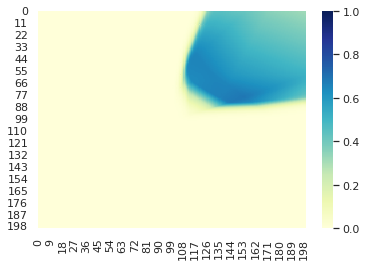


Epoch 18/150


100%|██████████| 20/20 [00:00<00:00, 594.22it/s]


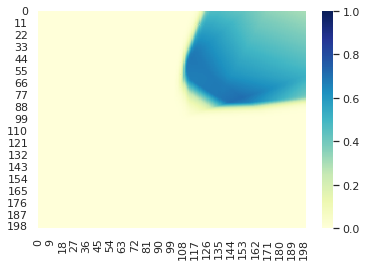


Epoch 19/150


100%|██████████| 20/20 [00:00<00:00, 632.58it/s]


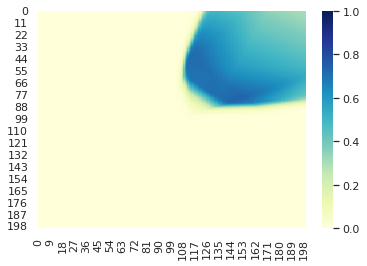


Epoch 20/150


100%|██████████| 20/20 [00:00<00:00, 626.84it/s]


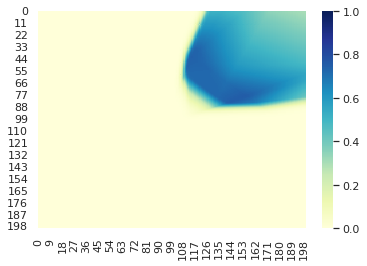


Epoch 21/150


100%|██████████| 20/20 [00:00<00:00, 541.87it/s]


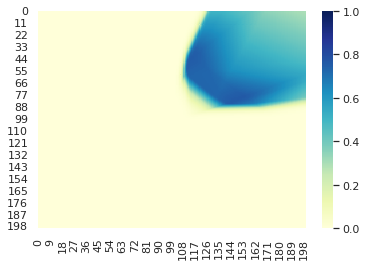


Epoch 22/150


100%|██████████| 20/20 [00:00<00:00, 521.80it/s]


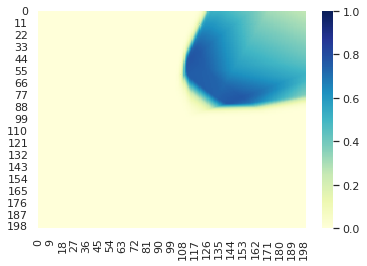


Epoch 23/150


100%|██████████| 20/20 [00:00<00:00, 627.59it/s]


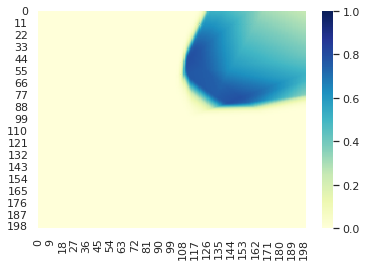


Epoch 24/150


100%|██████████| 20/20 [00:00<00:00, 563.62it/s]


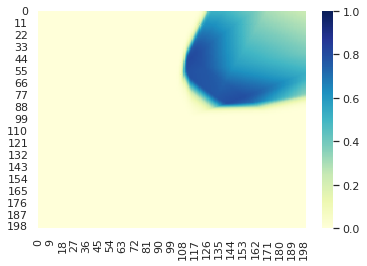


Epoch 25/150


100%|██████████| 20/20 [00:00<00:00, 617.75it/s]


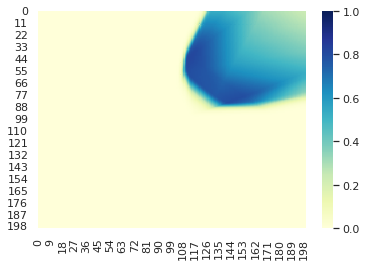


Epoch 26/150


100%|██████████| 20/20 [00:00<00:00, 458.87it/s]


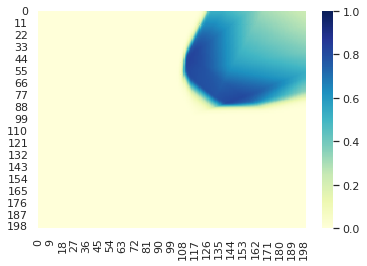


Epoch 27/150


100%|██████████| 20/20 [00:00<00:00, 746.52it/s]


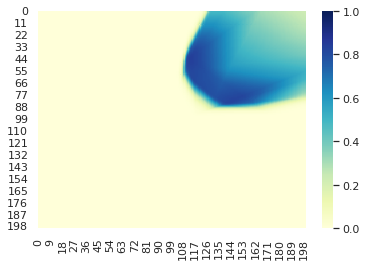


Epoch 28/150


100%|██████████| 20/20 [00:00<00:00, 659.51it/s]


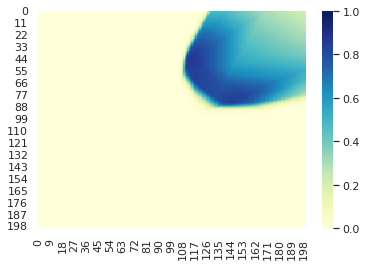


Epoch 29/150


100%|██████████| 20/20 [00:00<00:00, 526.10it/s]


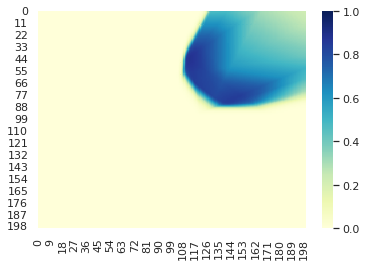


Epoch 30/150


100%|██████████| 20/20 [00:00<00:00, 610.09it/s]


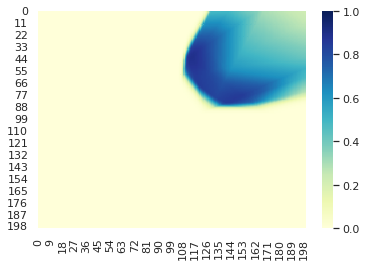


Epoch 31/150


100%|██████████| 20/20 [00:00<00:00, 536.38it/s]


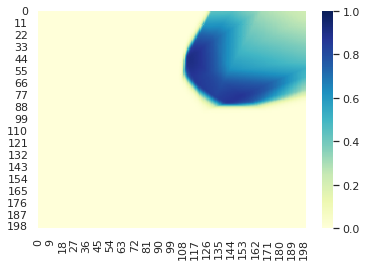


Epoch 32/150


100%|██████████| 20/20 [00:00<00:00, 447.96it/s]


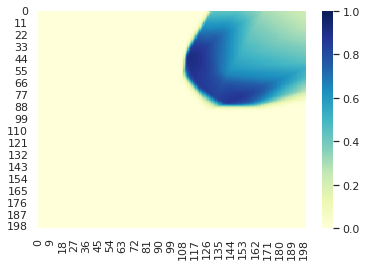


Epoch 33/150


100%|██████████| 20/20 [00:00<00:00, 640.91it/s]


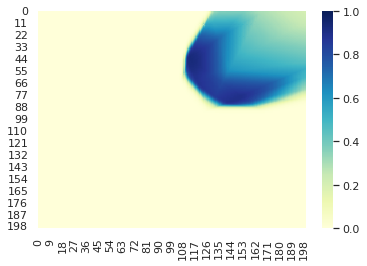


Epoch 34/150


100%|██████████| 20/20 [00:00<00:00, 664.98it/s]


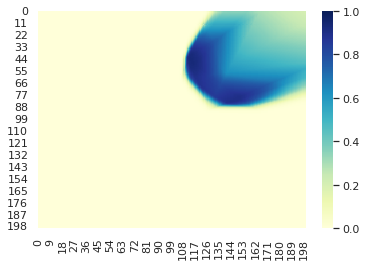


Epoch 35/150


100%|██████████| 20/20 [00:00<00:00, 583.00it/s]


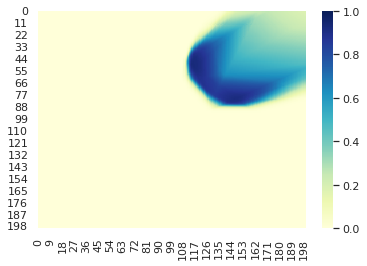


Epoch 36/150


100%|██████████| 20/20 [00:00<00:00, 547.85it/s]


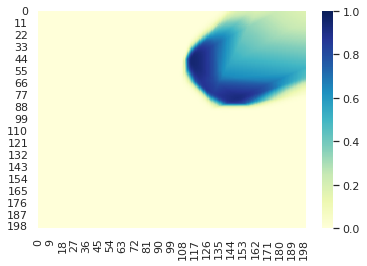


Epoch 37/150


100%|██████████| 20/20 [00:00<00:00, 554.77it/s]


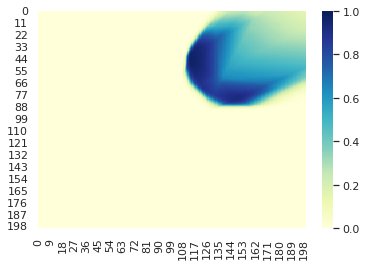


Epoch 38/150


100%|██████████| 20/20 [00:00<00:00, 561.64it/s]


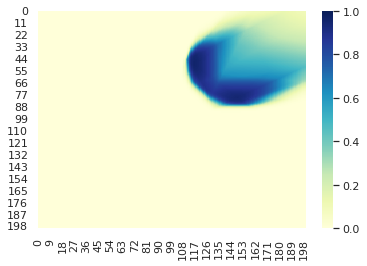


Epoch 39/150


100%|██████████| 20/20 [00:00<00:00, 492.95it/s]


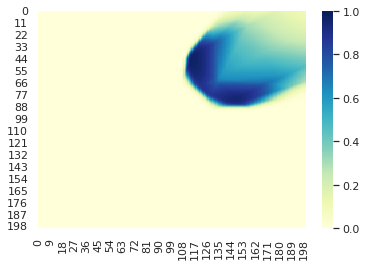


Epoch 40/150


100%|██████████| 20/20 [00:00<00:00, 594.10it/s]


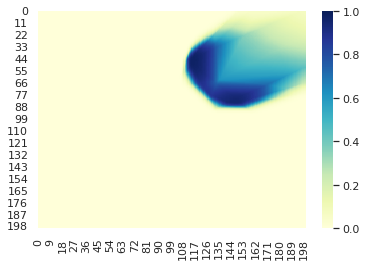


Epoch 41/150


100%|██████████| 20/20 [00:00<00:00, 521.03it/s]


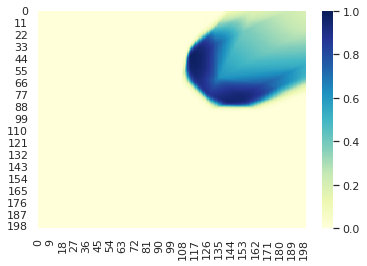


Epoch 42/150


100%|██████████| 20/20 [00:00<00:00, 564.20it/s]


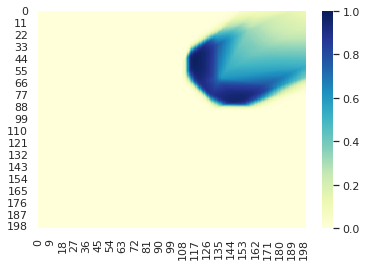


Epoch 43/150


100%|██████████| 20/20 [00:00<00:00, 534.01it/s]


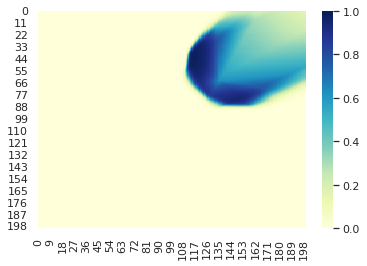


Epoch 44/150


100%|██████████| 20/20 [00:00<00:00, 513.86it/s]


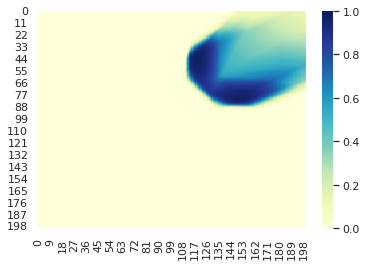


Epoch 45/150


100%|██████████| 20/20 [00:00<00:00, 606.09it/s]


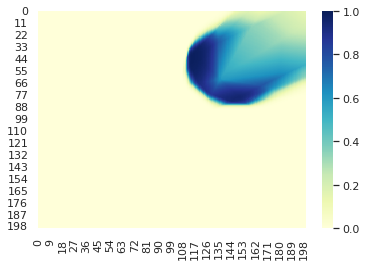


Epoch 46/150


100%|██████████| 20/20 [00:00<00:00, 567.12it/s]


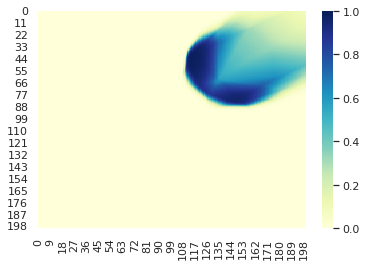


Epoch 47/150


100%|██████████| 20/20 [00:00<00:00, 541.24it/s]


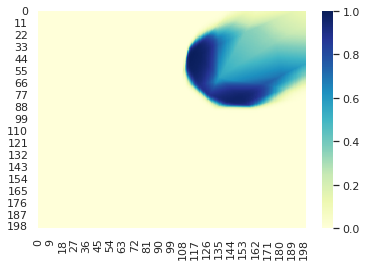


Epoch 48/150


100%|██████████| 20/20 [00:00<00:00, 582.26it/s]


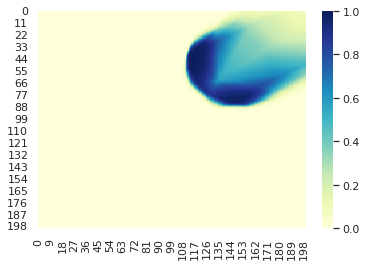


Epoch 49/150


100%|██████████| 20/20 [00:00<00:00, 599.76it/s]


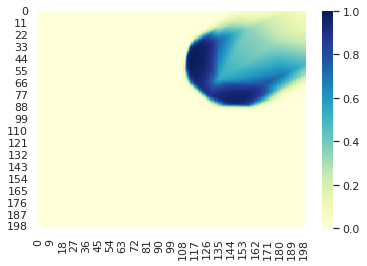


Epoch 50/150


100%|██████████| 20/20 [00:00<00:00, 590.02it/s]


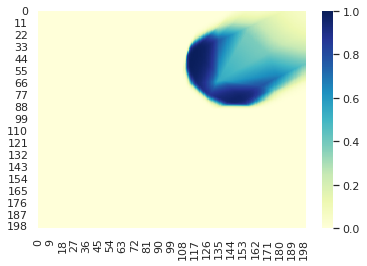


Epoch 51/150


100%|██████████| 20/20 [00:00<00:00, 618.75it/s]


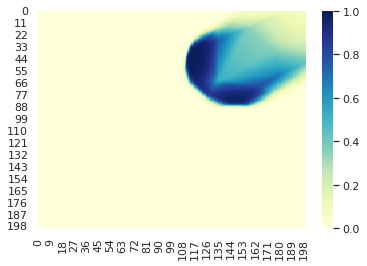


Epoch 52/150


100%|██████████| 20/20 [00:00<00:00, 616.49it/s]


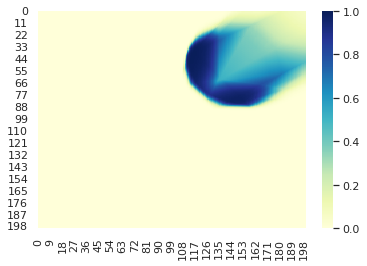


Epoch 53/150


100%|██████████| 20/20 [00:00<00:00, 591.52it/s]


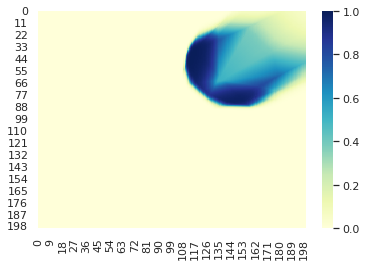


Epoch 54/150


100%|██████████| 20/20 [00:00<00:00, 601.29it/s]


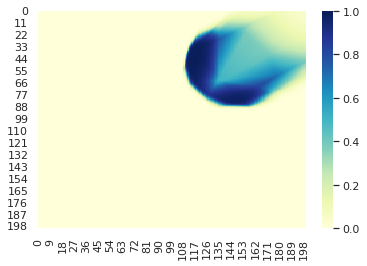


Epoch 55/150


100%|██████████| 20/20 [00:00<00:00, 505.29it/s]


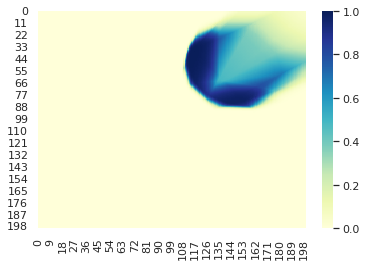


Epoch 56/150


100%|██████████| 20/20 [00:00<00:00, 626.30it/s]


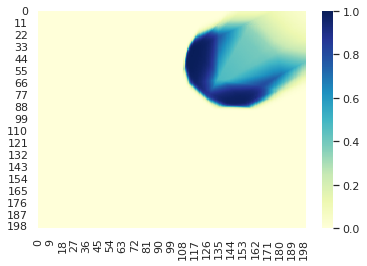


Epoch 57/150


100%|██████████| 20/20 [00:00<00:00, 528.81it/s]


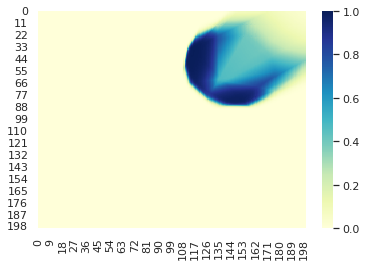


Epoch 58/150


100%|██████████| 20/20 [00:00<00:00, 673.85it/s]


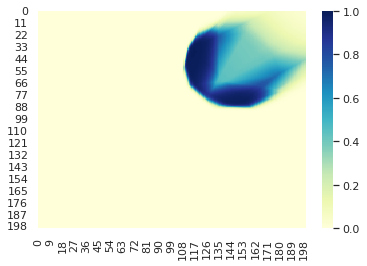


Epoch 59/150


100%|██████████| 20/20 [00:00<00:00, 671.29it/s]


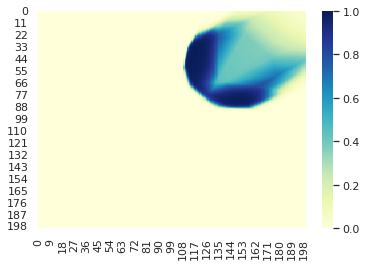


Epoch 60/150


100%|██████████| 20/20 [00:00<00:00, 647.36it/s]


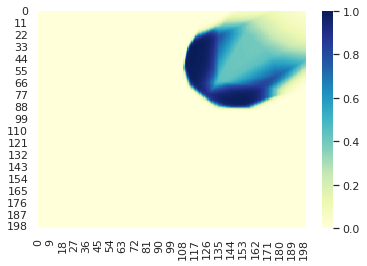


Epoch 61/150


100%|██████████| 20/20 [00:00<00:00, 596.14it/s]


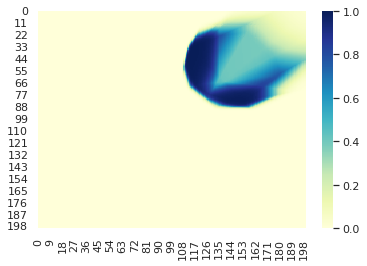


Epoch 62/150


100%|██████████| 20/20 [00:00<00:00, 610.56it/s]


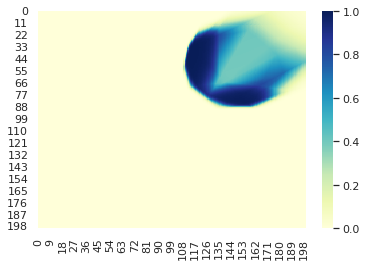


Epoch 63/150


100%|██████████| 20/20 [00:00<00:00, 561.10it/s]


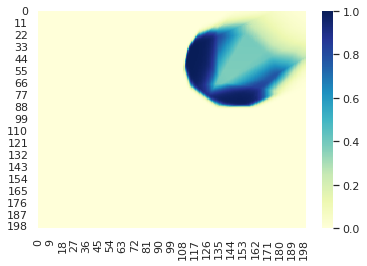


Epoch 64/150


100%|██████████| 20/20 [00:00<00:00, 618.63it/s]


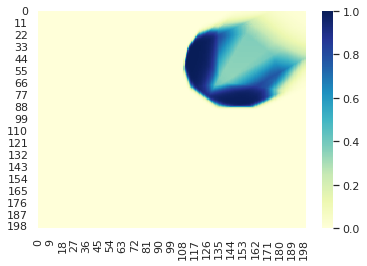


Epoch 65/150


100%|██████████| 20/20 [00:00<00:00, 579.11it/s]


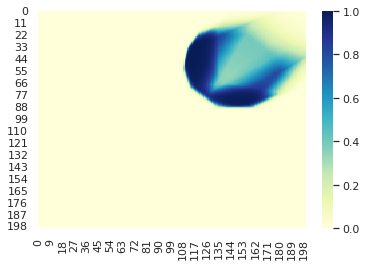


Epoch 66/150


100%|██████████| 20/20 [00:00<00:00, 639.06it/s]


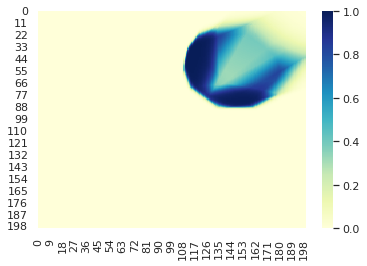


Epoch 67/150


100%|██████████| 20/20 [00:00<00:00, 618.87it/s]


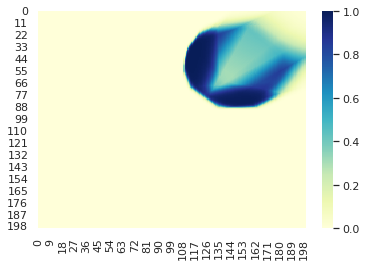


Epoch 68/150


100%|██████████| 20/20 [00:00<00:00, 495.47it/s]


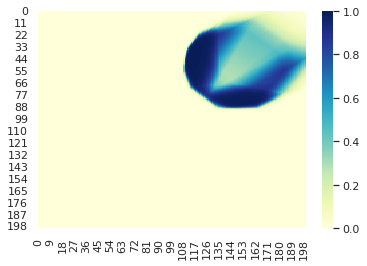


Epoch 69/150


100%|██████████| 20/20 [00:00<00:00, 595.72it/s]


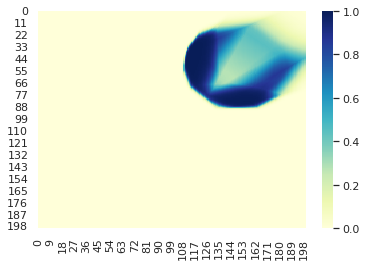


Epoch 70/150


100%|██████████| 20/20 [00:00<00:00, 581.71it/s]


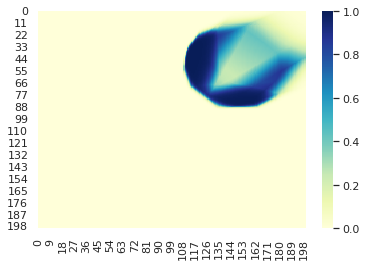


Epoch 71/150


100%|██████████| 20/20 [00:00<00:00, 585.62it/s]


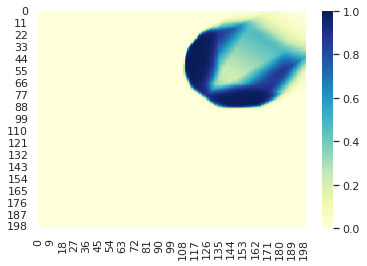


Epoch 72/150


100%|██████████| 20/20 [00:00<00:00, 582.63it/s]


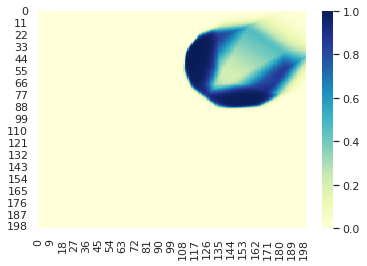


Epoch 73/150


100%|██████████| 20/20 [00:00<00:00, 641.68it/s]


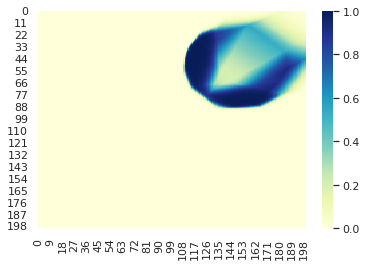


Epoch 74/150


100%|██████████| 20/20 [00:00<00:00, 625.61it/s]


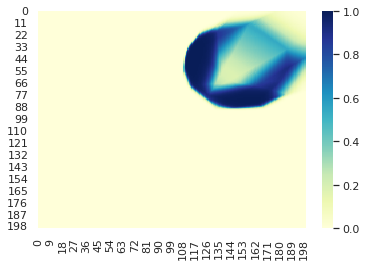


Epoch 75/150


100%|██████████| 20/20 [00:00<00:00, 666.55it/s]


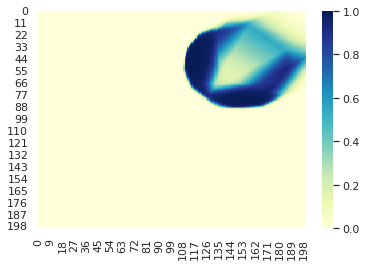


Epoch 76/150


100%|██████████| 20/20 [00:00<00:00, 631.58it/s]


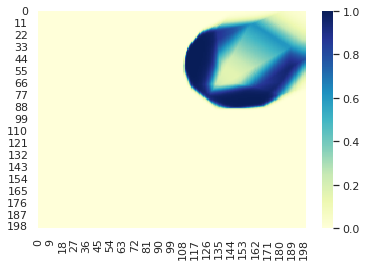


Epoch 77/150


100%|██████████| 20/20 [00:00<00:00, 627.73it/s]


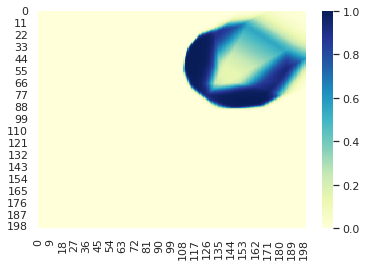


Epoch 78/150


100%|██████████| 20/20 [00:00<00:00, 635.22it/s]


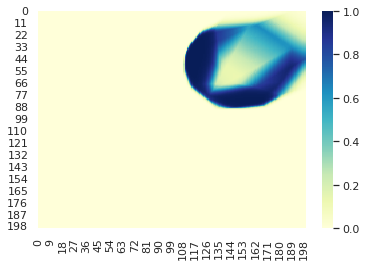


Epoch 79/150


100%|██████████| 20/20 [00:00<00:00, 629.15it/s]


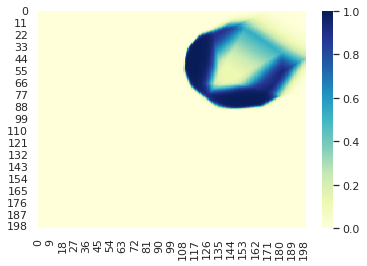


Epoch 80/150


100%|██████████| 20/20 [00:00<00:00, 632.29it/s]


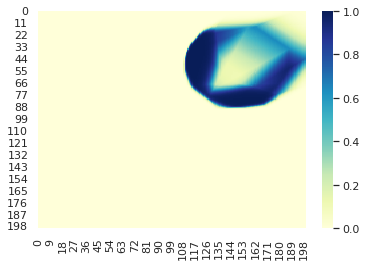


Epoch 81/150


100%|██████████| 20/20 [00:00<00:00, 624.82it/s]


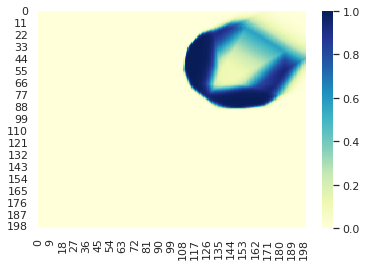


Epoch 82/150


100%|██████████| 20/20 [00:00<00:00, 483.95it/s]


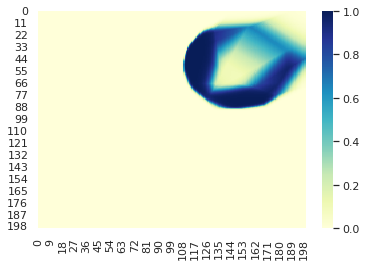


Epoch 83/150


100%|██████████| 20/20 [00:00<00:00, 476.80it/s]


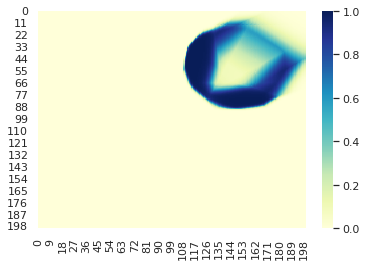


Epoch 84/150


100%|██████████| 20/20 [00:00<00:00, 609.32it/s]


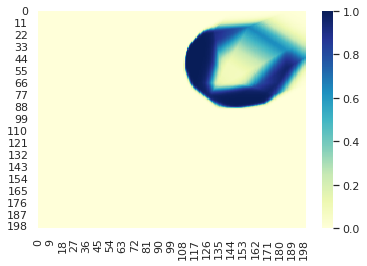


Epoch 85/150


100%|██████████| 20/20 [00:00<00:00, 590.96it/s]


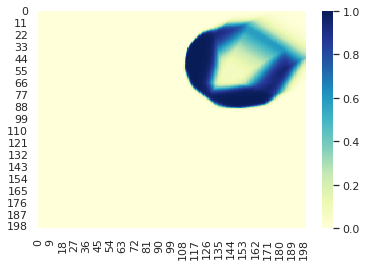


Epoch 86/150


100%|██████████| 20/20 [00:00<00:00, 585.58it/s]


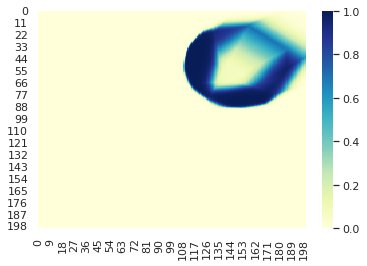


Epoch 87/150


100%|██████████| 20/20 [00:00<00:00, 635.77it/s]


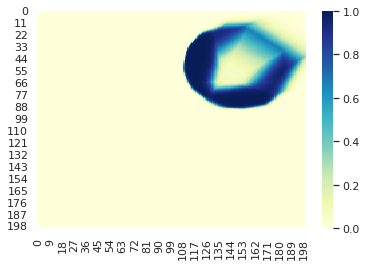


Epoch 88/150


100%|██████████| 20/20 [00:00<00:00, 599.04it/s]


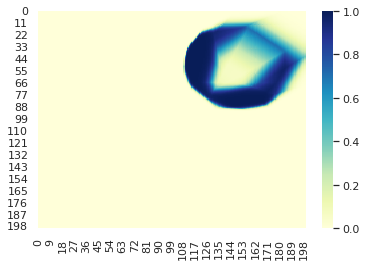


Epoch 89/150


100%|██████████| 20/20 [00:00<00:00, 601.69it/s]


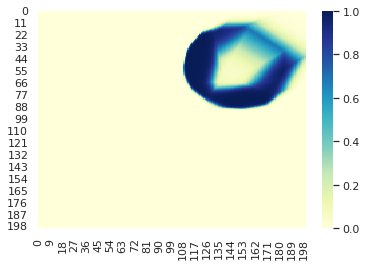


Epoch 90/150


100%|██████████| 20/20 [00:00<00:00, 620.94it/s]


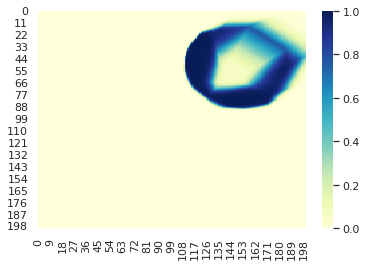


Epoch 91/150


100%|██████████| 20/20 [00:00<00:00, 629.62it/s]


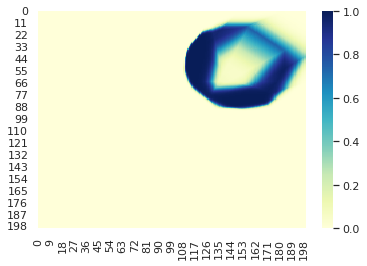


Epoch 92/150


100%|██████████| 20/20 [00:00<00:00, 651.31it/s]


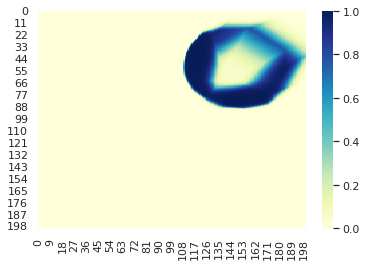


Epoch 93/150


100%|██████████| 20/20 [00:00<00:00, 646.27it/s]


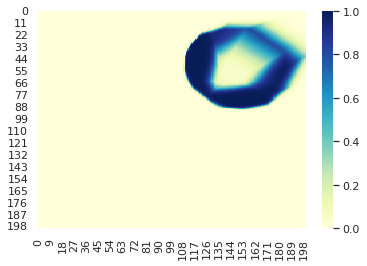


Epoch 94/150


100%|██████████| 20/20 [00:00<00:00, 512.56it/s]


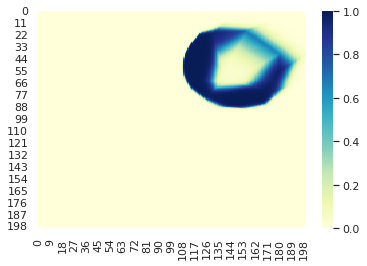


Epoch 95/150


100%|██████████| 20/20 [00:00<00:00, 553.09it/s]


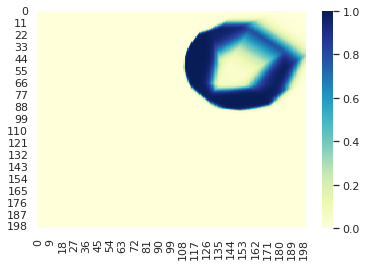


Epoch 96/150


100%|██████████| 20/20 [00:00<00:00, 600.12it/s]


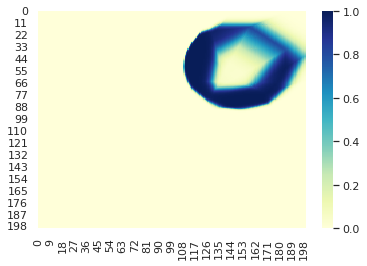


Epoch 97/150


100%|██████████| 20/20 [00:00<00:00, 632.70it/s]


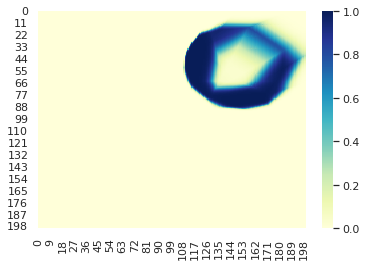


Epoch 98/150


100%|██████████| 20/20 [00:00<00:00, 689.31it/s]


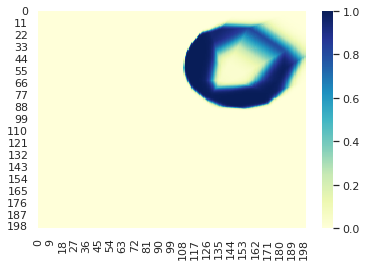


Epoch 99/150


100%|██████████| 20/20 [00:00<00:00, 640.41it/s]


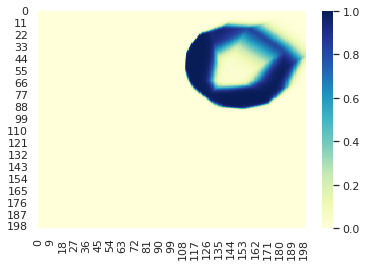


Epoch 100/150


100%|██████████| 20/20 [00:00<00:00, 597.65it/s]


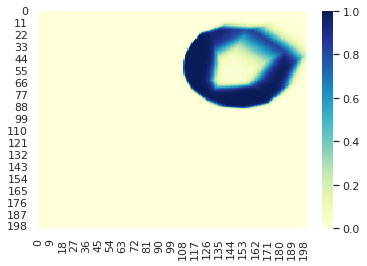


Epoch 101/150


100%|██████████| 20/20 [00:00<00:00, 687.00it/s]


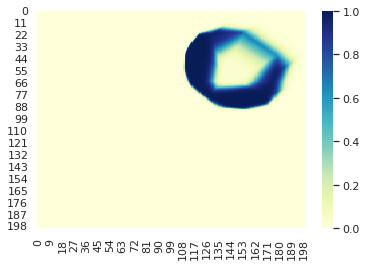


Epoch 102/150


100%|██████████| 20/20 [00:00<00:00, 612.88it/s]


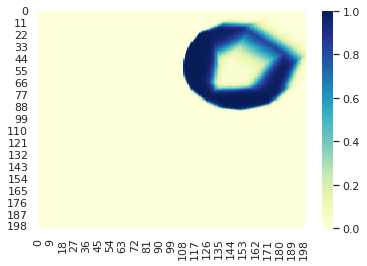


Epoch 103/150


100%|██████████| 20/20 [00:00<00:00, 600.90it/s]


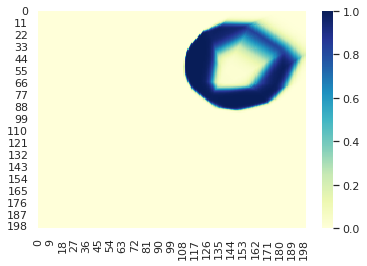


Epoch 104/150


100%|██████████| 20/20 [00:00<00:00, 564.40it/s]


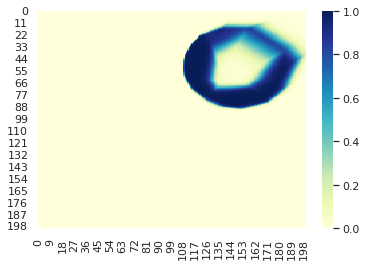


Epoch 105/150


100%|██████████| 20/20 [00:00<00:00, 681.87it/s]


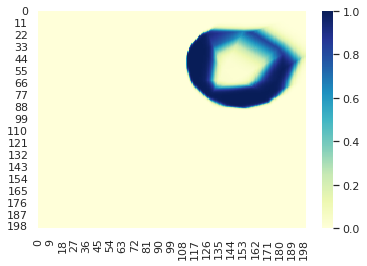


Epoch 106/150


100%|██████████| 20/20 [00:00<00:00, 652.71it/s]


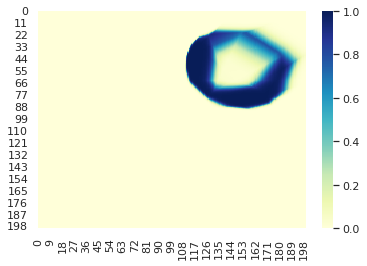


Epoch 107/150


100%|██████████| 20/20 [00:00<00:00, 661.24it/s]


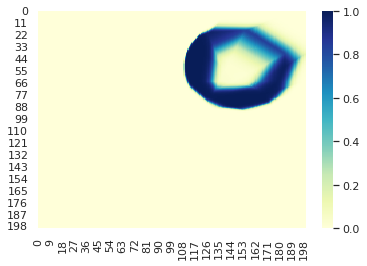


Epoch 108/150


100%|██████████| 20/20 [00:00<00:00, 695.00it/s]


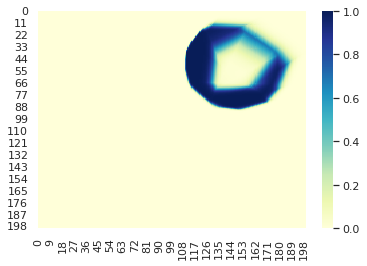


Epoch 109/150


100%|██████████| 20/20 [00:00<00:00, 672.74it/s]


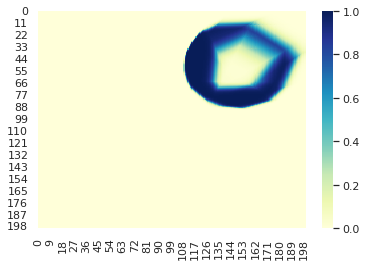


Epoch 110/150


100%|██████████| 20/20 [00:00<00:00, 611.60it/s]


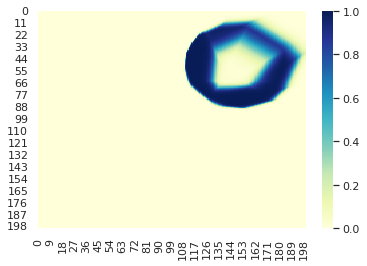


Epoch 111/150


100%|██████████| 20/20 [00:00<00:00, 670.18it/s]


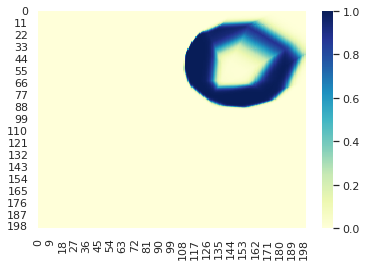


Epoch 112/150


100%|██████████| 20/20 [00:00<00:00, 661.82it/s]


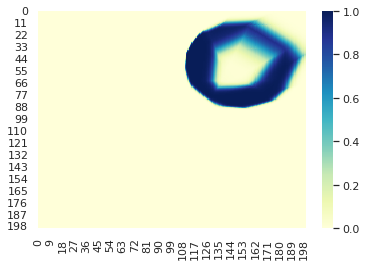


Epoch 113/150


100%|██████████| 20/20 [00:00<00:00, 672.07it/s]


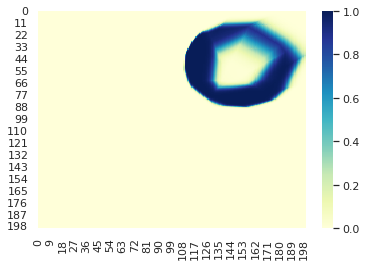


Epoch 114/150


100%|██████████| 20/20 [00:00<00:00, 667.83it/s]


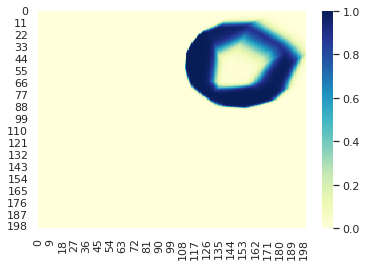


Epoch 115/150


100%|██████████| 20/20 [00:00<00:00, 609.61it/s]


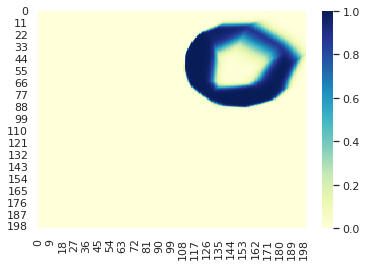


Epoch 116/150


100%|██████████| 20/20 [00:00<00:00, 662.96it/s]


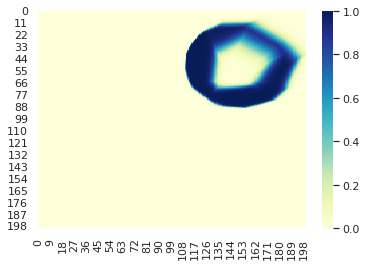


Epoch 117/150


100%|██████████| 20/20 [00:00<00:00, 648.03it/s]


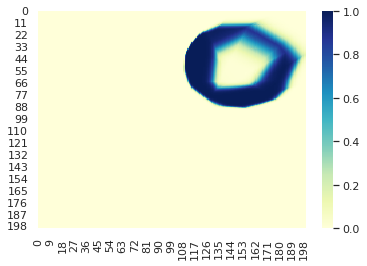


Epoch 118/150


100%|██████████| 20/20 [00:00<00:00, 577.86it/s]


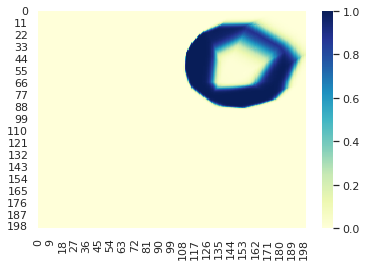


Epoch 119/150


100%|██████████| 20/20 [00:00<00:00, 657.10it/s]


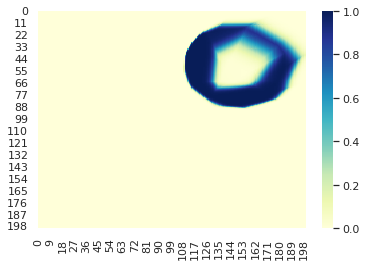


Epoch 120/150


100%|██████████| 20/20 [00:00<00:00, 643.96it/s]


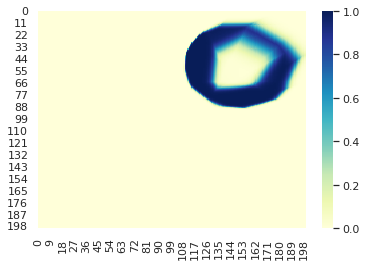


Epoch 121/150


100%|██████████| 20/20 [00:00<00:00, 592.18it/s]


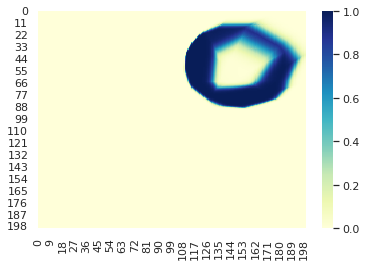


Epoch 122/150


100%|██████████| 20/20 [00:00<00:00, 661.40it/s]


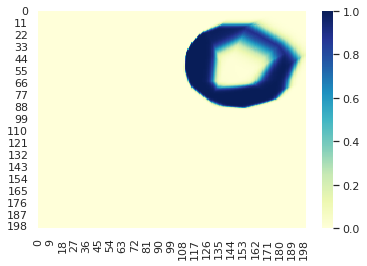


Epoch 123/150


100%|██████████| 20/20 [00:00<00:00, 681.70it/s]


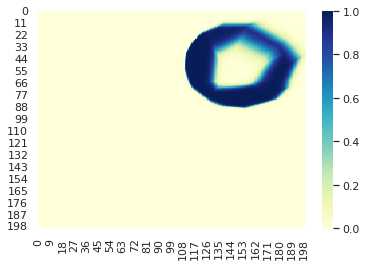


Epoch 124/150


100%|██████████| 20/20 [00:00<00:00, 621.95it/s]


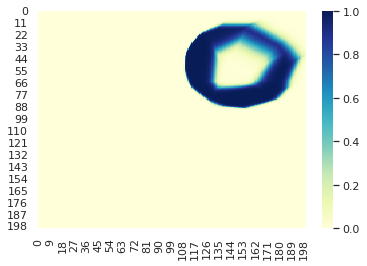


Epoch 125/150


100%|██████████| 20/20 [00:00<00:00, 624.05it/s]


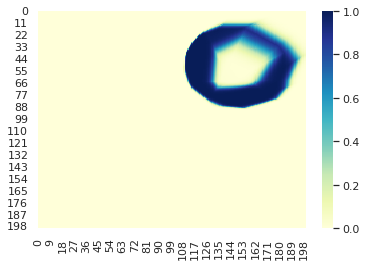


Epoch 126/150


100%|██████████| 20/20 [00:00<00:00, 685.06it/s]


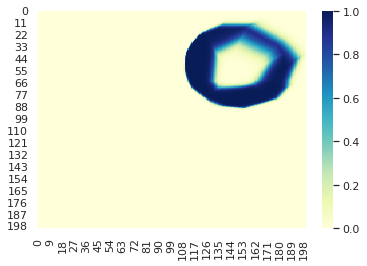


Epoch 127/150


100%|██████████| 20/20 [00:00<00:00, 583.47it/s]


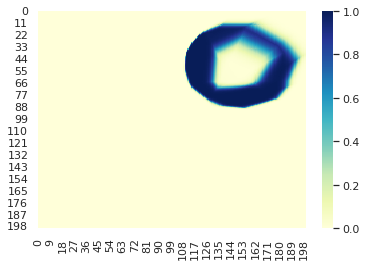


Epoch 128/150


100%|██████████| 20/20 [00:00<00:00, 641.59it/s]


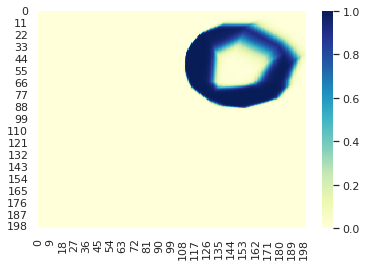


Epoch 129/150


100%|██████████| 20/20 [00:00<00:00, 612.82it/s]


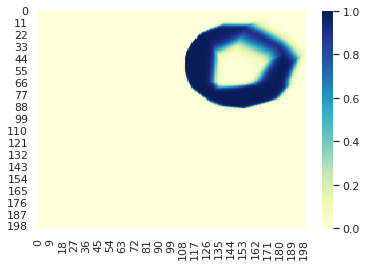


Epoch 130/150


100%|██████████| 20/20 [00:00<00:00, 639.08it/s]


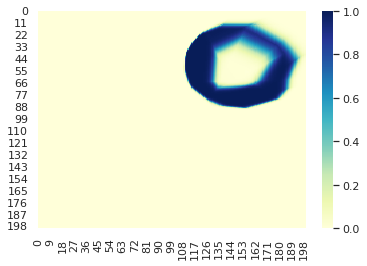


Epoch 131/150


100%|██████████| 20/20 [00:00<00:00, 630.27it/s]


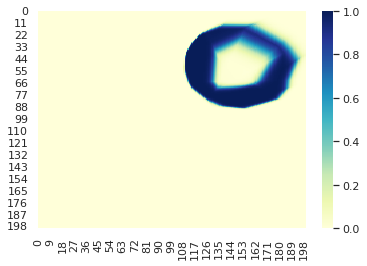


Epoch 132/150


100%|██████████| 20/20 [00:00<00:00, 627.99it/s]


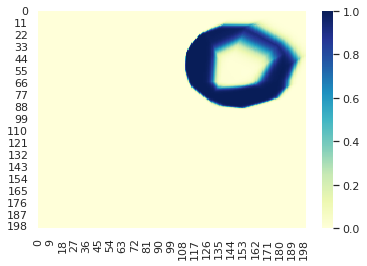


Epoch 133/150


100%|██████████| 20/20 [00:00<00:00, 637.72it/s]


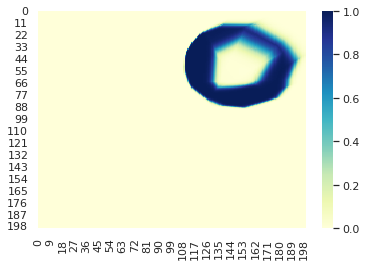


Epoch 134/150


100%|██████████| 20/20 [00:00<00:00, 642.80it/s]


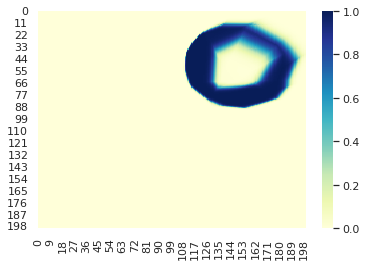


Epoch 135/150


100%|██████████| 20/20 [00:00<00:00, 682.89it/s]


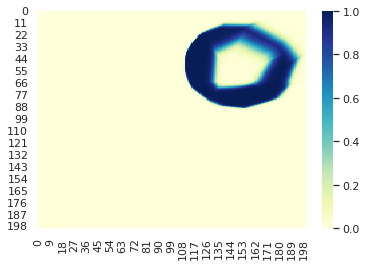


Epoch 136/150


100%|██████████| 20/20 [00:00<00:00, 621.50it/s]


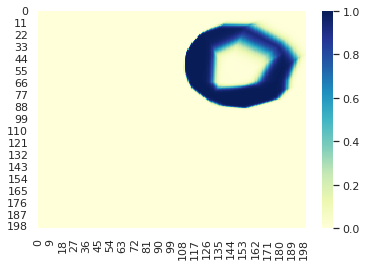


Epoch 137/150


100%|██████████| 20/20 [00:00<00:00, 594.50it/s]


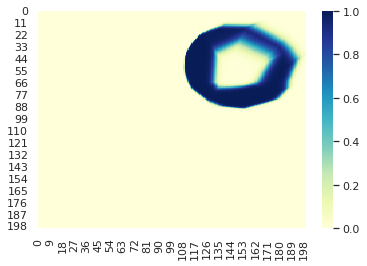


Epoch 138/150


100%|██████████| 20/20 [00:00<00:00, 656.25it/s]


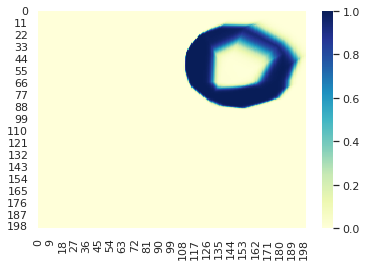


Epoch 139/150


100%|██████████| 20/20 [00:00<00:00, 623.07it/s]


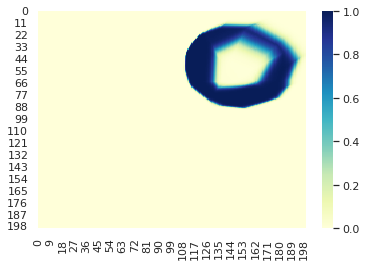


Epoch 140/150


100%|██████████| 20/20 [00:00<00:00, 569.15it/s]


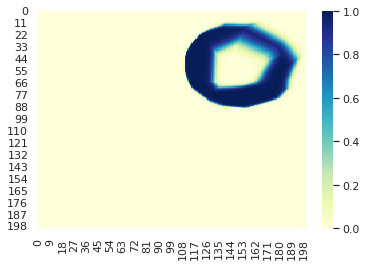


Epoch 141/150


100%|██████████| 20/20 [00:00<00:00, 576.98it/s]


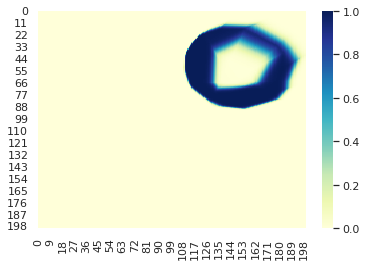


Epoch 142/150


100%|██████████| 20/20 [00:00<00:00, 631.38it/s]


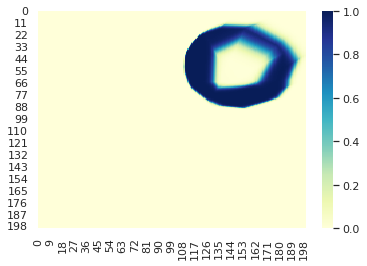


Epoch 143/150


100%|██████████| 20/20 [00:00<00:00, 689.20it/s]


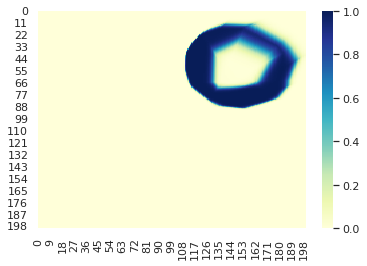


Epoch 144/150


100%|██████████| 20/20 [00:00<00:00, 640.56it/s]


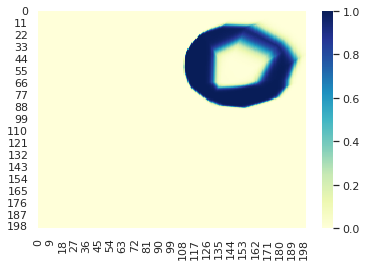


Epoch 145/150


100%|██████████| 20/20 [00:00<00:00, 624.46it/s]


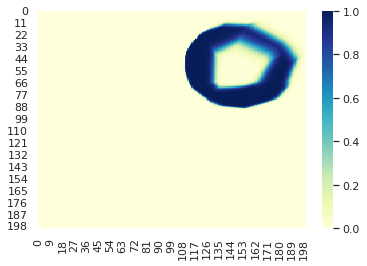


Epoch 146/150


100%|██████████| 20/20 [00:00<00:00, 610.17it/s]


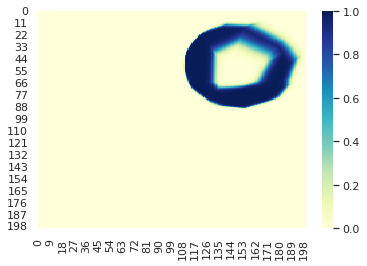


Epoch 147/150


100%|██████████| 20/20 [00:00<00:00, 651.06it/s]


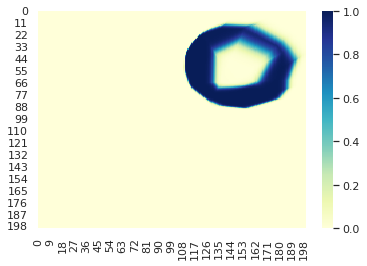


Epoch 148/150


100%|██████████| 20/20 [00:00<00:00, 539.52it/s]


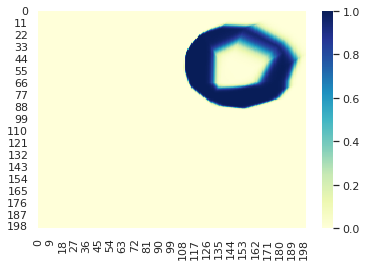


Epoch 149/150


100%|██████████| 20/20 [00:00<00:00, 626.54it/s]


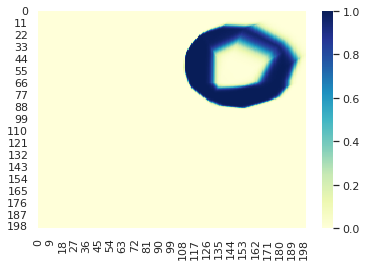


Epoch 150/150


100%|██████████| 20/20 [00:00<00:00, 641.21it/s]


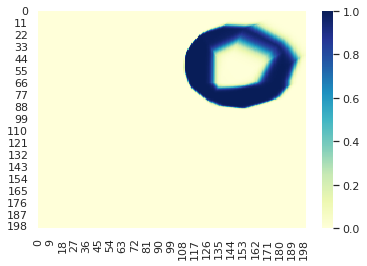

In [ ]:
model_shift = Net()
train(model_shift, x_shift, y_shift, 150, 100, plotter)


Epoch 1/100


100%|██████████| 20/20 [00:00<00:00, 625.01it/s]


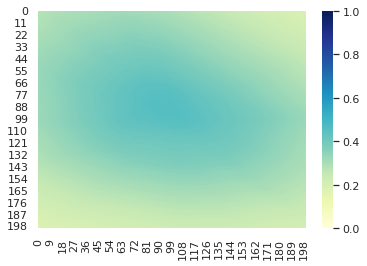


Epoch 2/100


100%|██████████| 20/20 [00:00<00:00, 431.61it/s]


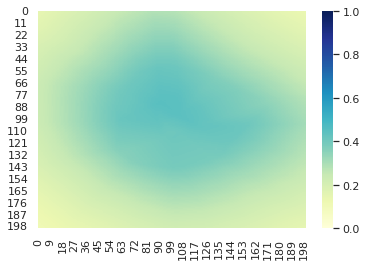


Epoch 3/100


100%|██████████| 20/20 [00:00<00:00, 748.04it/s]


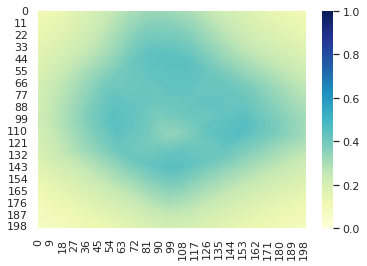


Epoch 4/100


100%|██████████| 20/20 [00:00<00:00, 1007.10it/s]


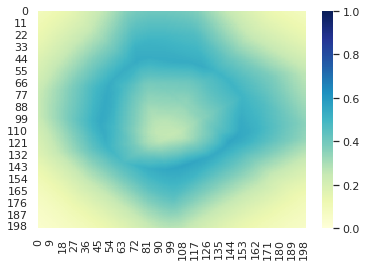


Epoch 5/100


100%|██████████| 20/20 [00:00<00:00, 695.26it/s]


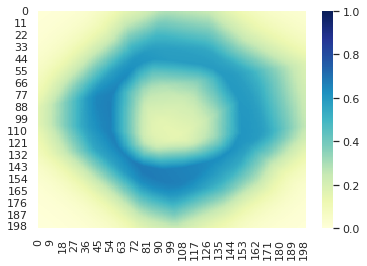


Epoch 6/100


100%|██████████| 20/20 [00:00<00:00, 661.81it/s]


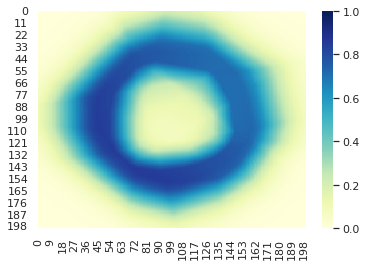


Epoch 7/100


100%|██████████| 20/20 [00:00<00:00, 566.92it/s]


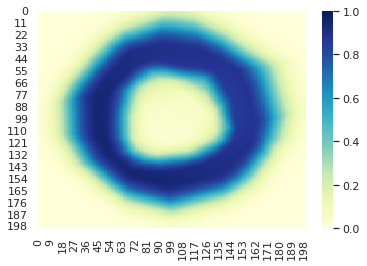


Epoch 8/100


100%|██████████| 20/20 [00:00<00:00, 625.47it/s]


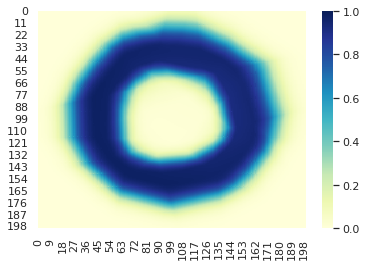


Epoch 9/100


100%|██████████| 20/20 [00:00<00:00, 575.76it/s]


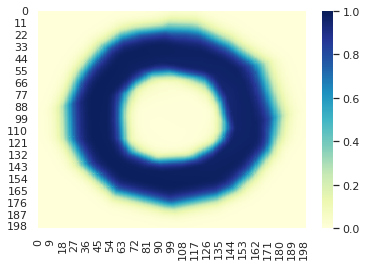


Epoch 10/100


100%|██████████| 20/20 [00:00<00:00, 563.92it/s]


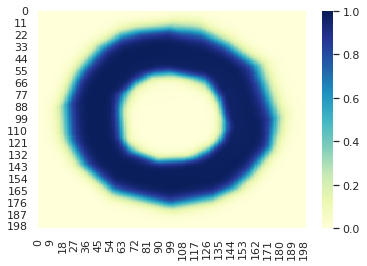


Epoch 11/100


100%|██████████| 20/20 [00:00<00:00, 522.74it/s]


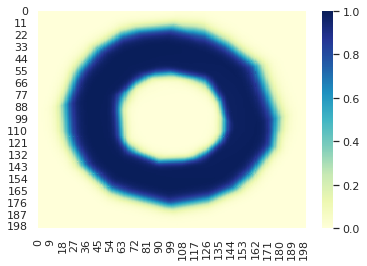


Epoch 12/100


100%|██████████| 20/20 [00:00<00:00, 485.93it/s]


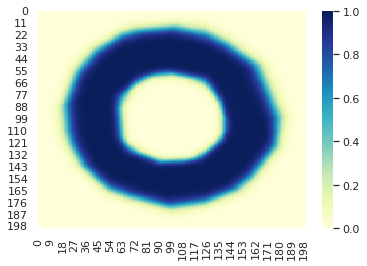


Epoch 13/100


100%|██████████| 20/20 [00:00<00:00, 493.99it/s]


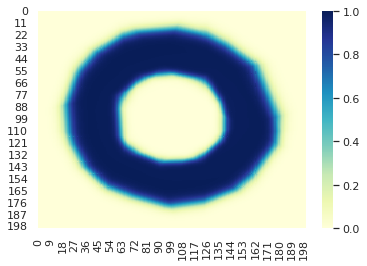


Epoch 14/100


100%|██████████| 20/20 [00:00<00:00, 550.28it/s]


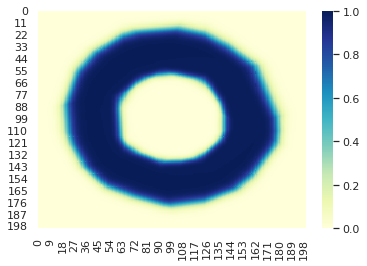


Epoch 15/100


100%|██████████| 20/20 [00:00<00:00, 661.20it/s]


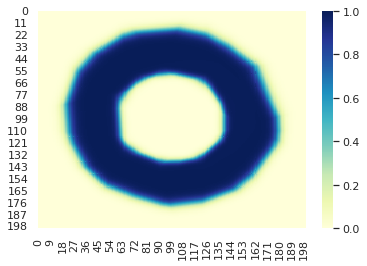


Epoch 16/100


100%|██████████| 20/20 [00:00<00:00, 557.16it/s]


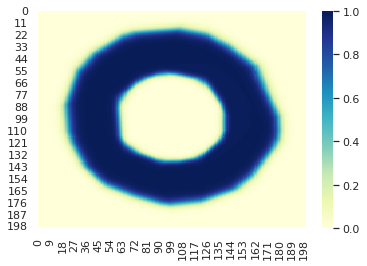


Epoch 17/100


100%|██████████| 20/20 [00:00<00:00, 599.48it/s]


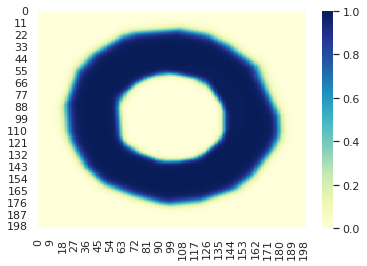


Epoch 18/100


100%|██████████| 20/20 [00:00<00:00, 676.59it/s]


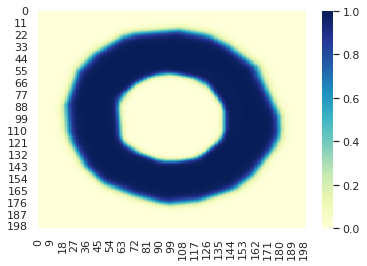


Epoch 19/100


100%|██████████| 20/20 [00:00<00:00, 617.90it/s]


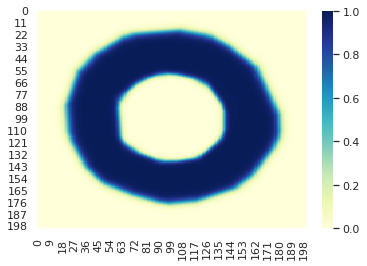


Epoch 20/100


100%|██████████| 20/20 [00:00<00:00, 552.12it/s]


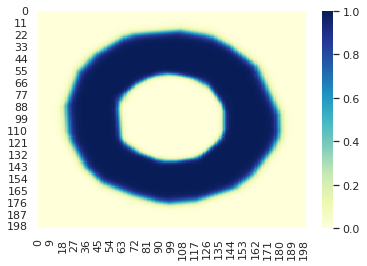


Epoch 21/100


100%|██████████| 20/20 [00:00<00:00, 596.35it/s]


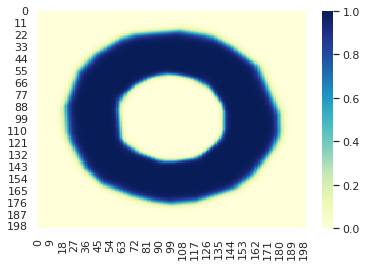


Epoch 22/100


100%|██████████| 20/20 [00:00<00:00, 551.21it/s]


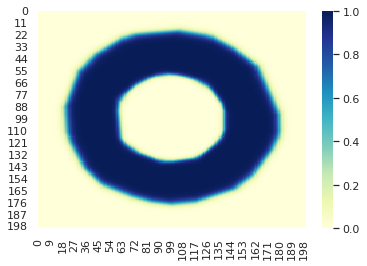


Epoch 23/100


100%|██████████| 20/20 [00:00<00:00, 531.22it/s]


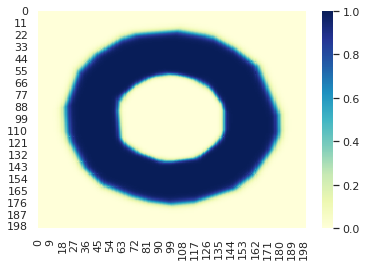


Epoch 24/100


100%|██████████| 20/20 [00:00<00:00, 569.49it/s]


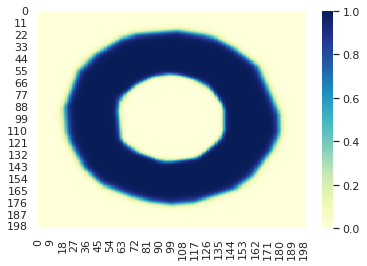


Epoch 25/100


100%|██████████| 20/20 [00:00<00:00, 469.43it/s]


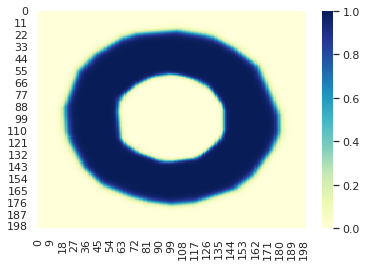


Epoch 26/100


100%|██████████| 20/20 [00:00<00:00, 597.72it/s]


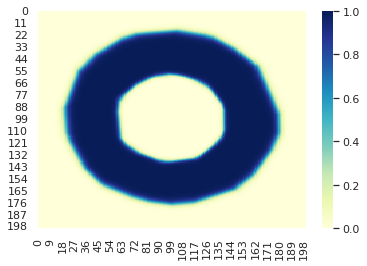


Epoch 27/100


100%|██████████| 20/20 [00:00<00:00, 602.44it/s]


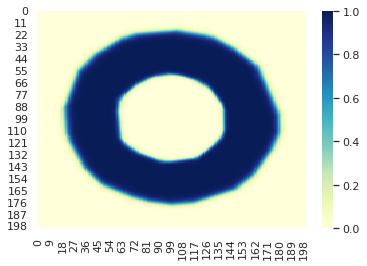


Epoch 28/100


100%|██████████| 20/20 [00:00<00:00, 559.10it/s]


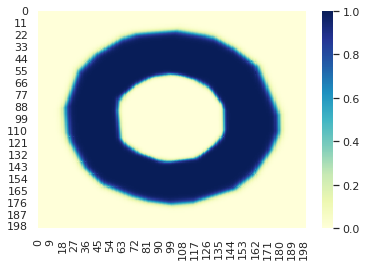


Epoch 29/100


100%|██████████| 20/20 [00:00<00:00, 586.44it/s]


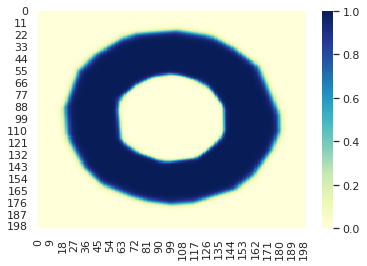


Epoch 30/100


100%|██████████| 20/20 [00:00<00:00, 632.91it/s]


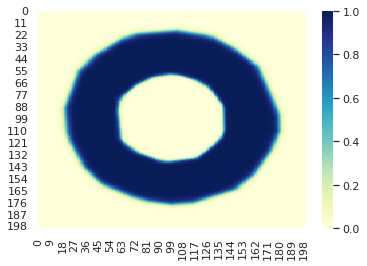


Epoch 31/100


100%|██████████| 20/20 [00:00<00:00, 579.14it/s]


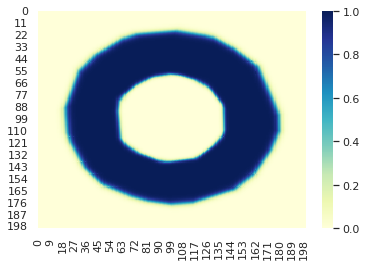


Epoch 32/100


100%|██████████| 20/20 [00:00<00:00, 569.87it/s]


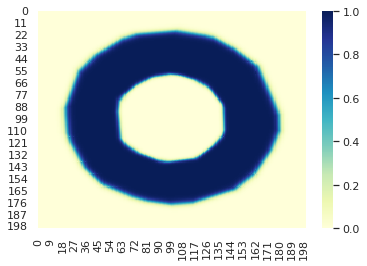


Epoch 33/100


100%|██████████| 20/20 [00:00<00:00, 614.07it/s]


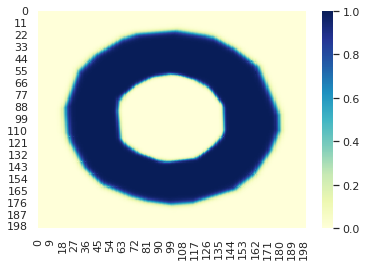


Epoch 34/100


100%|██████████| 20/20 [00:00<00:00, 575.82it/s]


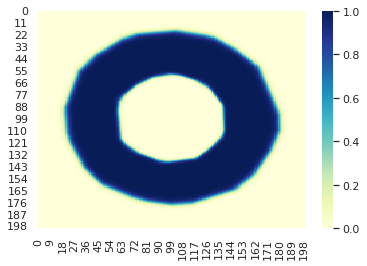


Epoch 35/100


100%|██████████| 20/20 [00:00<00:00, 508.48it/s]


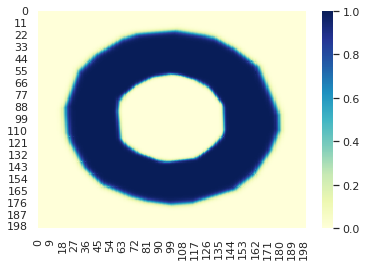


Epoch 36/100


100%|██████████| 20/20 [00:00<00:00, 552.61it/s]


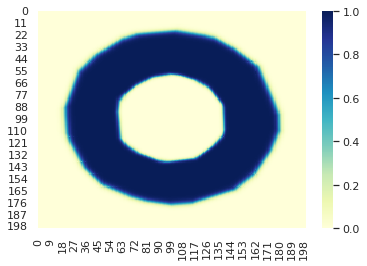


Epoch 37/100


100%|██████████| 20/20 [00:00<00:00, 670.58it/s]


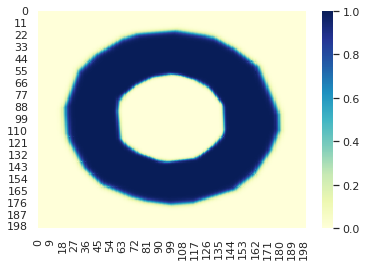


Epoch 38/100


100%|██████████| 20/20 [00:00<00:00, 603.74it/s]


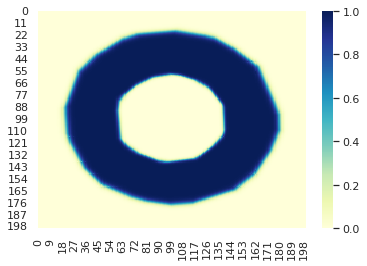


Epoch 39/100


100%|██████████| 20/20 [00:00<00:00, 535.65it/s]


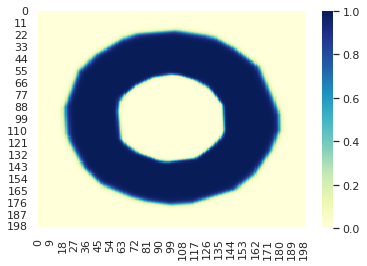


Epoch 40/100


100%|██████████| 20/20 [00:00<00:00, 565.95it/s]


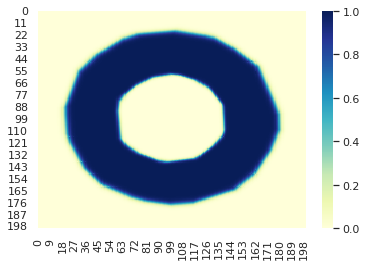


Epoch 41/100


100%|██████████| 20/20 [00:00<00:00, 682.04it/s]


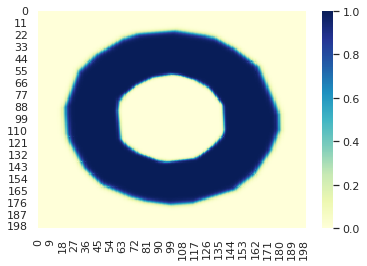


Epoch 42/100


100%|██████████| 20/20 [00:00<00:00, 659.31it/s]


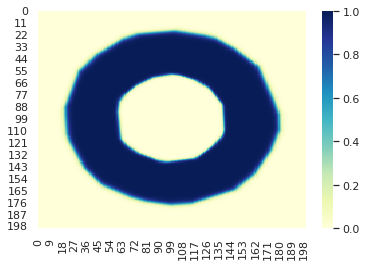


Epoch 43/100


100%|██████████| 20/20 [00:00<00:00, 521.93it/s]


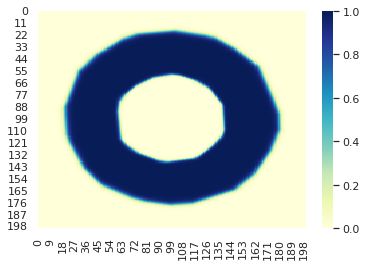


Epoch 44/100


100%|██████████| 20/20 [00:00<00:00, 643.07it/s]


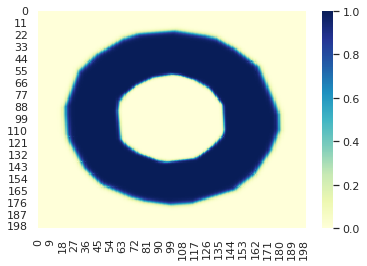


Epoch 45/100


100%|██████████| 20/20 [00:00<00:00, 666.19it/s]


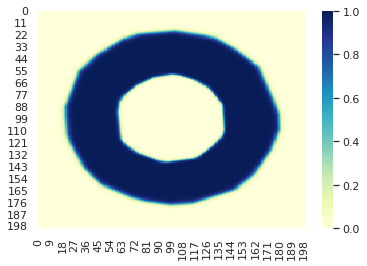


Epoch 46/100


100%|██████████| 20/20 [00:00<00:00, 561.49it/s]


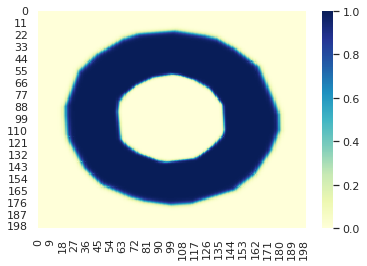


Epoch 47/100


100%|██████████| 20/20 [00:00<00:00, 613.96it/s]


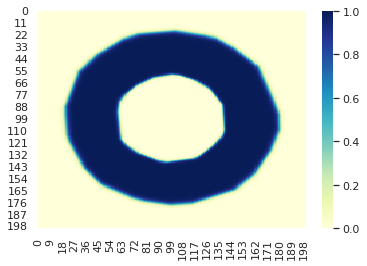


Epoch 48/100


100%|██████████| 20/20 [00:00<00:00, 597.33it/s]


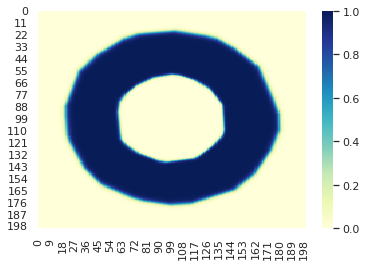


Epoch 49/100


100%|██████████| 20/20 [00:00<00:00, 673.92it/s]


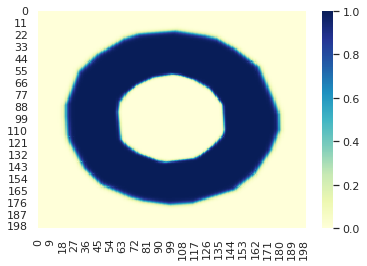


Epoch 50/100


100%|██████████| 20/20 [00:00<00:00, 590.61it/s]


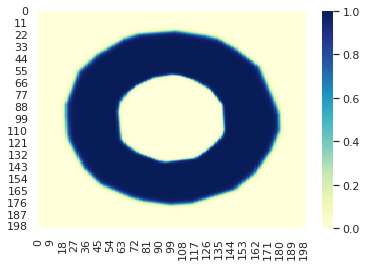


Epoch 51/100


100%|██████████| 20/20 [00:00<00:00, 647.70it/s]


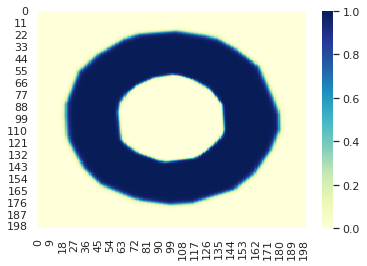


Epoch 52/100


100%|██████████| 20/20 [00:00<00:00, 665.09it/s]


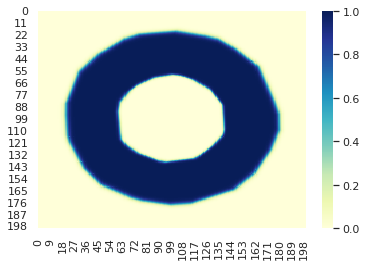


Epoch 53/100


100%|██████████| 20/20 [00:00<00:00, 669.57it/s]


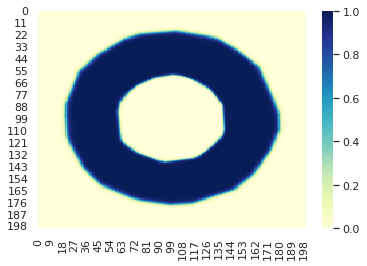


Epoch 54/100


100%|██████████| 20/20 [00:00<00:00, 591.18it/s]


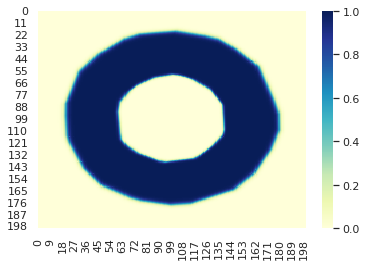


Epoch 55/100


100%|██████████| 20/20 [00:00<00:00, 681.58it/s]


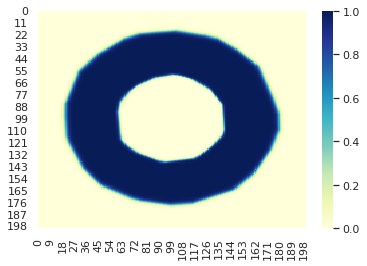


Epoch 56/100


100%|██████████| 20/20 [00:00<00:00, 627.01it/s]


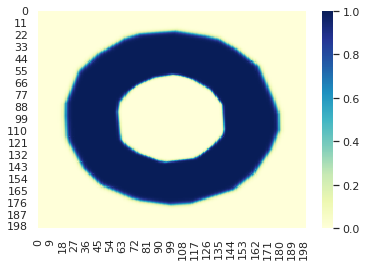


Epoch 57/100


100%|██████████| 20/20 [00:00<00:00, 664.32it/s]


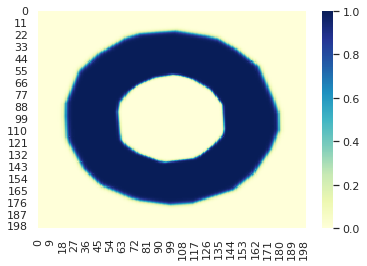


Epoch 58/100


100%|██████████| 20/20 [00:00<00:00, 569.17it/s]


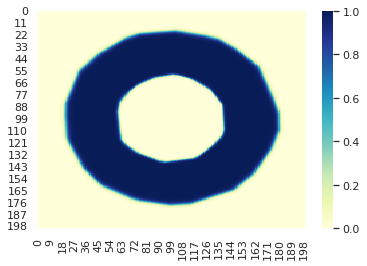


Epoch 59/100


100%|██████████| 20/20 [00:00<00:00, 607.61it/s]


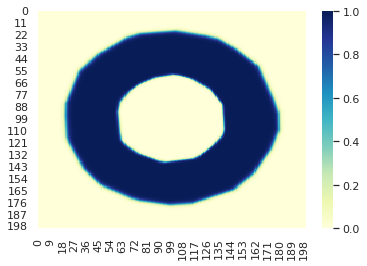


Epoch 60/100


100%|██████████| 20/20 [00:00<00:00, 694.41it/s]


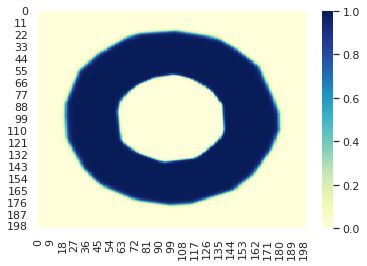


Epoch 61/100


100%|██████████| 20/20 [00:00<00:00, 693.55it/s]


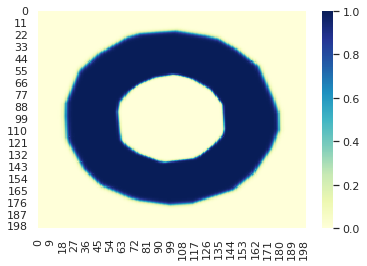


Epoch 62/100


100%|██████████| 20/20 [00:00<00:00, 631.02it/s]


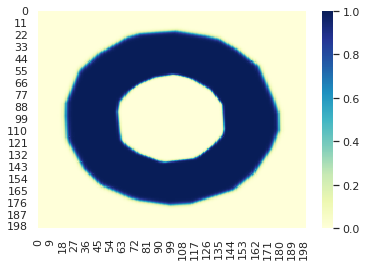


Epoch 63/100


100%|██████████| 20/20 [00:00<00:00, 586.51it/s]


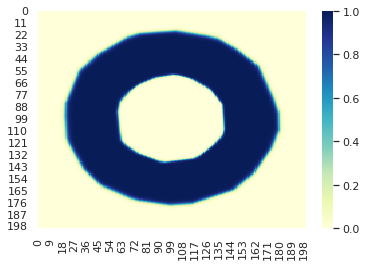


Epoch 64/100


100%|██████████| 20/20 [00:00<00:00, 556.84it/s]


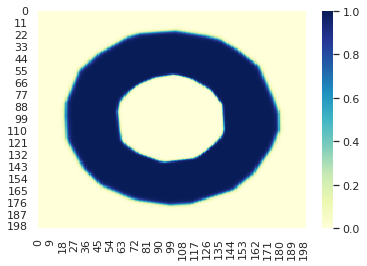


Epoch 65/100


100%|██████████| 20/20 [00:00<00:00, 606.96it/s]


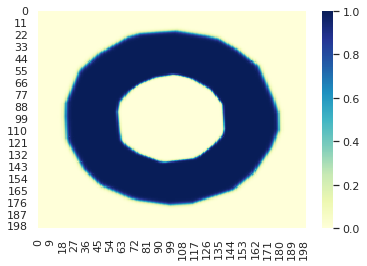


Epoch 66/100


100%|██████████| 20/20 [00:00<00:00, 548.34it/s]


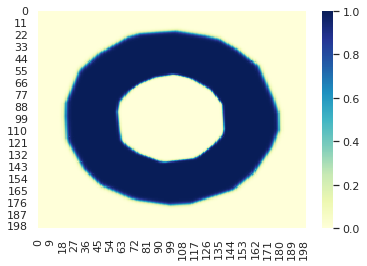


Epoch 67/100


100%|██████████| 20/20 [00:00<00:00, 653.89it/s]


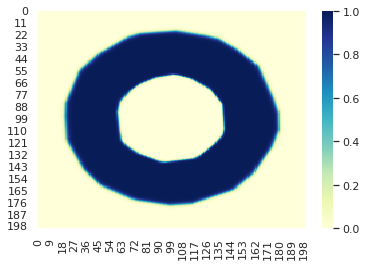


Epoch 68/100


100%|██████████| 20/20 [00:00<00:00, 583.57it/s]


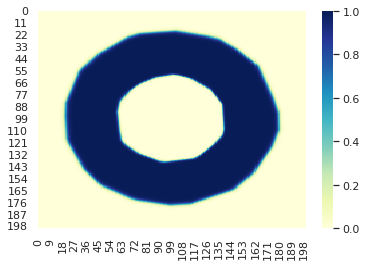


Epoch 69/100


100%|██████████| 20/20 [00:00<00:00, 630.88it/s]


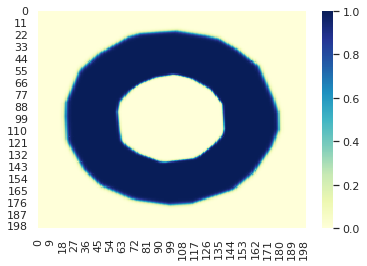


Epoch 70/100


100%|██████████| 20/20 [00:00<00:00, 639.57it/s]


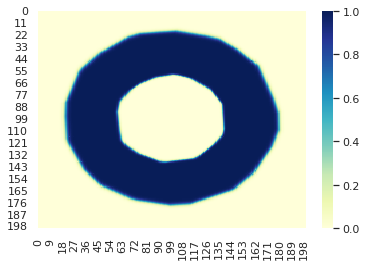


Epoch 71/100


100%|██████████| 20/20 [00:00<00:00, 636.65it/s]


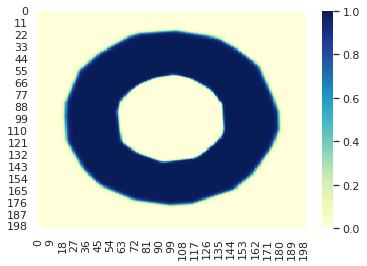


Epoch 72/100


100%|██████████| 20/20 [00:00<00:00, 658.27it/s]


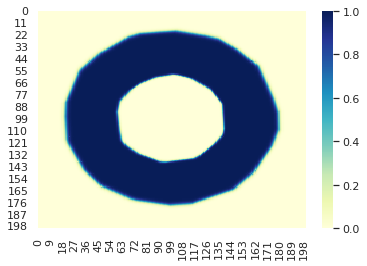


Epoch 73/100


100%|██████████| 20/20 [00:00<00:00, 609.44it/s]


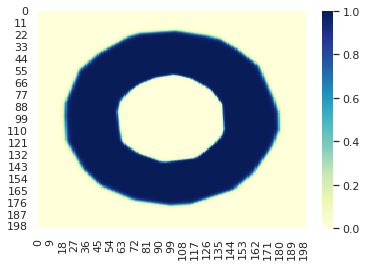


Epoch 74/100


100%|██████████| 20/20 [00:00<00:00, 597.93it/s]


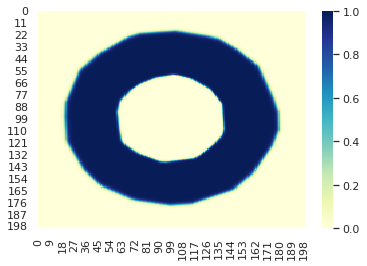


Epoch 75/100


100%|██████████| 20/20 [00:00<00:00, 667.91it/s]


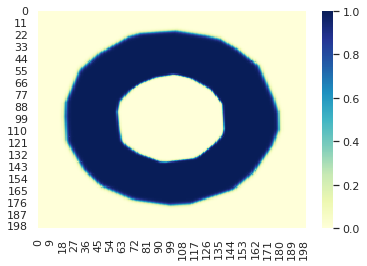


Epoch 76/100


100%|██████████| 20/20 [00:00<00:00, 559.93it/s]


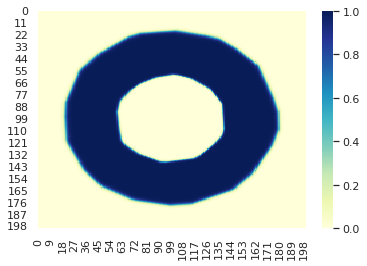


Epoch 77/100


100%|██████████| 20/20 [00:00<00:00, 689.67it/s]


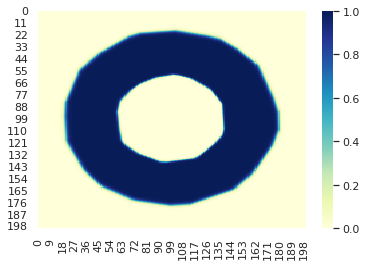


Epoch 78/100


100%|██████████| 20/20 [00:00<00:00, 584.33it/s]


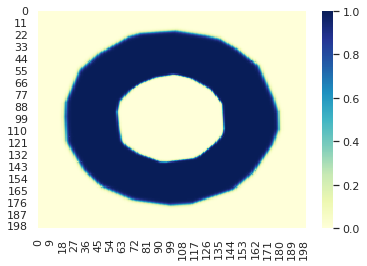


Epoch 79/100


100%|██████████| 20/20 [00:00<00:00, 667.08it/s]


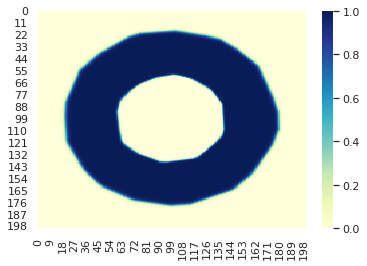


Epoch 80/100


100%|██████████| 20/20 [00:00<00:00, 670.69it/s]


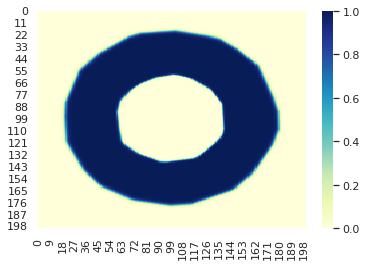


Epoch 81/100


100%|██████████| 20/20 [00:00<00:00, 621.78it/s]


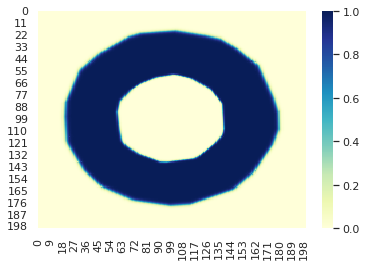


Epoch 82/100


100%|██████████| 20/20 [00:00<00:00, 716.20it/s]


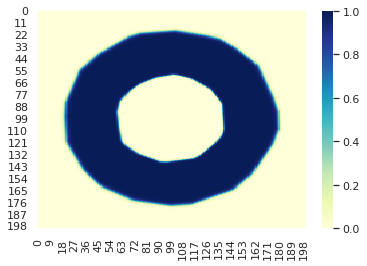


Epoch 83/100


100%|██████████| 20/20 [00:00<00:00, 640.83it/s]


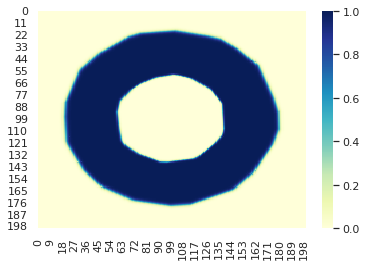


Epoch 84/100


100%|██████████| 20/20 [00:00<00:00, 607.74it/s]


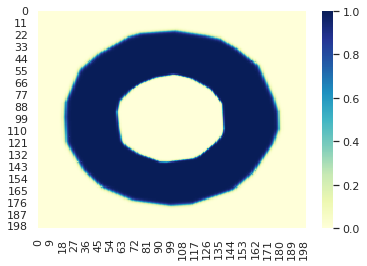


Epoch 85/100


100%|██████████| 20/20 [00:00<00:00, 640.88it/s]


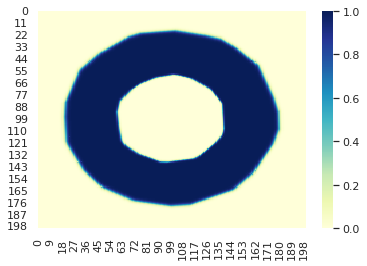


Epoch 86/100


100%|██████████| 20/20 [00:00<00:00, 637.17it/s]


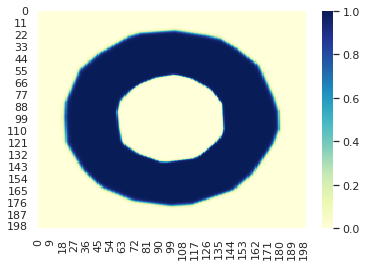


Epoch 87/100


100%|██████████| 20/20 [00:00<00:00, 645.83it/s]


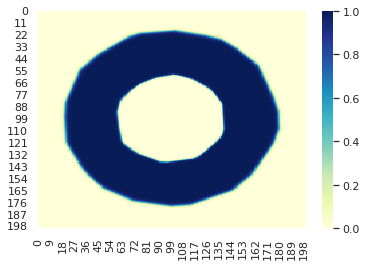


Epoch 88/100


100%|██████████| 20/20 [00:00<00:00, 615.50it/s]


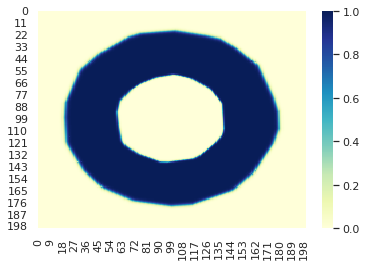


Epoch 89/100


100%|██████████| 20/20 [00:00<00:00, 649.28it/s]


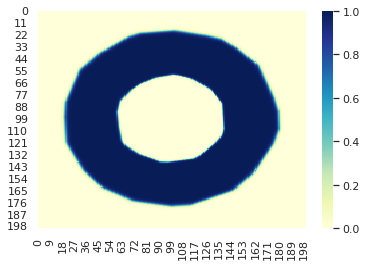


Epoch 90/100


100%|██████████| 20/20 [00:00<00:00, 670.07it/s]


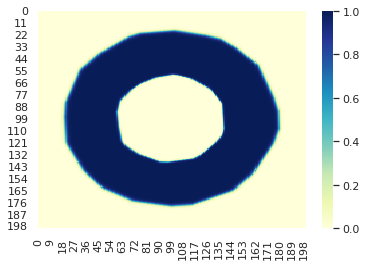


Epoch 91/100


100%|██████████| 20/20 [00:00<00:00, 666.23it/s]


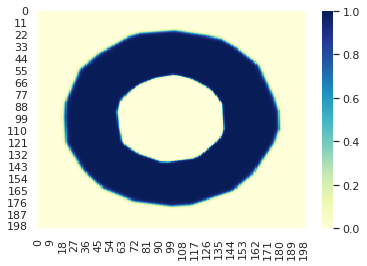


Epoch 92/100


100%|██████████| 20/20 [00:00<00:00, 587.29it/s]


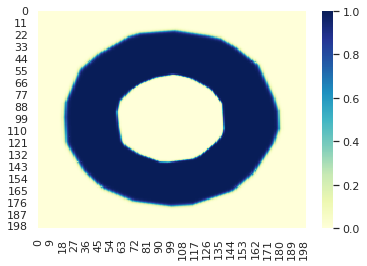


Epoch 93/100


100%|██████████| 20/20 [00:00<00:00, 669.96it/s]


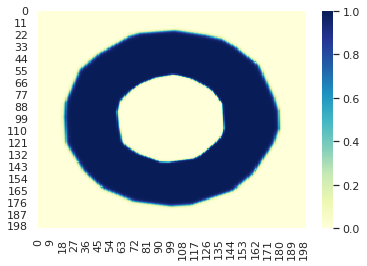


Epoch 94/100


100%|██████████| 20/20 [00:00<00:00, 673.79it/s]


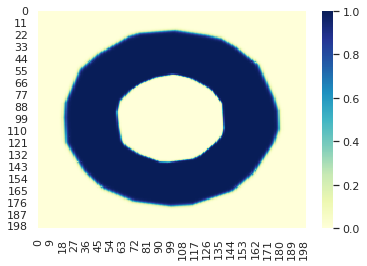


Epoch 95/100


100%|██████████| 20/20 [00:00<00:00, 645.09it/s]


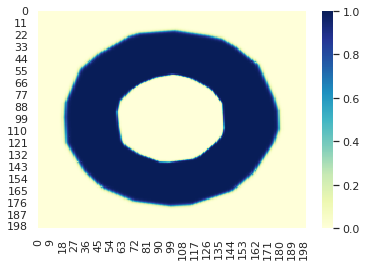


Epoch 96/100


100%|██████████| 20/20 [00:00<00:00, 623.12it/s]


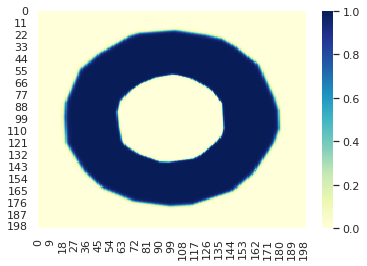


Epoch 97/100


100%|██████████| 20/20 [00:00<00:00, 619.02it/s]


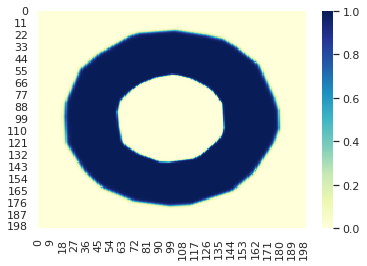


Epoch 98/100


100%|██████████| 20/20 [00:00<00:00, 644.61it/s]


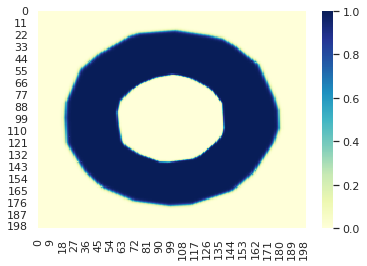


Epoch 99/100


100%|██████████| 20/20 [00:00<00:00, 694.52it/s]


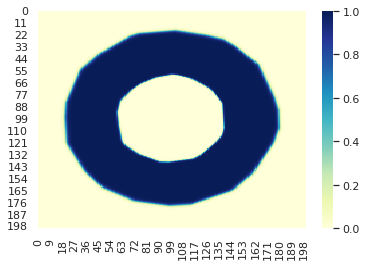


Epoch 100/100


100%|██████████| 20/20 [00:00<00:00, 571.61it/s]


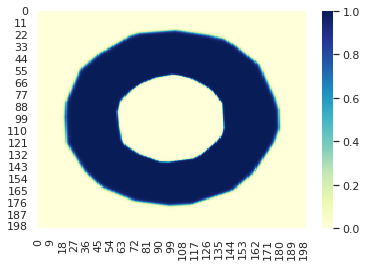

In [ ]:
model_dilate = Net()
train(model_dilate, x_dilate, y_dilate, 100, 100, plotter)

In [ ]:
model_original_copy_01 = copy.deepcopy(model_original)
model_original_copy_02 = copy.deepcopy(model_original)


Epoch 1/100


100%|██████████| 20/20 [00:00<00:00, 606.79it/s]


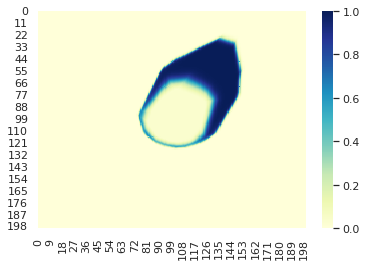


Epoch 2/100


100%|██████████| 20/20 [00:00<00:00, 832.51it/s]


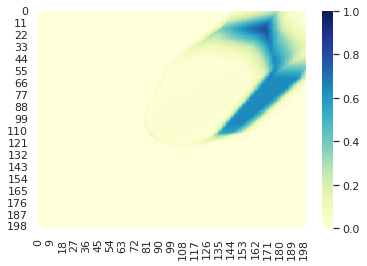


Epoch 3/100


100%|██████████| 20/20 [00:00<00:00, 724.39it/s]


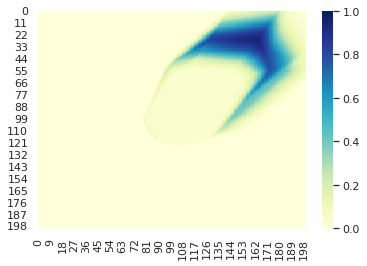


Epoch 4/100


100%|██████████| 20/20 [00:00<00:00, 804.14it/s]


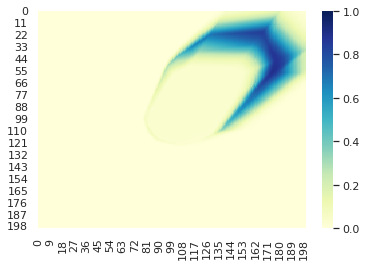


Epoch 5/100


100%|██████████| 20/20 [00:00<00:00, 699.17it/s]


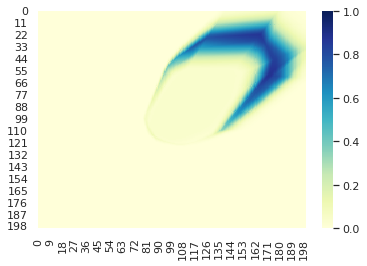


Epoch 6/100


100%|██████████| 20/20 [00:00<00:00, 874.58it/s]


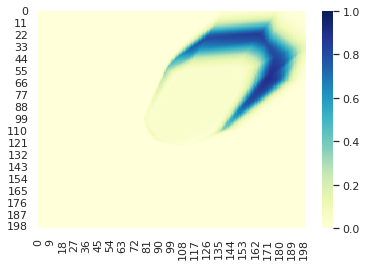


Epoch 7/100


100%|██████████| 20/20 [00:00<00:00, 658.43it/s]


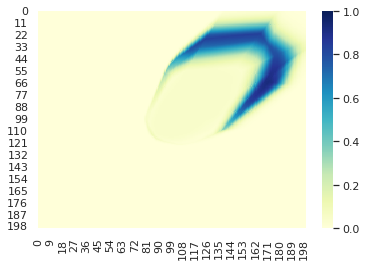


Epoch 8/100


100%|██████████| 20/20 [00:00<00:00, 621.89it/s]


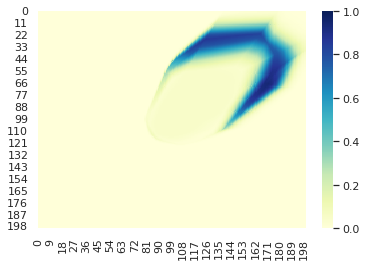


Epoch 9/100


100%|██████████| 20/20 [00:00<00:00, 565.08it/s]


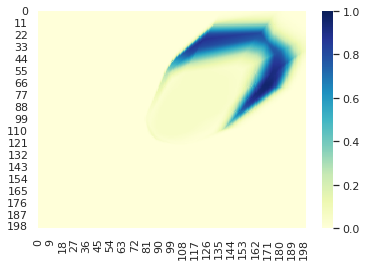


Epoch 10/100


100%|██████████| 20/20 [00:00<00:00, 668.12it/s]


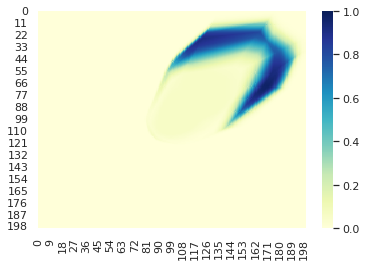


Epoch 11/100


100%|██████████| 20/20 [00:00<00:00, 679.68it/s]


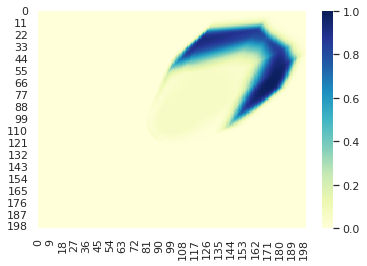


Epoch 12/100


100%|██████████| 20/20 [00:00<00:00, 658.45it/s]


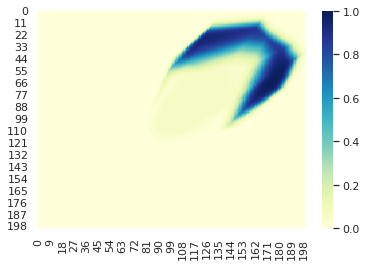


Epoch 13/100


100%|██████████| 20/20 [00:00<00:00, 572.86it/s]


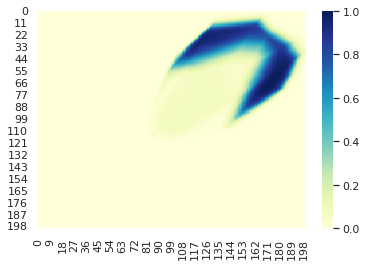


Epoch 14/100


100%|██████████| 20/20 [00:00<00:00, 665.06it/s]


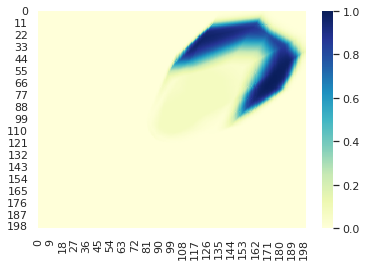


Epoch 15/100


100%|██████████| 20/20 [00:00<00:00, 736.06it/s]


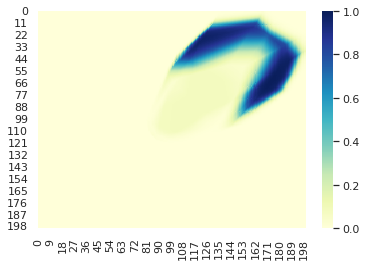


Epoch 16/100


100%|██████████| 20/20 [00:00<00:00, 629.00it/s]


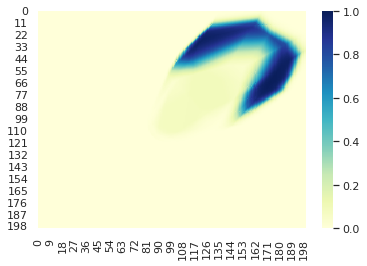


Epoch 17/100


100%|██████████| 20/20 [00:00<00:00, 481.82it/s]


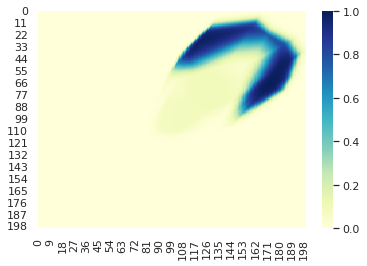


Epoch 18/100


100%|██████████| 20/20 [00:00<00:00, 631.97it/s]


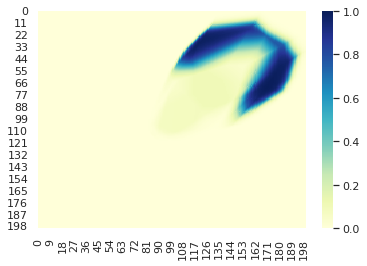


Epoch 19/100


100%|██████████| 20/20 [00:00<00:00, 518.43it/s]


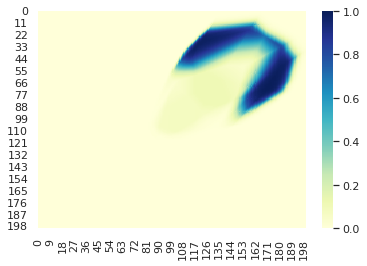


Epoch 20/100


100%|██████████| 20/20 [00:00<00:00, 578.47it/s]


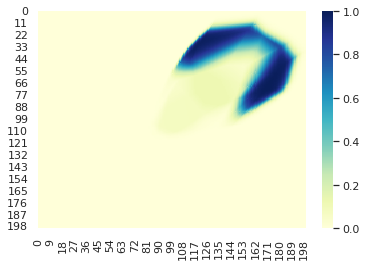


Epoch 21/100


100%|██████████| 20/20 [00:00<00:00, 521.39it/s]


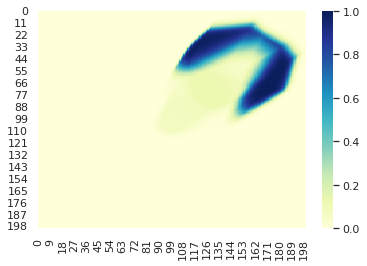


Epoch 22/100


100%|██████████| 20/20 [00:00<00:00, 464.29it/s]


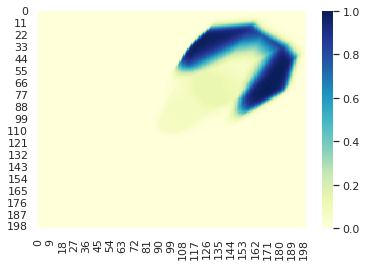


Epoch 23/100


100%|██████████| 20/20 [00:00<00:00, 497.63it/s]


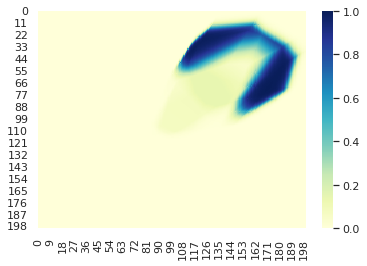


Epoch 24/100


100%|██████████| 20/20 [00:00<00:00, 501.92it/s]


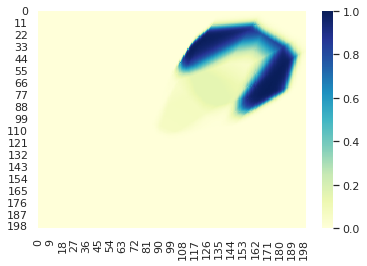


Epoch 25/100


100%|██████████| 20/20 [00:00<00:00, 518.54it/s]


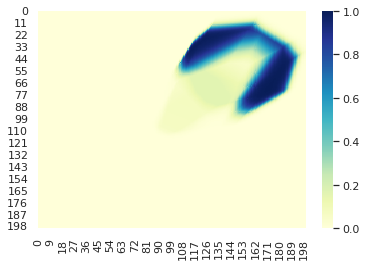


Epoch 26/100


100%|██████████| 20/20 [00:00<00:00, 468.10it/s]


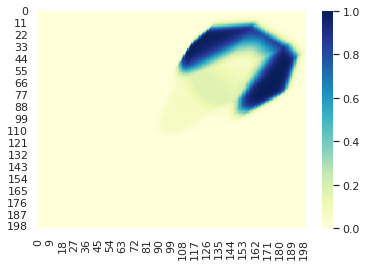


Epoch 27/100


100%|██████████| 20/20 [00:00<00:00, 542.46it/s]


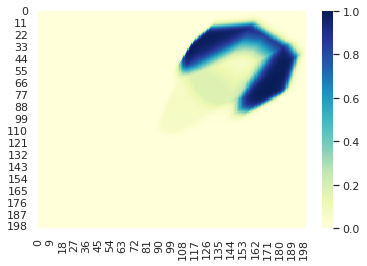


Epoch 28/100


100%|██████████| 20/20 [00:00<00:00, 389.74it/s]


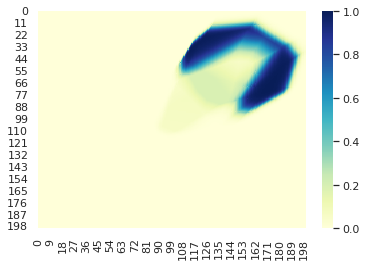


Epoch 29/100


100%|██████████| 20/20 [00:00<00:00, 518.00it/s]


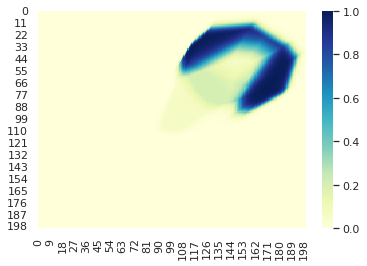


Epoch 30/100


100%|██████████| 20/20 [00:00<00:00, 480.66it/s]


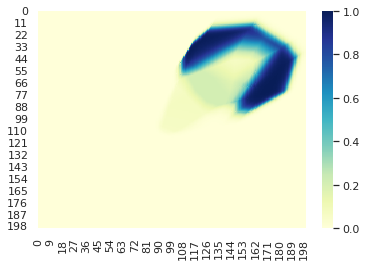


Epoch 31/100


100%|██████████| 20/20 [00:00<00:00, 435.14it/s]


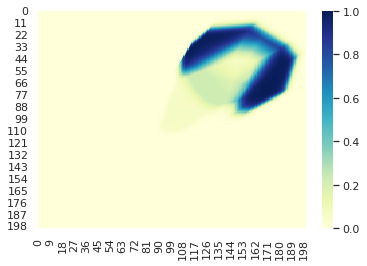


Epoch 32/100


100%|██████████| 20/20 [00:00<00:00, 465.73it/s]


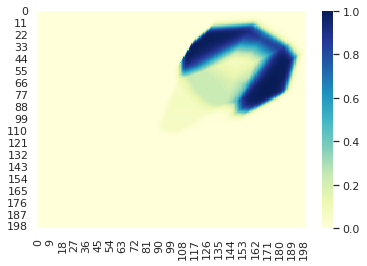


Epoch 33/100


100%|██████████| 20/20 [00:00<00:00, 447.89it/s]


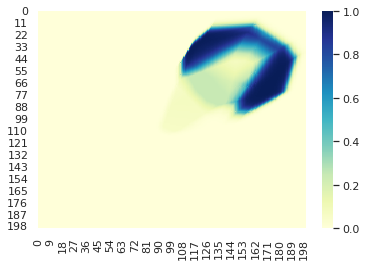


Epoch 34/100


100%|██████████| 20/20 [00:00<00:00, 451.47it/s]


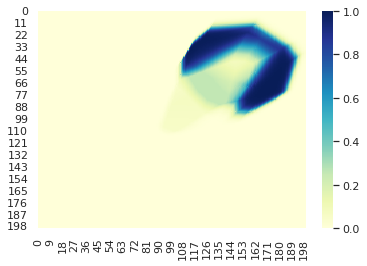


Epoch 35/100


100%|██████████| 20/20 [00:00<00:00, 448.81it/s]


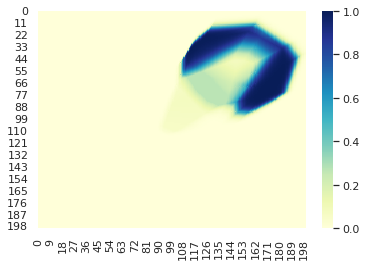


Epoch 36/100


100%|██████████| 20/20 [00:00<00:00, 453.29it/s]


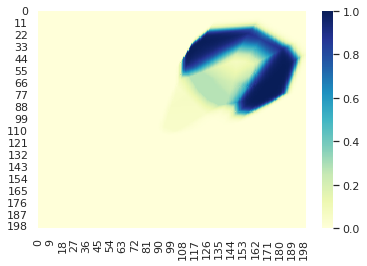


Epoch 37/100


100%|██████████| 20/20 [00:00<00:00, 466.46it/s]


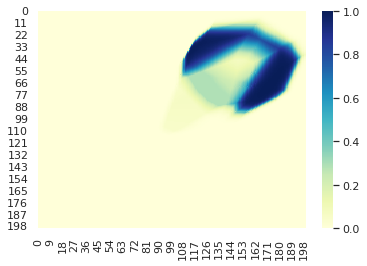


Epoch 38/100


100%|██████████| 20/20 [00:00<00:00, 433.01it/s]


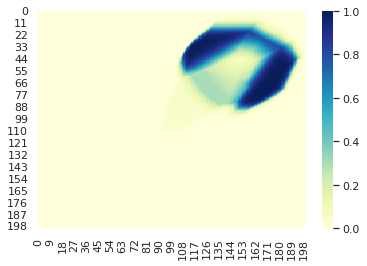


Epoch 39/100


100%|██████████| 20/20 [00:00<00:00, 482.79it/s]


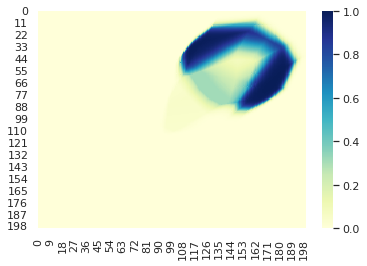


Epoch 40/100


100%|██████████| 20/20 [00:00<00:00, 510.92it/s]


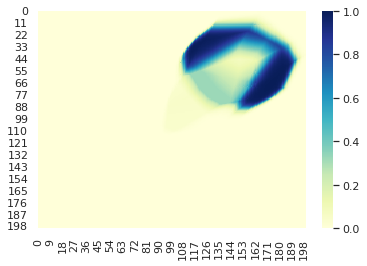


Epoch 41/100


100%|██████████| 20/20 [00:00<00:00, 448.07it/s]


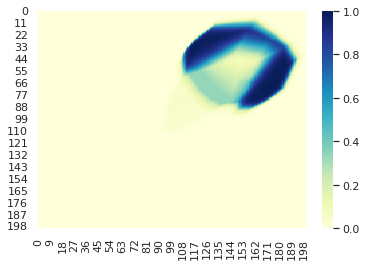


Epoch 42/100


100%|██████████| 20/20 [00:00<00:00, 465.95it/s]


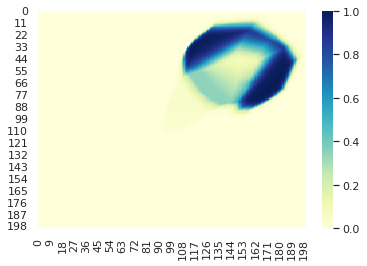


Epoch 43/100


100%|██████████| 20/20 [00:00<00:00, 516.24it/s]


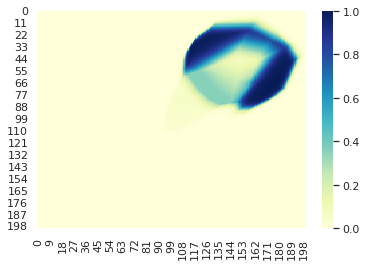


Epoch 44/100


100%|██████████| 20/20 [00:00<00:00, 527.66it/s]


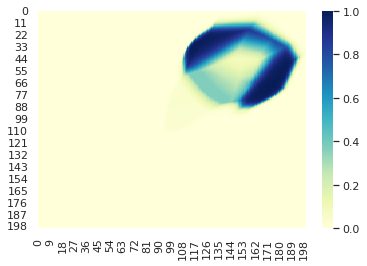


Epoch 45/100


100%|██████████| 20/20 [00:00<00:00, 404.01it/s]


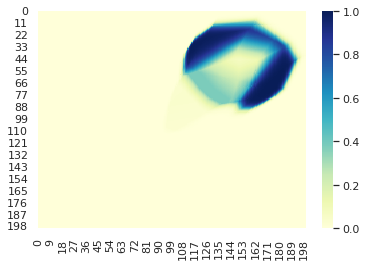


Epoch 46/100


100%|██████████| 20/20 [00:00<00:00, 485.15it/s]


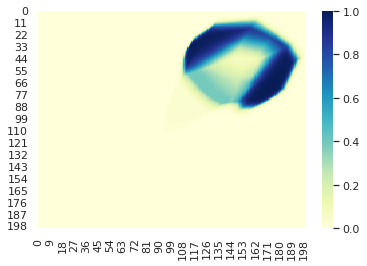


Epoch 47/100


100%|██████████| 20/20 [00:00<00:00, 444.67it/s]


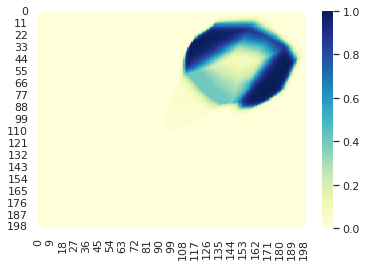


Epoch 48/100


100%|██████████| 20/20 [00:00<00:00, 402.59it/s]


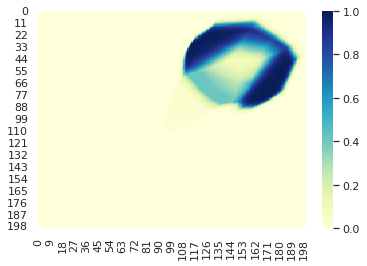


Epoch 49/100


100%|██████████| 20/20 [00:00<00:00, 451.34it/s]


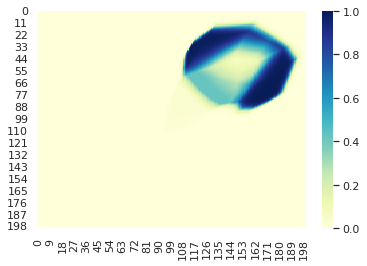


Epoch 50/100


100%|██████████| 20/20 [00:00<00:00, 408.09it/s]


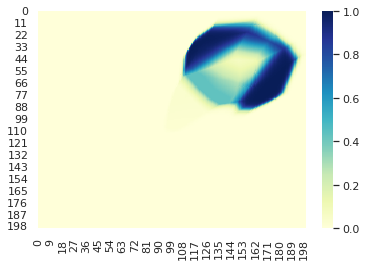


Epoch 51/100


100%|██████████| 20/20 [00:00<00:00, 565.46it/s]


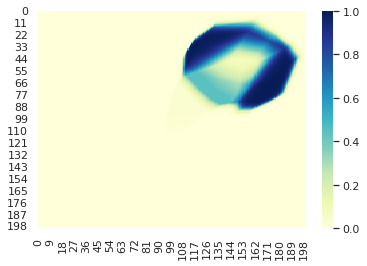


Epoch 52/100


100%|██████████| 20/20 [00:00<00:00, 457.44it/s]


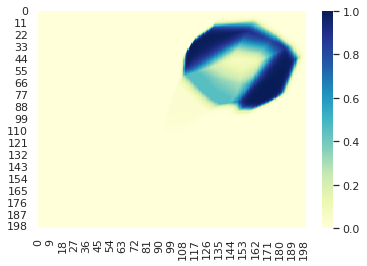


Epoch 53/100


100%|██████████| 20/20 [00:00<00:00, 482.42it/s]


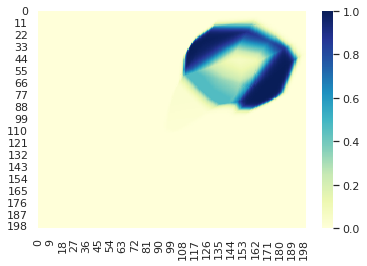


Epoch 54/100


100%|██████████| 20/20 [00:00<00:00, 512.29it/s]


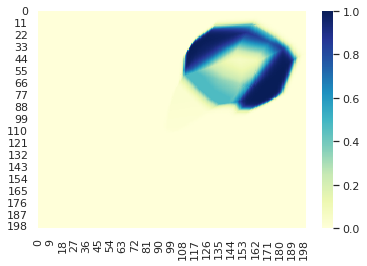


Epoch 55/100


100%|██████████| 20/20 [00:00<00:00, 432.92it/s]


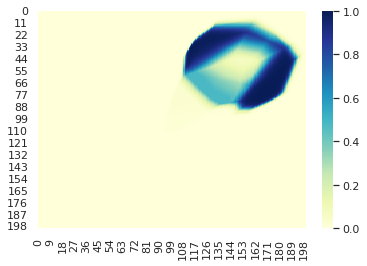


Epoch 56/100


100%|██████████| 20/20 [00:00<00:00, 479.23it/s]


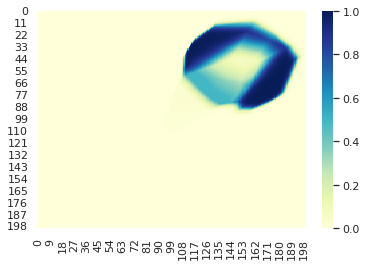


Epoch 57/100


100%|██████████| 20/20 [00:00<00:00, 436.97it/s]


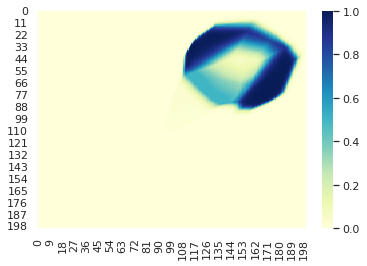


Epoch 58/100


100%|██████████| 20/20 [00:00<00:00, 502.78it/s]


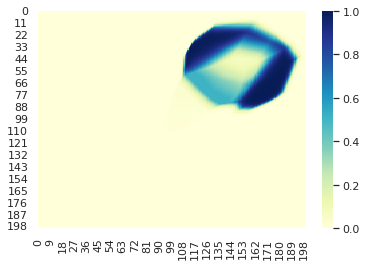


Epoch 59/100


100%|██████████| 20/20 [00:00<00:00, 460.96it/s]


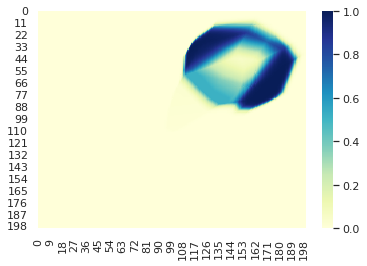


Epoch 60/100


100%|██████████| 20/20 [00:00<00:00, 481.92it/s]


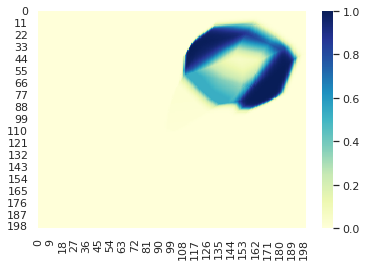


Epoch 61/100


100%|██████████| 20/20 [00:00<00:00, 439.41it/s]


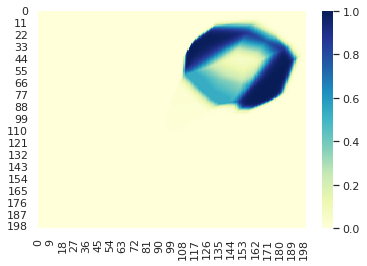


Epoch 62/100


100%|██████████| 20/20 [00:00<00:00, 440.22it/s]


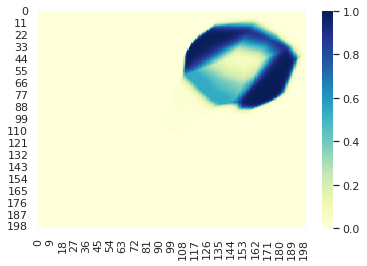


Epoch 63/100


100%|██████████| 20/20 [00:00<00:00, 465.29it/s]


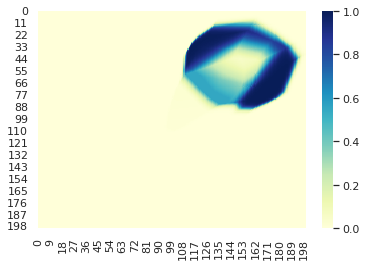


Epoch 64/100


100%|██████████| 20/20 [00:00<00:00, 497.05it/s]


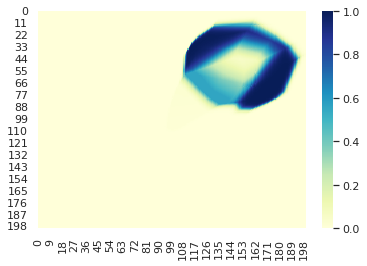


Epoch 65/100


100%|██████████| 20/20 [00:00<00:00, 455.72it/s]


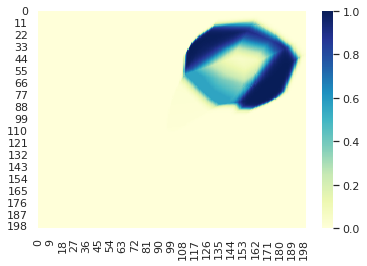


Epoch 66/100


100%|██████████| 20/20 [00:00<00:00, 472.07it/s]


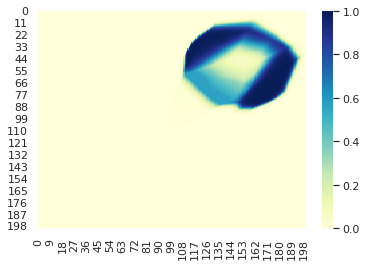


Epoch 67/100


100%|██████████| 20/20 [00:00<00:00, 508.26it/s]


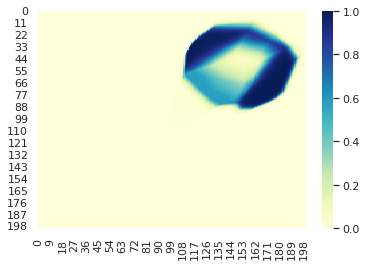


Epoch 68/100


100%|██████████| 20/20 [00:00<00:00, 461.05it/s]


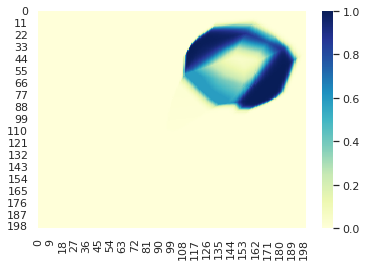


Epoch 69/100


100%|██████████| 20/20 [00:00<00:00, 418.61it/s]


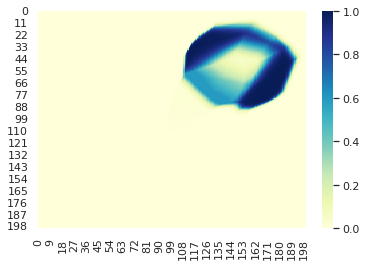


Epoch 70/100


100%|██████████| 20/20 [00:00<00:00, 493.69it/s]


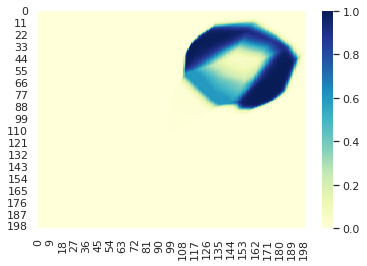


Epoch 71/100


100%|██████████| 20/20 [00:00<00:00, 432.04it/s]


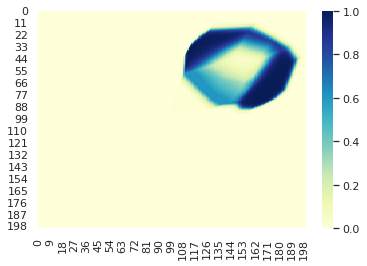


Epoch 72/100


100%|██████████| 20/20 [00:00<00:00, 461.17it/s]


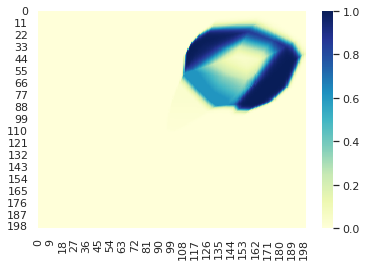


Epoch 73/100


100%|██████████| 20/20 [00:00<00:00, 459.34it/s]


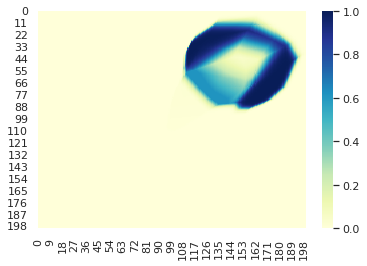


Epoch 74/100


100%|██████████| 20/20 [00:00<00:00, 480.95it/s]


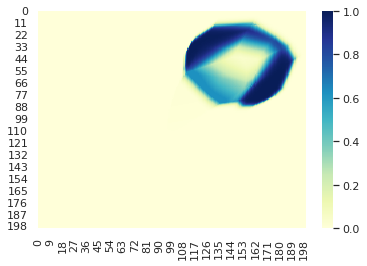


Epoch 75/100


100%|██████████| 20/20 [00:00<00:00, 469.58it/s]


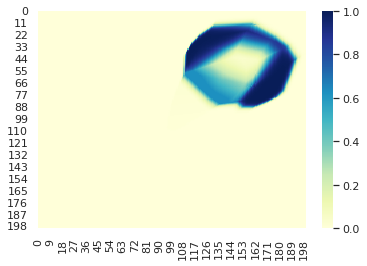


Epoch 76/100


100%|██████████| 20/20 [00:00<00:00, 444.62it/s]


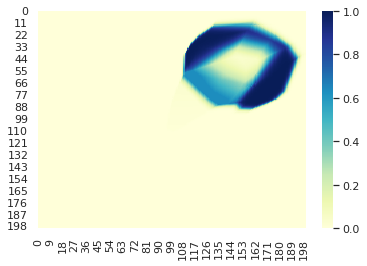


Epoch 77/100


100%|██████████| 20/20 [00:00<00:00, 511.47it/s]


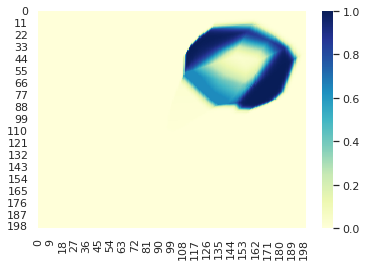


Epoch 78/100


100%|██████████| 20/20 [00:00<00:00, 467.87it/s]


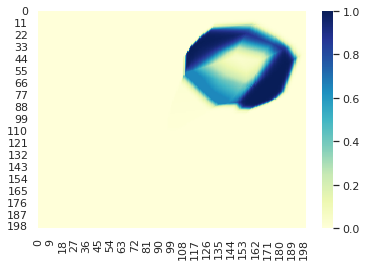


Epoch 79/100


100%|██████████| 20/20 [00:00<00:00, 500.64it/s]


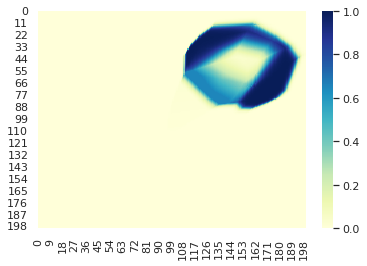


Epoch 80/100


100%|██████████| 20/20 [00:00<00:00, 409.54it/s]


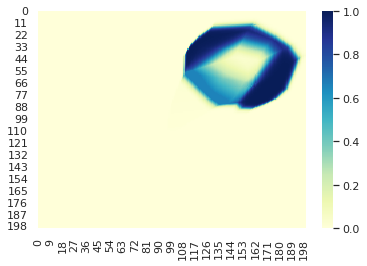


Epoch 81/100


100%|██████████| 20/20 [00:00<00:00, 569.26it/s]


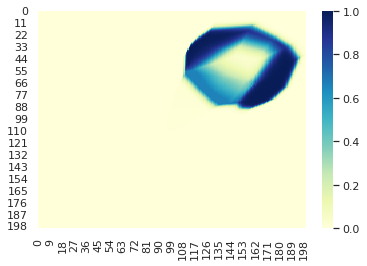


Epoch 82/100


100%|██████████| 20/20 [00:00<00:00, 429.11it/s]


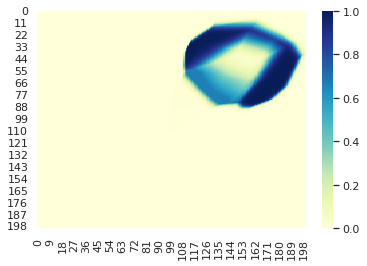


Epoch 83/100


100%|██████████| 20/20 [00:00<00:00, 420.76it/s]


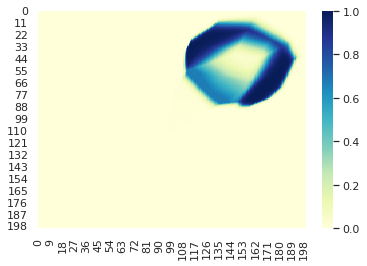


Epoch 84/100


100%|██████████| 20/20 [00:00<00:00, 466.33it/s]


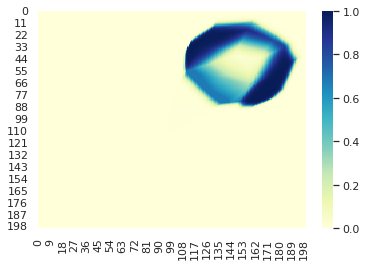


Epoch 85/100


100%|██████████| 20/20 [00:00<00:00, 433.00it/s]


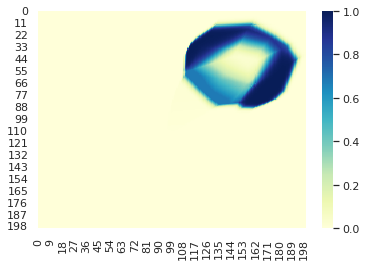


Epoch 86/100


100%|██████████| 20/20 [00:00<00:00, 440.42it/s]


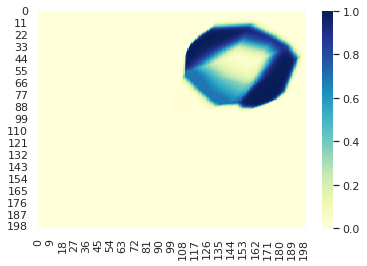


Epoch 87/100


100%|██████████| 20/20 [00:00<00:00, 434.90it/s]


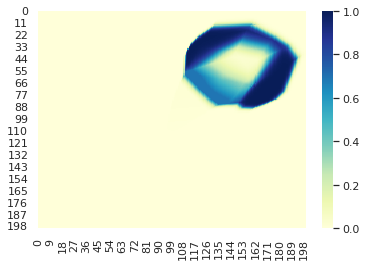


Epoch 88/100


100%|██████████| 20/20 [00:00<00:00, 499.70it/s]


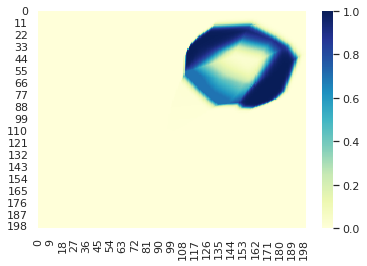


Epoch 89/100


100%|██████████| 20/20 [00:00<00:00, 411.84it/s]


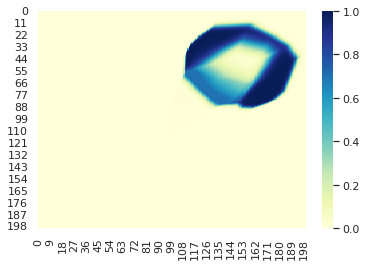


Epoch 90/100


100%|██████████| 20/20 [00:00<00:00, 414.48it/s]


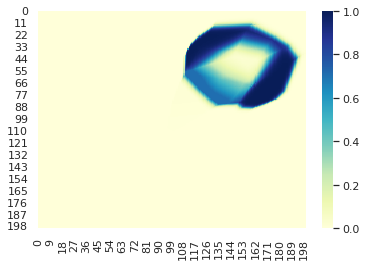


Epoch 91/100


100%|██████████| 20/20 [00:00<00:00, 478.79it/s]


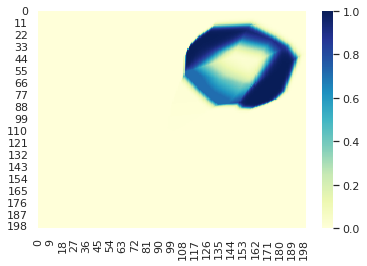


Epoch 92/100


100%|██████████| 20/20 [00:00<00:00, 479.73it/s]


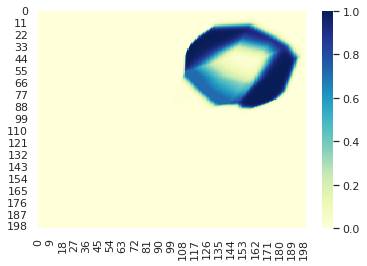


Epoch 93/100


100%|██████████| 20/20 [00:00<00:00, 516.20it/s]


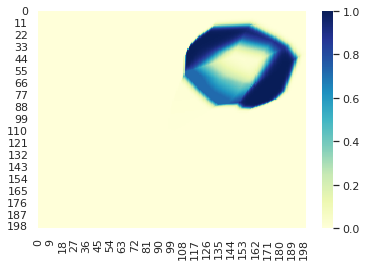


Epoch 94/100


100%|██████████| 20/20 [00:00<00:00, 438.93it/s]


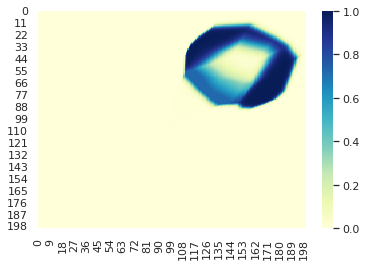


Epoch 95/100


100%|██████████| 20/20 [00:00<00:00, 498.13it/s]


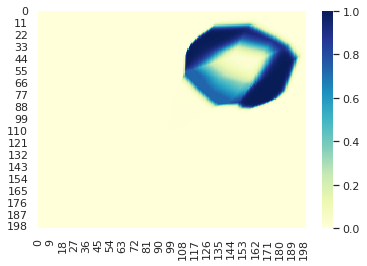


Epoch 96/100


100%|██████████| 20/20 [00:00<00:00, 519.93it/s]


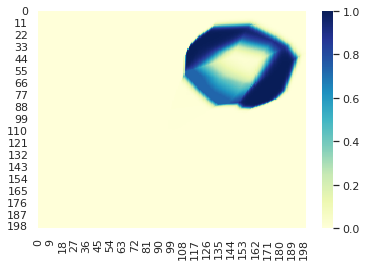


Epoch 97/100


100%|██████████| 20/20 [00:00<00:00, 482.84it/s]


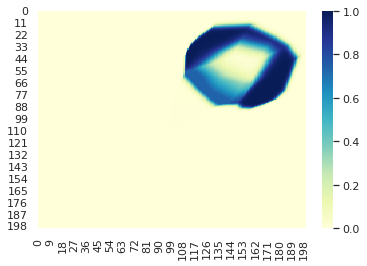


Epoch 98/100


100%|██████████| 20/20 [00:00<00:00, 462.26it/s]


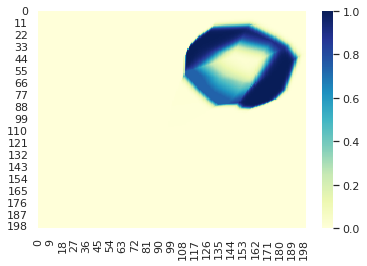


Epoch 99/100


100%|██████████| 20/20 [00:00<00:00, 486.54it/s]


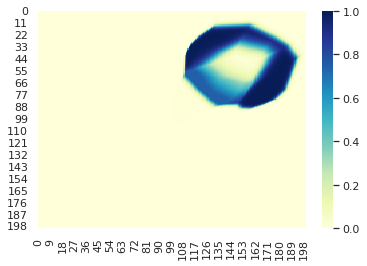


Epoch 100/100


100%|██████████| 20/20 [00:00<00:00, 503.04it/s]


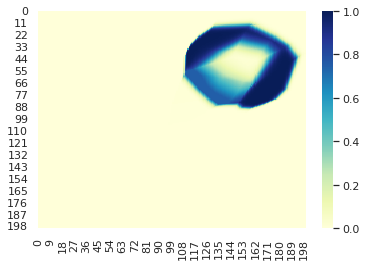

In [ ]:
train(model_original_copy_01, x_shift, y_shift, 100, 100, plotter)


Epoch 1/100


100%|██████████| 20/20 [00:00<00:00, 611.87it/s]


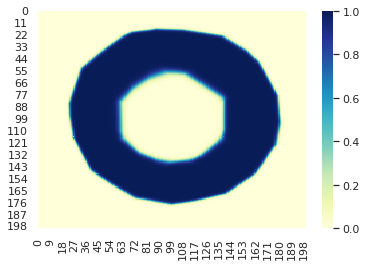


Epoch 2/100


100%|██████████| 20/20 [00:00<00:00, 463.22it/s]


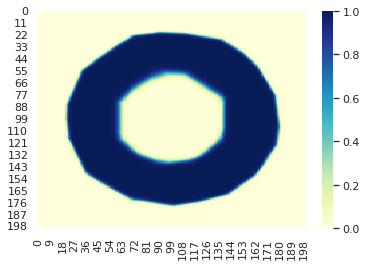


Epoch 3/100


100%|██████████| 20/20 [00:00<00:00, 368.14it/s]


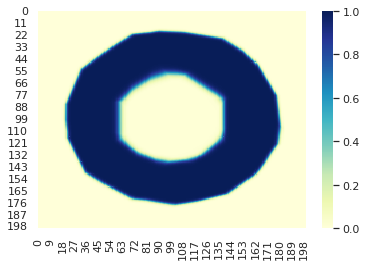


Epoch 4/100


100%|██████████| 20/20 [00:00<00:00, 351.18it/s]


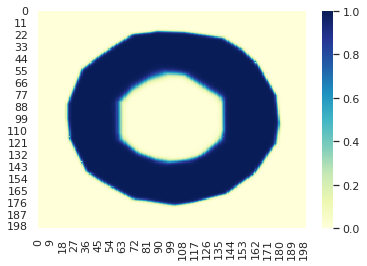


Epoch 5/100


100%|██████████| 20/20 [00:00<00:00, 419.84it/s]


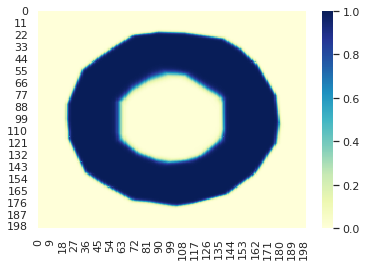


Epoch 6/100


100%|██████████| 20/20 [00:00<00:00, 132.61it/s]


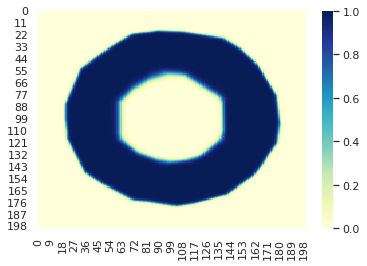


Epoch 7/100


100%|██████████| 20/20 [00:00<00:00, 545.29it/s]


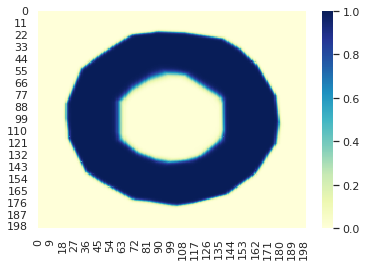


Epoch 8/100


100%|██████████| 20/20 [00:00<00:00, 561.75it/s]


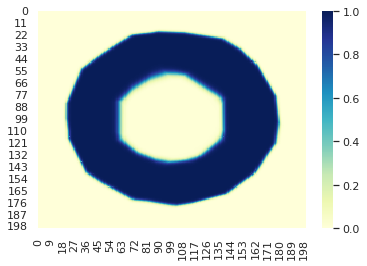


Epoch 9/100


100%|██████████| 20/20 [00:00<00:00, 572.31it/s]


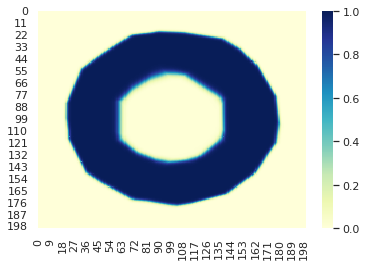


Epoch 10/100


100%|██████████| 20/20 [00:00<00:00, 469.46it/s]


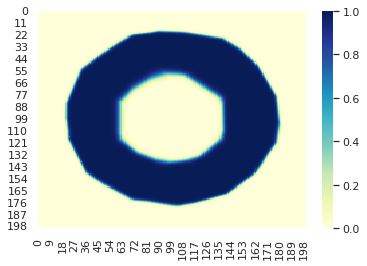


Epoch 11/100


100%|██████████| 20/20 [00:00<00:00, 486.95it/s]


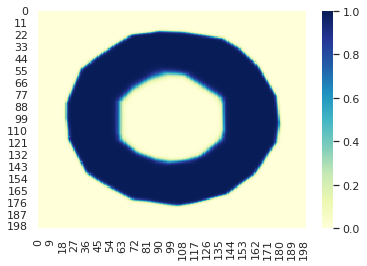


Epoch 12/100


100%|██████████| 20/20 [00:00<00:00, 572.30it/s]


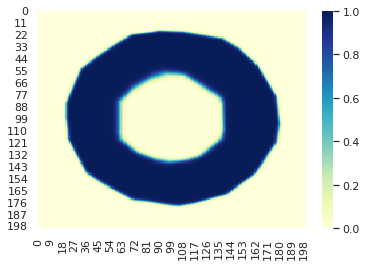


Epoch 13/100


100%|██████████| 20/20 [00:00<00:00, 533.26it/s]


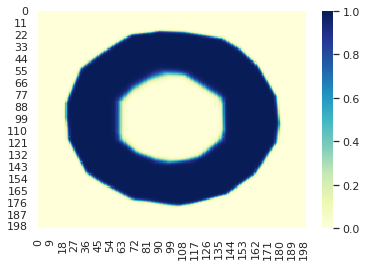


Epoch 14/100


100%|██████████| 20/20 [00:00<00:00, 574.25it/s]


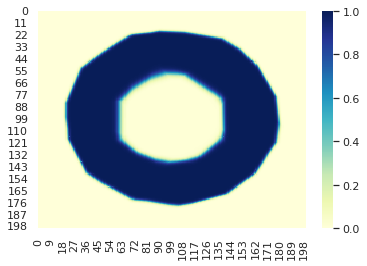


Epoch 15/100


100%|██████████| 20/20 [00:00<00:00, 511.92it/s]


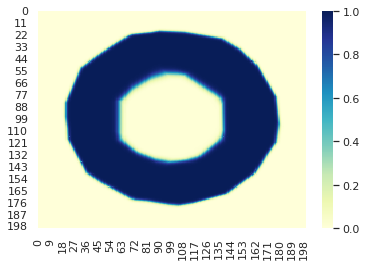


Epoch 16/100


100%|██████████| 20/20 [00:00<00:00, 542.51it/s]


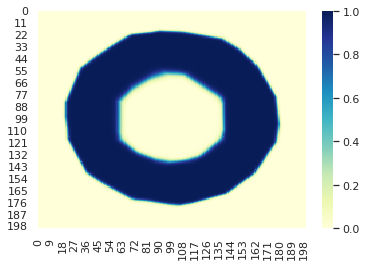


Epoch 17/100


100%|██████████| 20/20 [00:00<00:00, 578.54it/s]


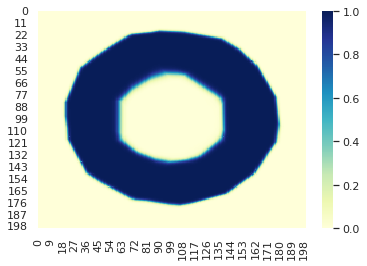


Epoch 18/100


100%|██████████| 20/20 [00:00<00:00, 548.38it/s]


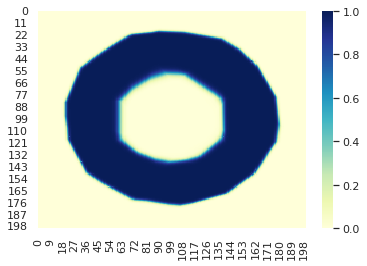


Epoch 19/100


100%|██████████| 20/20 [00:00<00:00, 518.62it/s]


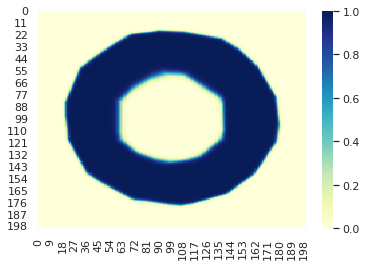


Epoch 20/100


100%|██████████| 20/20 [00:00<00:00, 576.45it/s]


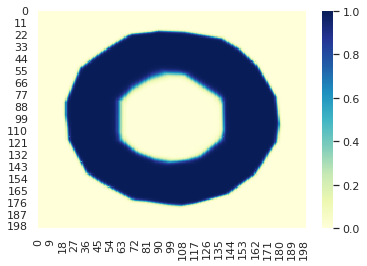


Epoch 21/100


100%|██████████| 20/20 [00:00<00:00, 589.78it/s]


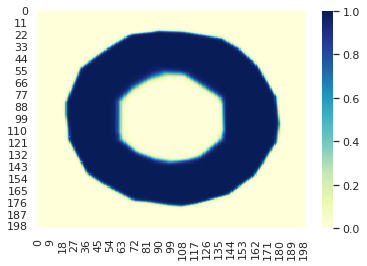


Epoch 22/100


100%|██████████| 20/20 [00:00<00:00, 522.56it/s]


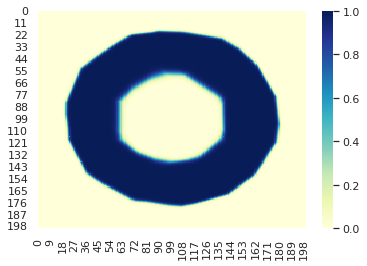


Epoch 23/100


100%|██████████| 20/20 [00:00<00:00, 580.90it/s]


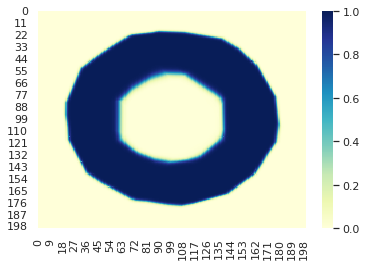


Epoch 24/100


100%|██████████| 20/20 [00:00<00:00, 607.48it/s]


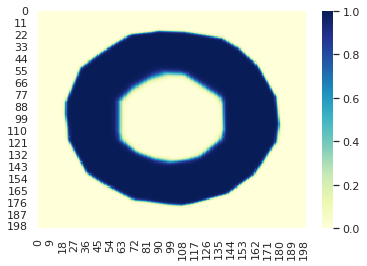


Epoch 25/100


100%|██████████| 20/20 [00:00<00:00, 585.16it/s]


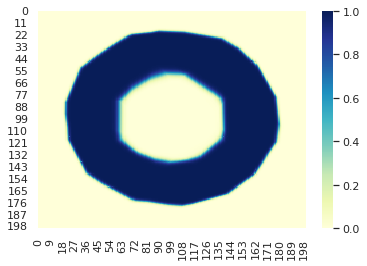


Epoch 26/100


100%|██████████| 20/20 [00:00<00:00, 598.25it/s]


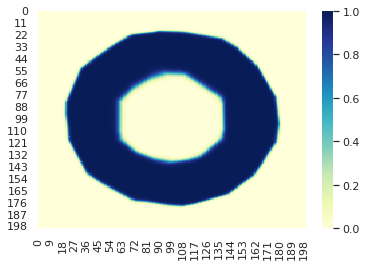


Epoch 27/100


100%|██████████| 20/20 [00:00<00:00, 615.66it/s]


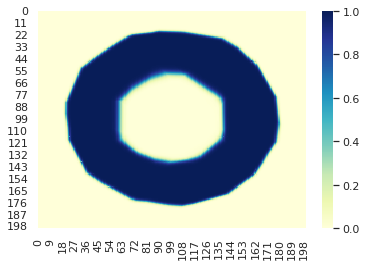


Epoch 28/100


100%|██████████| 20/20 [00:00<00:00, 572.70it/s]


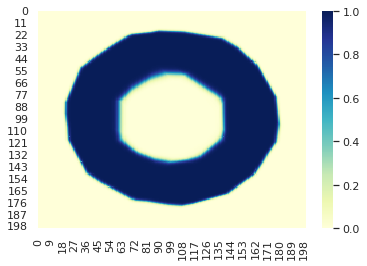


Epoch 29/100


100%|██████████| 20/20 [00:00<00:00, 532.65it/s]


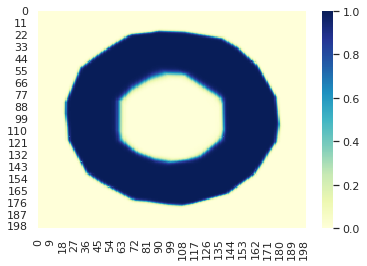


Epoch 30/100


100%|██████████| 20/20 [00:00<00:00, 602.07it/s]


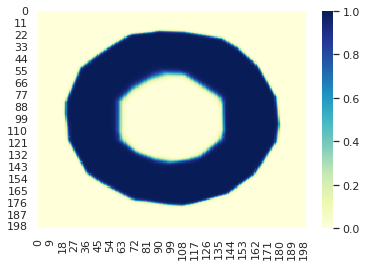


Epoch 31/100


100%|██████████| 20/20 [00:00<00:00, 512.93it/s]


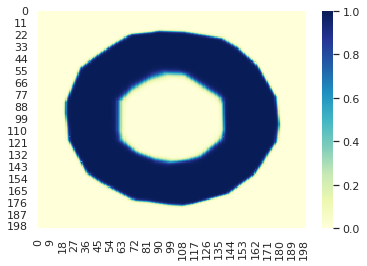


Epoch 32/100


100%|██████████| 20/20 [00:00<00:00, 569.66it/s]


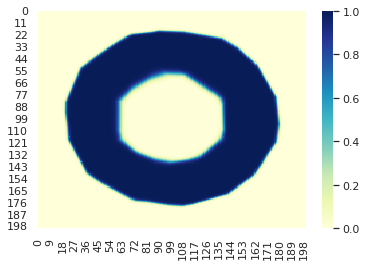


Epoch 33/100


100%|██████████| 20/20 [00:00<00:00, 551.42it/s]


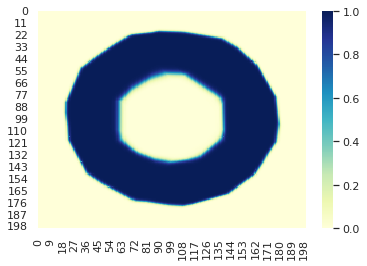


Epoch 34/100


100%|██████████| 20/20 [00:00<00:00, 532.99it/s]


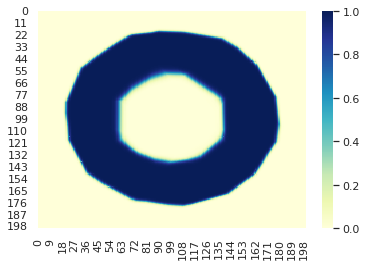


Epoch 35/100


100%|██████████| 20/20 [00:00<00:00, 628.68it/s]


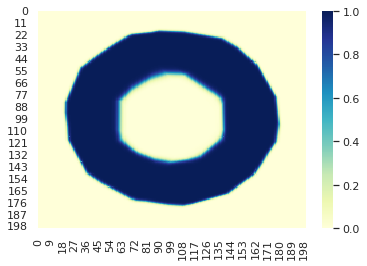


Epoch 36/100


100%|██████████| 20/20 [00:00<00:00, 508.65it/s]


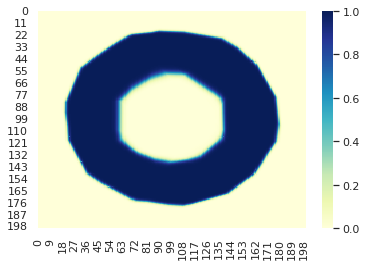


Epoch 37/100


100%|██████████| 20/20 [00:00<00:00, 619.21it/s]


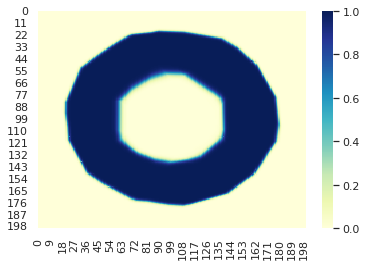


Epoch 38/100


100%|██████████| 20/20 [00:00<00:00, 563.42it/s]


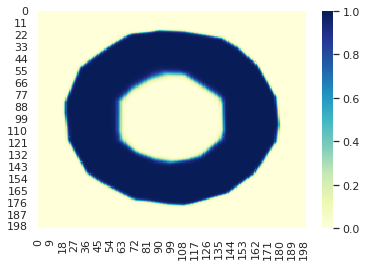


Epoch 39/100


100%|██████████| 20/20 [00:00<00:00, 556.64it/s]


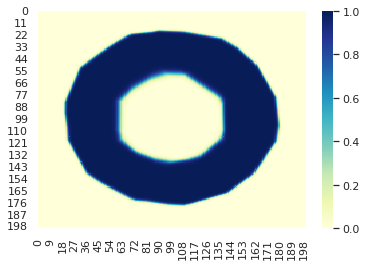


Epoch 40/100


100%|██████████| 20/20 [00:00<00:00, 577.30it/s]


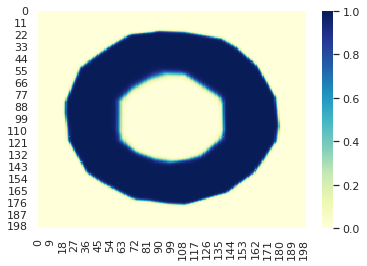


Epoch 41/100


100%|██████████| 20/20 [00:00<00:00, 548.45it/s]


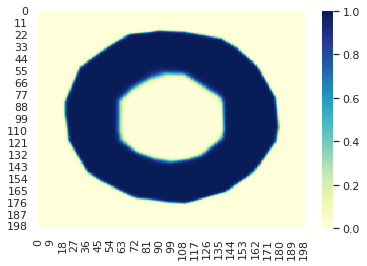


Epoch 42/100


100%|██████████| 20/20 [00:00<00:00, 610.82it/s]


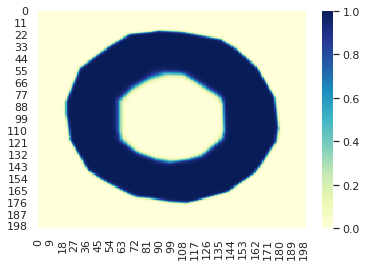


Epoch 43/100


100%|██████████| 20/20 [00:00<00:00, 550.51it/s]


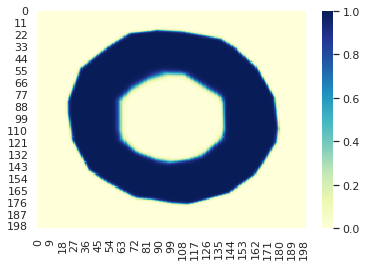


Epoch 44/100


100%|██████████| 20/20 [00:00<00:00, 612.11it/s]


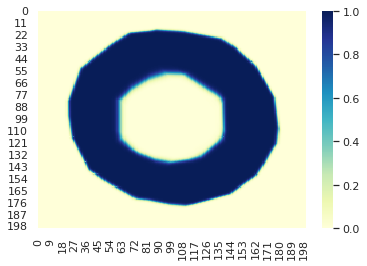


Epoch 45/100


100%|██████████| 20/20 [00:00<00:00, 521.96it/s]


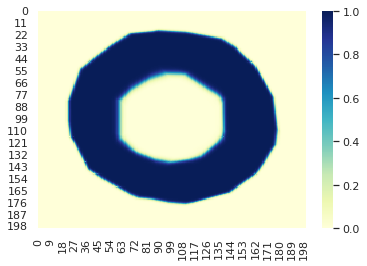


Epoch 46/100


100%|██████████| 20/20 [00:00<00:00, 572.21it/s]


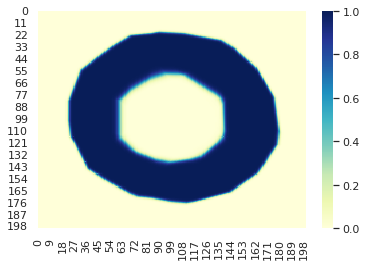


Epoch 47/100


100%|██████████| 20/20 [00:00<00:00, 660.27it/s]


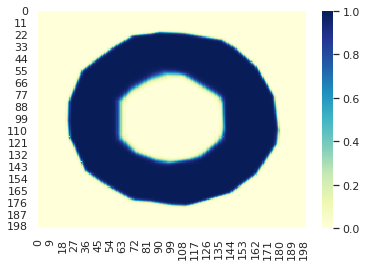


Epoch 48/100


100%|██████████| 20/20 [00:00<00:00, 647.55it/s]


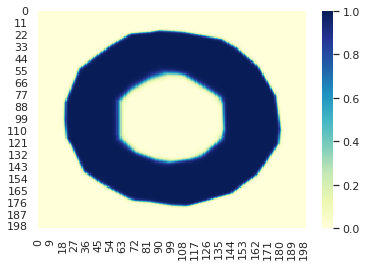


Epoch 49/100


100%|██████████| 20/20 [00:00<00:00, 544.35it/s]


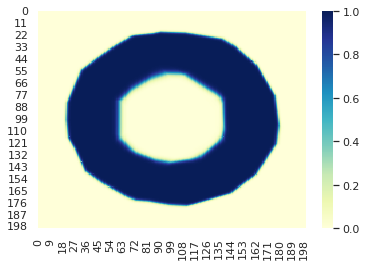


Epoch 50/100


100%|██████████| 20/20 [00:00<00:00, 535.61it/s]


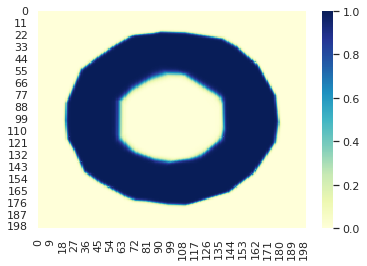


Epoch 51/100


100%|██████████| 20/20 [00:00<00:00, 639.22it/s]


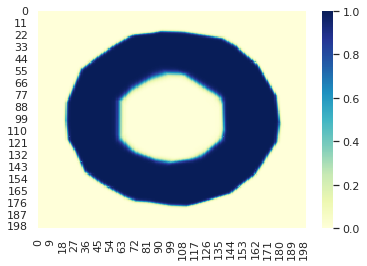


Epoch 52/100


100%|██████████| 20/20 [00:00<00:00, 593.38it/s]


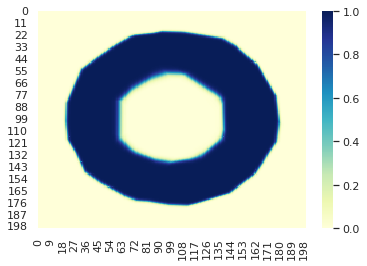


Epoch 53/100


100%|██████████| 20/20 [00:00<00:00, 579.80it/s]


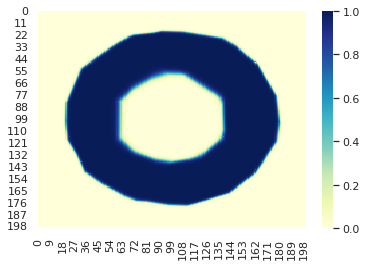


Epoch 54/100


100%|██████████| 20/20 [00:00<00:00, 583.58it/s]


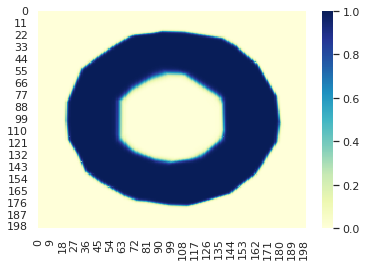


Epoch 55/100


100%|██████████| 20/20 [00:00<00:00, 626.89it/s]


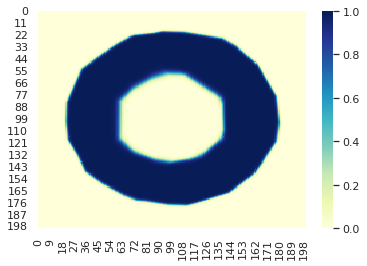


Epoch 56/100


100%|██████████| 20/20 [00:00<00:00, 610.87it/s]


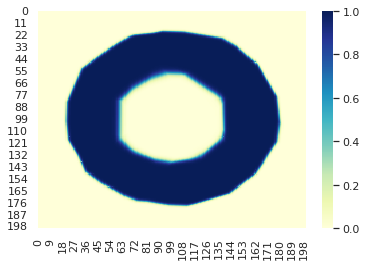


Epoch 57/100


100%|██████████| 20/20 [00:00<00:00, 646.66it/s]


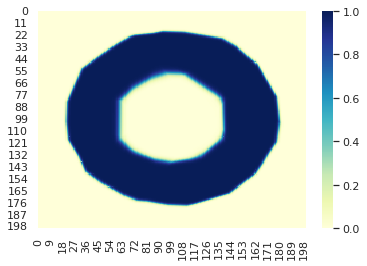


Epoch 58/100


100%|██████████| 20/20 [00:00<00:00, 595.44it/s]


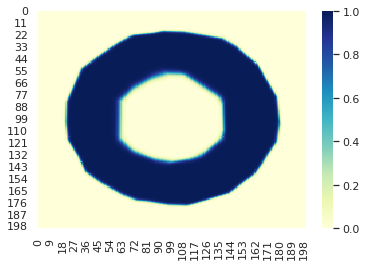


Epoch 59/100


100%|██████████| 20/20 [00:00<00:00, 591.48it/s]


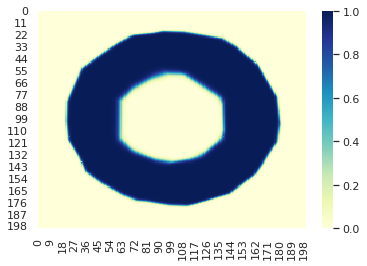


Epoch 60/100


100%|██████████| 20/20 [00:00<00:00, 573.60it/s]


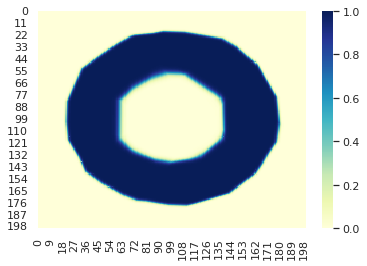


Epoch 61/100


100%|██████████| 20/20 [00:00<00:00, 627.43it/s]


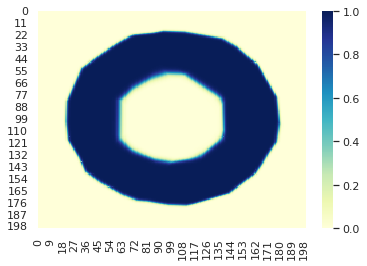


Epoch 62/100


100%|██████████| 20/20 [00:00<00:00, 584.14it/s]


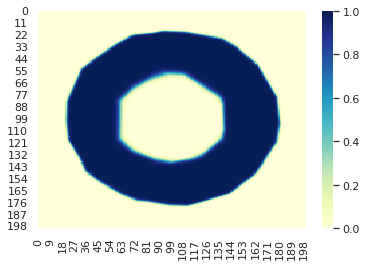


Epoch 63/100


100%|██████████| 20/20 [00:00<00:00, 632.03it/s]


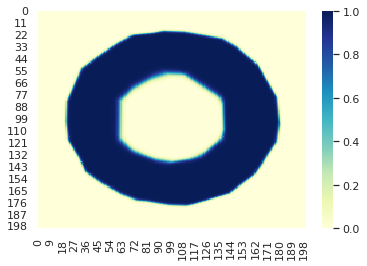


Epoch 64/100


100%|██████████| 20/20 [00:00<00:00, 438.09it/s]


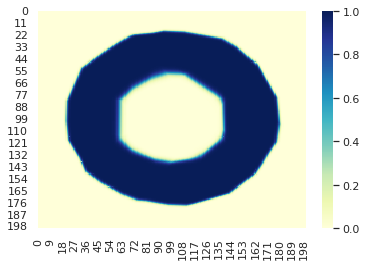


Epoch 65/100


100%|██████████| 20/20 [00:00<00:00, 561.60it/s]


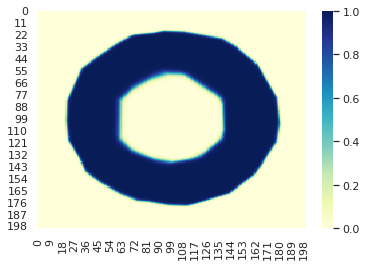


Epoch 66/100


100%|██████████| 20/20 [00:00<00:00, 609.42it/s]


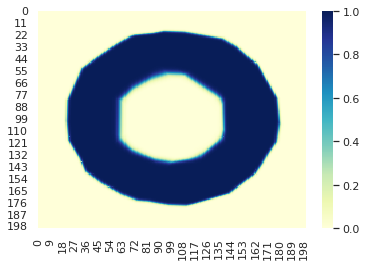


Epoch 67/100


100%|██████████| 20/20 [00:00<00:00, 622.23it/s]


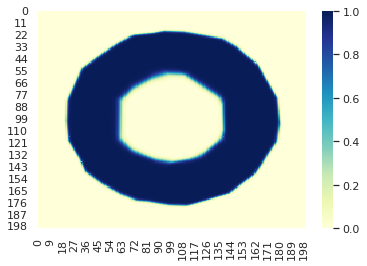


Epoch 68/100


100%|██████████| 20/20 [00:00<00:00, 577.64it/s]


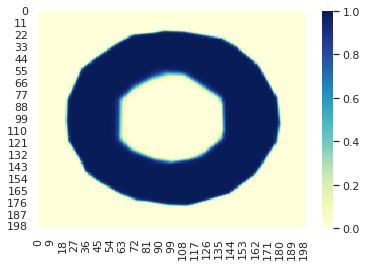


Epoch 69/100


100%|██████████| 20/20 [00:00<00:00, 575.48it/s]


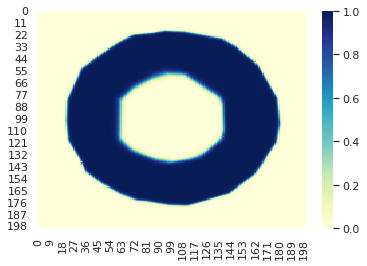


Epoch 70/100


100%|██████████| 20/20 [00:00<00:00, 644.03it/s]


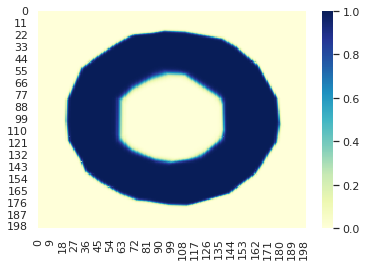


Epoch 71/100


100%|██████████| 20/20 [00:00<00:00, 592.19it/s]


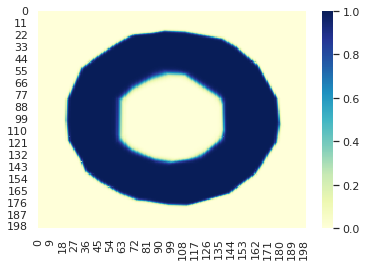


Epoch 72/100


100%|██████████| 20/20 [00:00<00:00, 642.99it/s]


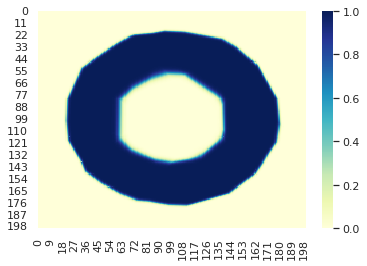


Epoch 73/100


100%|██████████| 20/20 [00:00<00:00, 622.19it/s]


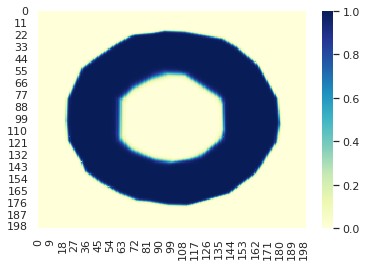


Epoch 74/100


100%|██████████| 20/20 [00:00<00:00, 544.47it/s]


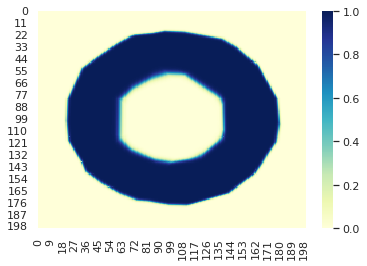


Epoch 75/100


100%|██████████| 20/20 [00:00<00:00, 690.94it/s]


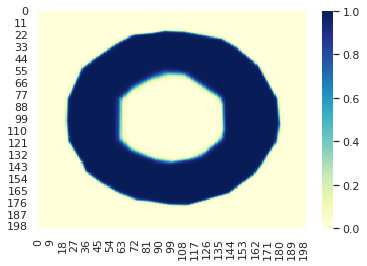


Epoch 76/100


100%|██████████| 20/20 [00:00<00:00, 649.51it/s]


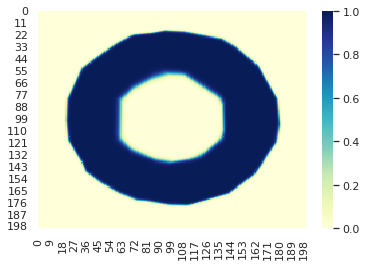


Epoch 77/100


100%|██████████| 20/20 [00:00<00:00, 594.64it/s]


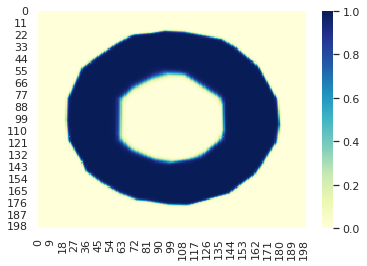


Epoch 78/100


100%|██████████| 20/20 [00:00<00:00, 611.97it/s]


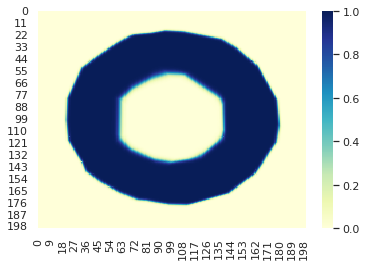


Epoch 79/100


100%|██████████| 20/20 [00:00<00:00, 634.54it/s]


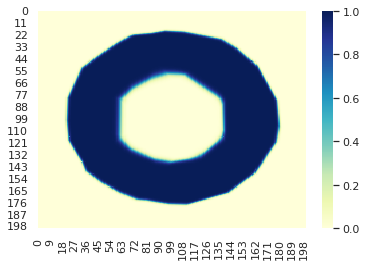


Epoch 80/100


100%|██████████| 20/20 [00:00<00:00, 607.71it/s]


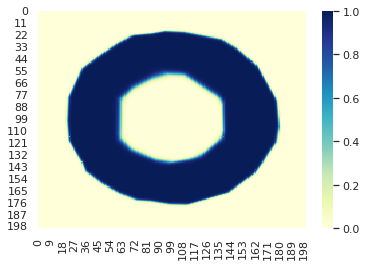


Epoch 81/100


100%|██████████| 20/20 [00:00<00:00, 607.91it/s]


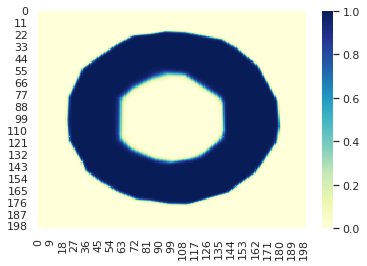


Epoch 82/100


100%|██████████| 20/20 [00:00<00:00, 595.37it/s]


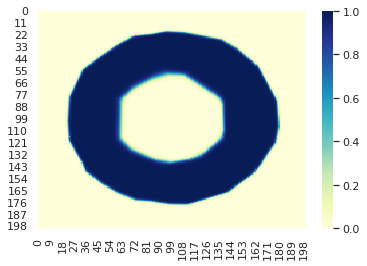


Epoch 83/100


100%|██████████| 20/20 [00:00<00:00, 614.82it/s]


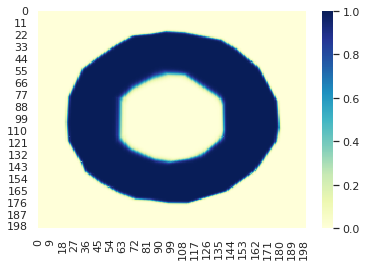


Epoch 84/100


100%|██████████| 20/20 [00:00<00:00, 611.36it/s]


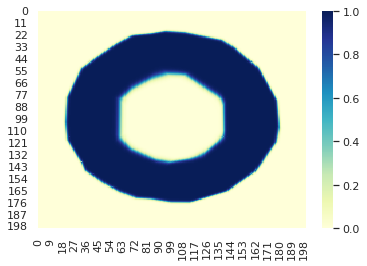


Epoch 85/100


100%|██████████| 20/20 [00:00<00:00, 628.90it/s]


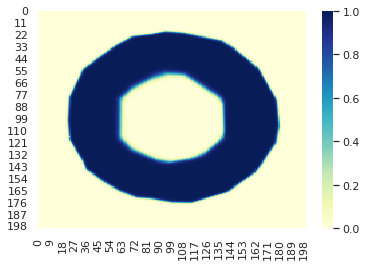


Epoch 86/100


100%|██████████| 20/20 [00:00<00:00, 550.11it/s]


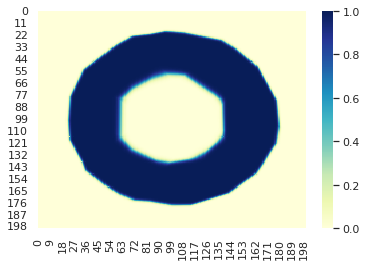


Epoch 87/100


100%|██████████| 20/20 [00:00<00:00, 606.24it/s]


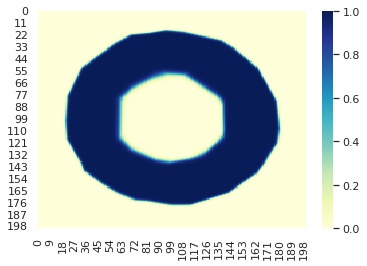


Epoch 88/100


100%|██████████| 20/20 [00:00<00:00, 600.55it/s]


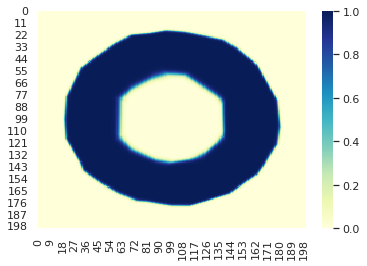


Epoch 89/100


100%|██████████| 20/20 [00:00<00:00, 597.55it/s]


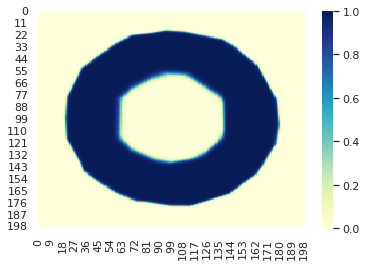


Epoch 90/100


100%|██████████| 20/20 [00:00<00:00, 620.73it/s]


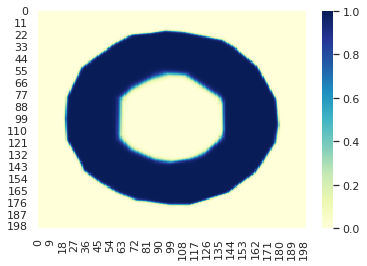


Epoch 91/100


100%|██████████| 20/20 [00:00<00:00, 528.50it/s]


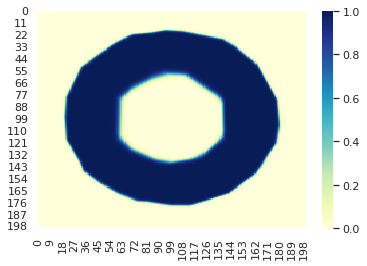


Epoch 92/100


100%|██████████| 20/20 [00:00<00:00, 683.41it/s]


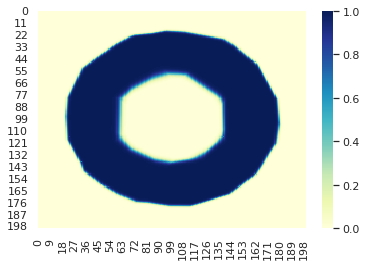


Epoch 93/100


100%|██████████| 20/20 [00:00<00:00, 609.59it/s]


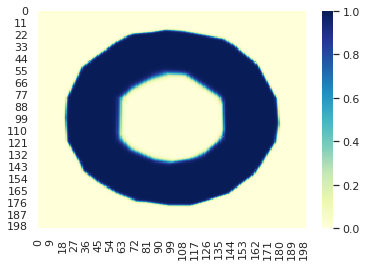


Epoch 94/100


100%|██████████| 20/20 [00:00<00:00, 496.74it/s]


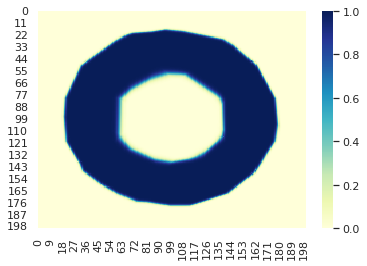


Epoch 95/100


100%|██████████| 20/20 [00:00<00:00, 589.79it/s]


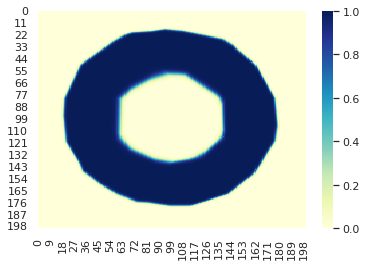


Epoch 96/100


100%|██████████| 20/20 [00:00<00:00, 596.07it/s]


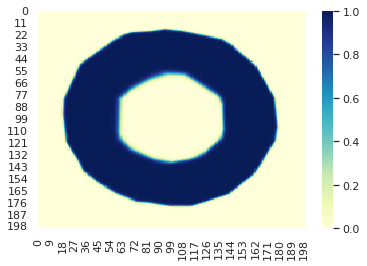


Epoch 97/100


100%|██████████| 20/20 [00:00<00:00, 503.33it/s]


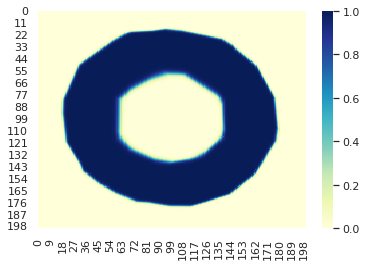


Epoch 98/100


100%|██████████| 20/20 [00:00<00:00, 651.58it/s]


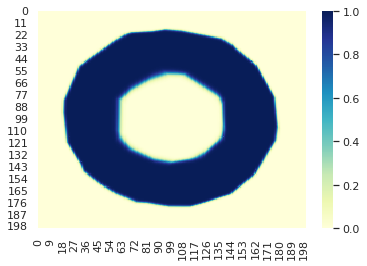


Epoch 99/100


100%|██████████| 20/20 [00:00<00:00, 455.20it/s]


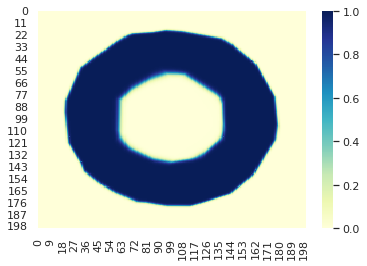


Epoch 100/100


100%|██████████| 20/20 [00:00<00:00, 605.60it/s]


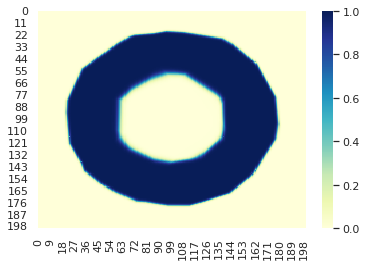

In [ ]:
train(model_original_copy_02, x_dilate, y_dilate, 100, 100, plotter)